<a href="https://colab.research.google.com/github/Mikeyb53/College-Football-Time-Machine/blob/main/College_Football_Playoff_Time_Machine_rev4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## <img style="float: left; padding-right: 10px; width: 45px" src="https://raw.githubusercontent.com/Harvard-IACS/2018-CS109A/master/content/styles/iacs.png"> Project Report

# What If The College Football Playoff Had a Time Machine?

**Harvard University**<br/>
**Spring 2025**<br/>
**Author**: Michael Benning

<hr style="height:2.4pt">

# Executive Summary
College football is a fixture in American culture.  Its traditions and passions connect students and alumni, families and fan bases, even Regions across time with a sense of identity, community, and pride.  But perhaps the only thing traditional about college football's method of selecting its national champion is change.  Last season saw the introduction of yet another iteration of the process: **the 12-team College Football Playoff**.

**Project Objective, Scope & Approach**

The project study applies a data-driven machine learning modeling approach to predict the outcomes of the 12-team College Football Playoff (CFP) if the current, expanded playoff format had been in place one year earlier: the 2023 season.  The study predicts the **Georgia Bulldogs** would have won such a playoff based on an approach with the following key attributes:
1. Three machine learning models are developed and trained using a **15,272-game dataset** spanning 16 seasons scraped from *collegefootballdata.com*.  The models leverage predictive information from 93 individual game statistics.
2. The best performing model is a fully connected neural network with 38,305 trainable parameters.  The model achieves an **R-squared value of 0.879** against unseen test data indicating over 87% of the variability in points scored in games can be explained by the model.
3. To predict the outcomes of hypothetical CFP matchups, **probability distributions for each of the 93 predictor variables is generated** based on each team's performance in the 2023 season, the performance of their opponents, and their respective schedule strengths.
4. The feature probability distributions and neural network model are brought together in a **Monte Carlo simulation** to probabalistically predict CFP game outcomes.

**Challenges**

The predictive utility of the approach is impacted by two significant challenges inherent in college football:
- **Uneven strength of schedule**:  while the neural network model described above predicts points scored with high accuracy, it requires robust predictions of the 93 input features including rushing and passing yards and third-down efficiency.  But teams' performance on the field is impacted by the level of competition.  The differences in strength of schedule across the 2023 CFP participants are material (detailed in Section 3.7) and a source of potentially significant bias in the model.  Addressing that bias adequately and equitably while prioritizing an exclusively data-driven approach (versus relying on poll-based rankings) is further challenged by the number of teams and conferences in the FBS and the limited number of meaningful interconference matchups.  Section 6.3 details how the models weight each team's performance during the 2023 season according to their strength of schedule.
- **Statistical significance** (or the lack thereof) presents multiple modeling challenges:
  - While the dataset used to train the predictive models contains over 15,000 individual football games, each team plays only a limited number of games each season.  This small sample size means statistical outliers can play an outsize role in predicting game outcomes.
  - The better team does not always win, and strong (statistical) performance does not always correlate with the outcome.  Games - particularly at the highest levels of college football - can be decided by a small number of key plays.  Accurately modeling the impact of a turnover or penalty at a key moment in a game is a challenge.

**Predicting Outcomes: Key Themes**

Thematically, two noteworthy takeaways emerge in the model predictions:
1. The **margins** separating the win / loss probabilities produced by the model **tend to be very narrow**.  Of the eleven playoff matchups, the model produced win probabilities over 60% in only three games.  For many fans, this is intuitively consistent with the level of competitive parity among the teams in the top echelon of college football.
2. **All games matter**.  Echoing the comments above regarding statistical significance, poor on-field performances - outliers or not - impact model predictions.  The projected upsets - defined as lower ranked teams beating higher ranked teams - highlighted below typically include poor performance in regular season games by the higher ranked team.

**Predictions vs. Rankings**

Consistent with the generally thin win/loss probability projections, the model outputs include a number of noteworthy upsets:
1. The model picks **#8 Oregon over #1 Michigan** in just over half the 1000 simulations.  It is worth noting Oregon played (statistically) the weakest schedule of the twelve playoff participants: the average of their opponents' 2023 win percentage was under 0.500 (see Section 3.4).  In addition, Michigan's statistically poor performances against Iowa, Maryland, and Penn State impacted the predictions.
2. **#12 Oklahoma over #5 Florida State**: a key predictor of points scored is *total yards gained* (detailed analysis in Section 4.3).  Despite winning, Florida State struggled against Georgia, Louisville, and Florida gaining fewer than 235 total yards in each of those games.
3. **#12 Oklahoma over #4 Alabama**: while Alabama struggled against Georgia and South Florida, Oklahoma racked up over 400 total yards in each of their games except two, and over 600 yards in three games.


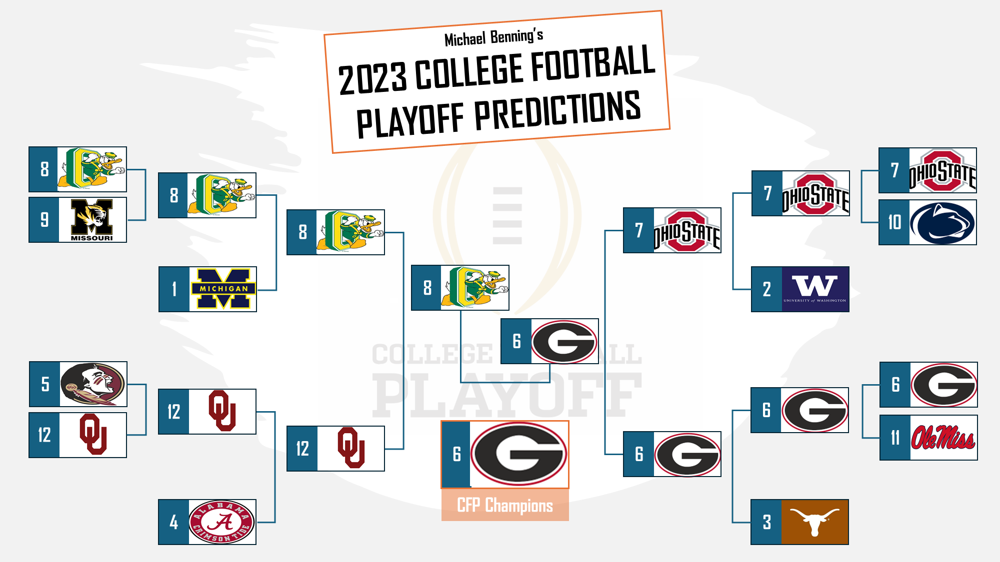

**Takeaway**

While a 12-team college football playoff will never happen, and the true predictive performance of the approach is unknowable, the model produces plausible projections based on a data-driven, probabalistic methodology.  The approach highlights the power and utility of combining machine learning algorithms and Monte Carlo simulation to probabalistically predict hypothetical real-world outcomes, and in the case of college football, add fuel to the fire of passionate fan bases.


<a id="contents"></a>

# Notebook contents

- [**1.0 Project Overview**](#Overview)

- [**2.0 Datasets**](#Datasets)

- [**3.0 Exploratory Data Analysis**](#EDA)

- [**4.0 Tree-Based Models**](#Trees)

- [**5.0 Neural Network Model**](#NN)

- [**6.0 Methodology: Feature Data Creation**](#Methodology)

- [**7.0 2023 College Football Playoff Predictions**](#CFP)

- [**8.0 Appendix: Data Dictionary**](#Appendix)


<a id="Overview"></a>

# 1.0 Project Overview

## 1.1 Introduction

College football has always been a bit "hokey".  At the sport’s highest tier – the Football Bowl Subdivision (FBS) – determining the season’s national champion is not done exclusively ***on the field***.  Instead, the process has historically been a meandering and controversial experiment involving voting from coaches and sportswriters, computer algorithms, a single national championship game, a 4-team playoff, and, of course, selection committees.  Yale (!) tops the list of programs with the most national championships with 18 (Alabama has 16 and Notre Dame has 13).  Admittedly, their last championship goes back to 1927, but still: "hokey".  Not surprisingly, determining a national champion has always been a boon for football analysts and pundits stirring passionate fan bases and fueling the inevitable controversy.

Last January college football crowned the Ohio State Buckeyes the national champions in the inaugural season of the expanded 12-team College Football Playoff (CFP):  the latest iteration of the meanderings, and a significant step toward actually determining the champion on the field.

College football has been a boon for fans and advertisers too.  ESPN's 12-year contract to televise just the two CFP semifinal games and the national championship game in the expanded 12-team playoff is valued at **\\$5.64 billion**.  The Big Ten conference – one of the "Power Five" conferences in the FBS, has television deals with FOX/FS1, CBS, NBC and the Big Ten Network worth an average of **\\$1.15 billion** annually to distribute a selection of regular season matchups$^{1}$.  In viewership terms, ABC’s coverage of the Southeastern Conference (SEC) attracted an average of **6.4 million viewers** per game in 2024 with the top game each Saturday averaging 7.9 million viewers$^{2}$.  According to statista.com$^{3}$, 57% of respondents identify as “casual” or “avid” fans of college football.

**If only college football had a time machine, millions of anguished fans everywhere could put their grievances to rest, and college football could be a bit less "hokey".**

$^{1}$[Current College Sports Television Contracts](https://businessofcollegesports.com/current-college-sports-television-contracts/)

$^{2}$[Ratings Roundup: College Football Sweeps Ratings Across All Networks](https://www.sportsvideo.org/2024/12/06/ratings-roundup-college-football-sweeps-ratings-across-all-networks/#:~:text=ESPN+%20recorded%20its%20most%2Dwatched,percent%20year%2Dover%2Dyear.)

$^{3}$[College football interest levels US 2023 | Statista](https://www.statista.com/statistics/1105178/college-football-interest-us/#:~:text=College%20football%20takes%20place%20in,football%20in%20the%20United%20States.)


<a id="Research_Q"></a>

## 1.2 Study Purpose & Objectives

The purpose of the study is to do the next best thing to building a time machine: to create a model to **predict the national champion** given the hypothetical matchups that would have occurred had the expanded CFP been implemented in the 2023 season.

Predicting the national champion requires achieving the following objectives:

1.	Train and evaluate a selection of model algorithms to predict points scored based on historical college football game data.
2.	Given that the 2023 playoff matchups are hypothetical, generate probability distributions of key model inputs (e.g., total yards gained, turnovers, etc.) based on teams' performance in 2023.
3.  Use random sampling of the generated probability distributions as input to the selected model algorithm to produce win/loss probabilities.


## 1.3 Methodology

The study relies on two key elements to produce win/loss projections.  First, three machine learning models are trained and evaluated against a random training / test split of the 15,272-game dataset.  The models are trained on the 93 available game statistics - or *features* - including total yards gained and passing efficiency to produce a regression model capable of predicting points scored.

Second, to predict the points scored in a hypothetical set of 2023 CFP games, the most likely feature values must be produced as input to the predictive models.  A subset of the dataset - specifically, the 2023 regular season games played by the CFP contenders and their opponents is used to create probability distributions of each of the 93 features.  These distributions describe the likelihood of a team gaining 200 yards in a game, for example, versus the likelihood of gaining 300 yards or 400 yards.  These distributions also incorporate the performance of the opponent's defense and the strength of their respective schedules.  Performances against opponents with high 2023 winning percentages are more heavily weighted.  The 93 probability distributions of Team A when they play Team B will not be the same 93 distributions as when Team A plays Team C.

Given one probability distribution for each of the 93 features, one thousand samples are drawn at random from each of the 93 distributions.  The 93 feature values are fed into the best-performing neural network model 1,000 times to produce a range of likely points scored against a particular team.  A win probability of 60% for Team A equates to Team A outscoring their opponent in 600 of the 1,000 simulated games.  This process of creating probability distributions and randomly sampling from them repetitively is known as Monte Carlo simulation.


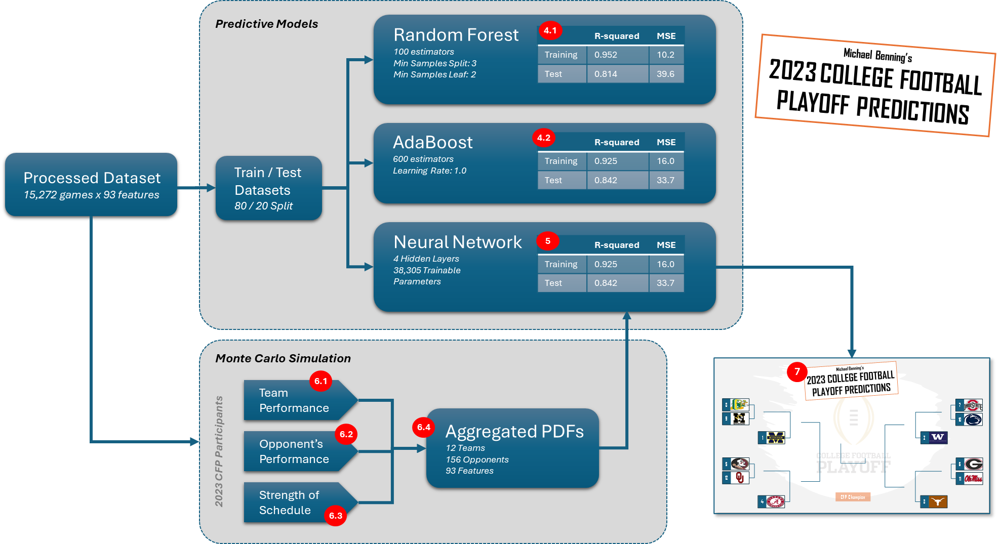

## 1.4 Playoff Participant Selection

The College Football Playoff participants are identified and seeded according to the following rules and criteria$^{4}$:

- The 12 participating teams will be the **five conference champions** ranked highest by the CFP selection committee, plus the next **seven highest-ranked teams**.
- The ranking of the teams will continue to be done by a selection committee.
- The **four highest-ranked conference champions will be seeded one through four** and will receive a first-round bye. The fifth conference champion will be seeded where it was ranked or at No. 12 if it is outside the top 12 rankings. Non-conference champions ranked in the top four will be seeded beginning at No. 5. Because of this, the seeding, 1 through 12, could look different than the final rankings.
- The eight teams seeded No. 5-12 will play in a first round with the higher seeds hosting the lower seeds either on campus or at other sites designated by the higher-seeded institution (No. 12 at No. 5, No. 11 at No. 6, No. 10 at No. 7 and No. 9 at No. 8.).

$^{4}$https://collegefootballplayoff.com/sports/2024/5/29/12-team-format.aspx#:~:text=The%2012%20participating%20teams%20will,SEC%20champion%20is%20ranked%20No.

Given these rules, the **2023-24 college football playoff bracket is expected to have been**:

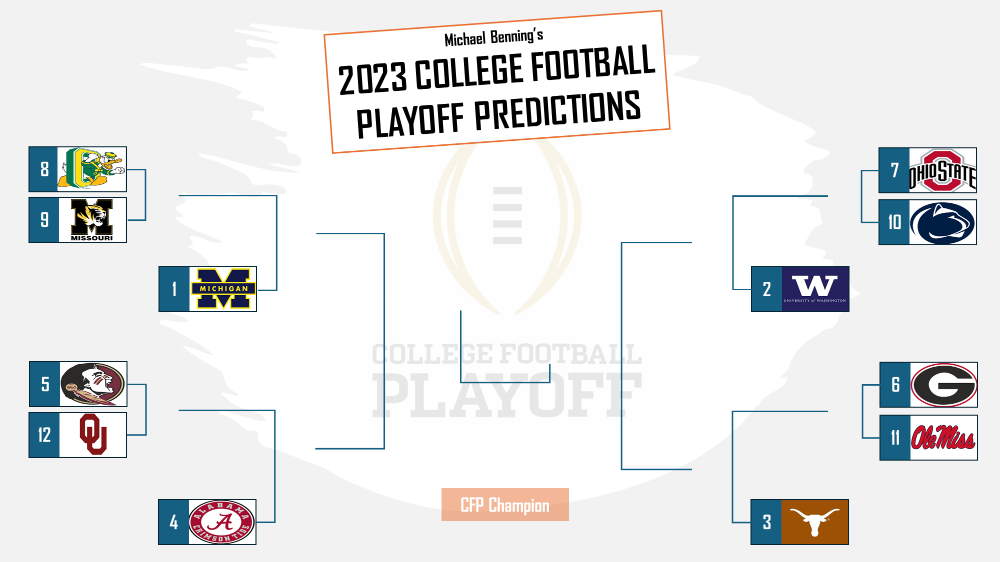

<a id="Datasets"></a>

# 2.0 Datasets

The datasets of interest are sourced from ***collegefootballdata.com***.  The code cells below collect three individual datasets (identified below as *Tables*) available from the site that are expected to provide meaningful information supporting win probability predictions.


<a id="Overview"></a>

## 2.1 Overview

***collegefootballdata.com*** offers two avenues for data download:  a site-based query/export utility, and a python-based API (documentation can be found at github.com/CFBD/cfbd-python/blob/master/docs/GamesApi).

Tables 1 and 2 are generated using the query utility to export data to two csv / MS Excel spreadsheets.  Table 3 is generated in chunks using the site's API.  Tables 1 and 2 are used to generate a list of unique game identification numbers as input to the API (step 3 in the schematic below).

Once scraped, the data in Table 3 requires parsing to align the structure of the data with that of Table 2.  Tables 2 and 3 are then merged and the output dataframe is written to a csv file entitled *merged_df_csv*.  The resulting dataframe contains 30544 rows x 104 columns and represents 15272 individual college football games (each game appears twice: once for each team).

For brevity, the code cells required to download, scrape, and merge the tables below are omitted from this project report.


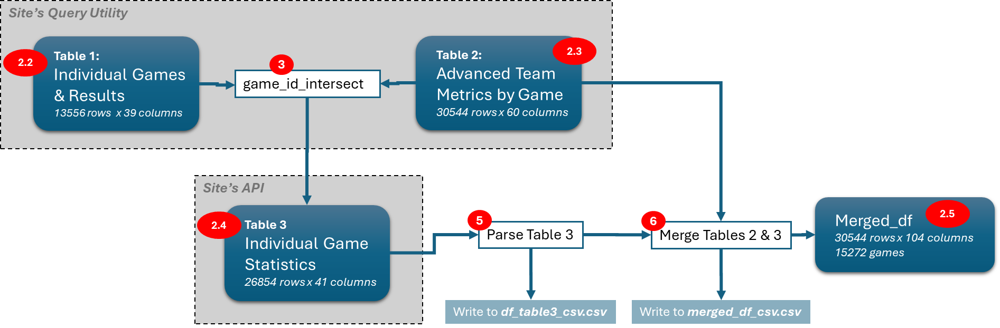

##### Import Libraries

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
from sklearn.impute import SimpleImputer
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.inspection import permutation_importance
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import OneHotEncoder
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import AdaBoostRegressor
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from sklearn.preprocessing import StandardScaler
from scipy.stats import norm
import random

In [ ]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


<a id="Read_Table_1"></a>

## 2.2 Read Table 1: Individual Games & Results
Table 1 contains 39 features, 13556 rows, and 13556 individual (unique) games spanning football seasons from 2009 to 2024:


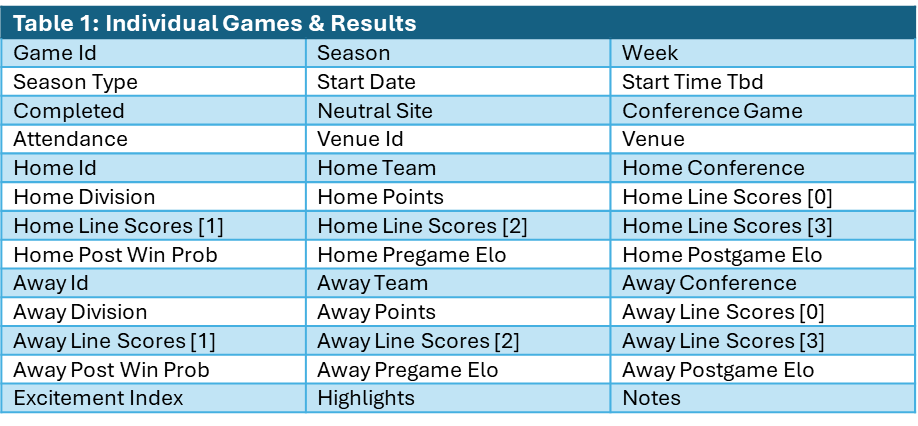

In [ ]:
df_results = pd.read_excel(r'/content/drive/My Drive/Python Scripts/Football Project/games_and_results.xlsx')
df_results.rename(columns = {'Id': 'game_id'}, inplace = True)
df_results.head()

,game_id,Season,Week,Season Type,Start Date,Start Time Tbd,Completed,Neutral Site,Conference Game,Attendance,...,Away Line Scores[0],Away Line Scores[1],Away Line Scores[2],Away Line Scores[3],Away Post Win Prob,Away Pregame Elo,Away Postgame Elo,Excitement Index,Highlights,Notes
0,401635525,2024,1,regular,2024-08-24T16:00:00.000Z,0.0,True,True,True,NaN,...,8.0,6.0,0.0,7.0,0.008604,1692.0,1676.0,7.822224,NaN,Aer Lingus College Football Classic
1,401643697,2024,1,regular,2024-08-24T20:00:00.000Z,0.0,True,False,False,NaN,...,0.0,14.0,0.0,21.0,0.698899,NaN,NaN,4.927318,NaN,NaN
2,401643696,2024,1,regular,2024-08-25T00:00:00.000Z,0.0,True,False,False,NaN,...,0.0,10.0,3.0,16.0,0.897291,1690.0,1669.0,7.671492,NaN,NaN
3,401643858,2024,1,regular,2024-08-25T03:59:00.000Z,0.0,True,False,False,NaN,...,0.0,7.0,7.0,0.0,0.043531,NaN,NaN,5.224356,NaN,NaN
4,401628458,2024,1,regular,2024-08-29T22:00:00.000Z,0.0,True,False,False,NaN,...,0.0,7.0,0.0,0.0,0.003017,NaN,NaN,4.681952,NaN,NaN


In [ ]:
print('Results dataframe shape:', df_results.shape[0], 'rows x ', df_results.shape[1], 'columns')
print('The count of unique game IDs:', df_results['game_id'].unique().shape[0])
print('The dataset spans seasons', df_results['Season'].min(), 'to', df_results['Season'].max(), '\n')

Results dataframe shape: 13556 rows x  39 columns
The count of unique game IDs: 13556
The dataset spans seasons 2009 to 2024 



<a id="Read_Table_2"></a>

## 2.3 Read Table 2: Advanced Team Metrics
Table 2 contains 60 features, 30544 rows, and 15272 individual (unique) games.  Of the 15272 games in Table 2, 13435 also appear in Table 1.


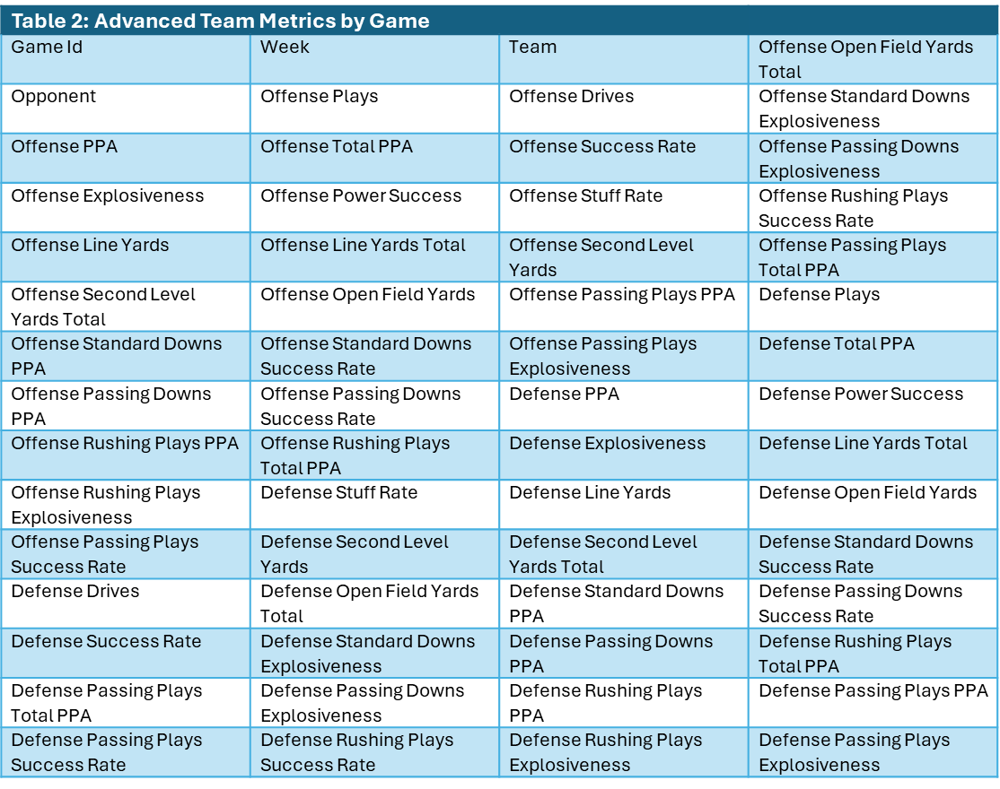

In [ ]:
df_adv_metrics = pd.read_excel(r'/content/drive/My Drive/Python Scripts/Football Project/advanced_team_metrics_by_game.xlsx')
df_adv_metrics.rename(columns = {'GameId': 'game_id'}, inplace = True)
df_adv_metrics.head()

,game_id,Week,Team,Opponent,Offense Plays,Offense Drives,Offense Ppa,Offense TotalPPA,Offense SuccessRate,Offense Explosiveness,...,Defense PassingDowns SuccessRate,Defense PassingDowns Explosiveness,Defense RushingPlays Ppa,Defense RushingPlays TotalPPA,Defense RushingPlays SuccessRate,Defense RushingPlays Explosiveness,Defense PassingPlays Ppa,Defense PassingPlays TotalPPA,Defense PassingPlays SuccessRate,Defense PassingPlays Explosiveness
0,401628319,1,Alabama,Western Kentucky,65,14,0.671310,43.635162,0.492308,1.865419,...,0.138889,1.774230,-0.415749,-10.809485,0.115385,0.817390,-0.161731,-6.630966,0.170732,1.626537
1,401628319,1,Western Kentucky,Alabama,67,14,-0.260305,-17.440451,0.149254,1.383793,...,0.600000,2.823282,0.445091,20.919277,0.425532,1.679853,1.261994,22.715885,0.666667,2.174696
2,401628320,1,Arkansas,Arkansas-Pine Bluff,70,10,0.789200,55.244018,0.742857,1.240258,...,0.250000,2.190415,-0.512461,-9.736763,0.263158,0.563175,0.112467,3.036600,0.259259,2.005048
3,401628320,1,Arkansas-Pine Bluff,Arkansas,46,11,-0.145656,-6.700163,0.260870,1.404268,...,0.750000,2.000610,0.853411,28.162563,0.757576,1.221129,0.731931,27.081455,0.729730,1.257969
4,401628321,1,Alabama A&M,Auburn,70,15,-0.199454,-13.961756,0.242857,1.372830,...,0.555556,2.537806,0.532692,9.588455,0.722222,0.825773,1.130122,29.383168,0.538462,2.536153


In [ ]:
print('Results dataframe shape:', df_adv_metrics.shape[0], 'rows x', df_adv_metrics.shape[1], 'columns')
print('The count of unique game IDs:', df_adv_metrics['game_id'].unique().shape[0], '\n')

Results dataframe shape: 30544 rows x 60 columns
The count of unique game IDs: 15272 



<a id="Table_3"></a>

## 2.4. Read Table 3: Individual Game Statistics

The following data is scraped team/game data from *collegefootballdata.com* by *game_id*:


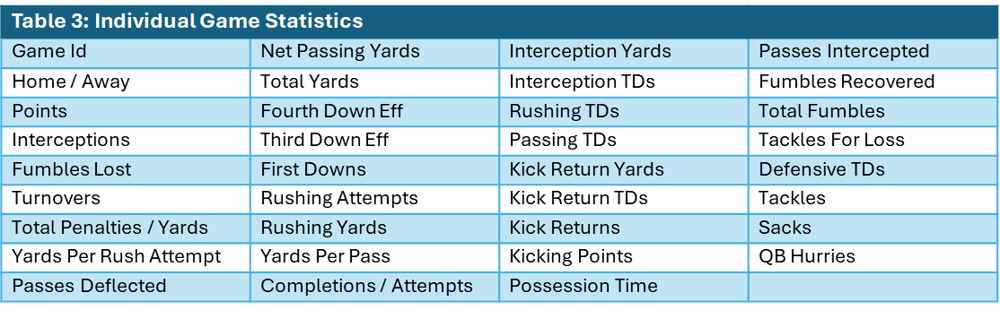

In [ ]:
df_table3 = pd.read_csv(r'/content/drive/My Drive/Python Scripts/Football Project/df_table3_csv.csv')
df_table3.rename(columns = {'school': 'Team'}, inplace = True)   # rename school to Team
df_table3.head()

,game_id,conference,home_away,points,Team,school_id,fumblesRecovered,rushingTDs,puntReturnYards,puntReturnTDs,...,interceptionYards,interceptionTDs,passesIntercepted,totalFumbles,tacklesForLoss,defensiveTDs,tackles,sacks,qbHurries,passesDeflected
0,322732032,Sun Belt,home,13,Arkansas State,2032,0.0,0.0,2.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,322732032,Sun Belt,away,26,Western Kentucky,98,1.0,1.0,1.0,0.0,...,8.0,0.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,302612483,Big Sky,away,0,Portland State,2502,2.0,0.0,1.0,0.0,...,1.0,0.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,302612483,Pac-10,home,69,Oregon,2483,3.0,5.0,68.0,0.0,...,13.0,0.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,302612509,Big Ten,home,24,Purdue,2509,0.0,0.0,5.0,0.0,...,26.0,0.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
print('Results dataframe shape:', df_table3.shape[0], 'rows x', df_table3.shape[1], 'columns')
print('The count of unique game IDs:', df_table3['game_id'].unique().shape[0], '\n')

Results dataframe shape: 26854 rows x 41 columns
The count of unique game IDs: 13427 



<a id="Merge_Tables"></a>

## 2.5 Read Merged DataFrame

Tables 2 and 3 are merged and read below as *merged_df*.  Features *possessionTime* and *Season* are added to the dataframe from Table 1.  Per the code cell below, a small number of features must be parsed to create interpretable data.

In [ ]:
merged_df = pd.read_csv(r'/content/drive/My Drive/Python Scripts/Football Project/merged_df_csv.csv')
merged_df = pd.merge(merged_df, df_results[['game_id', 'Season']], on = 'game_id', how = 'left')

merged_df['possessionTime'] = merged_df['possessionTime'].fillna('0:0')
merged_df['possessionTime'] = merged_df['possessionTime'].map(
    lambda x: (datetime.strptime(x, '%M:%S').minute + datetime.strptime(x, '%M:%S').second / 60))

merged_df['totalPenaltiesYards'] = merged_df['totalPenaltiesYards'].fillna('0-0')
merged_df['penalty_count'] = merged_df['totalPenaltiesYards'].map(lambda x: int(x.split('-')[0]))
merged_df['net_penalty_yards'] = merged_df['totalPenaltiesYards'].map(lambda x: int(x.split('-')[-1]))

merged_df['thirdDownEff'] = merged_df['thirdDownEff'].fillna('0-0')
merged_df['thirdDownEff'] = merged_df['thirdDownEff'].map(
    lambda x: (int(x.split('-')[0]) / int(x.split('-')[-1])) if int(x.split('-')[0]) != 0 else 0)

merged_df['fourthDownEff'] = merged_df['fourthDownEff'].fillna('0-0')
merged_df['fourthDownEff'] = merged_df['fourthDownEff'].map(
    lambda x: (int(x.split('-')[0]) / int(x.split('-')[-1])) if int(x.split('-')[0]) != 0 else 0)

merged_df['completionAttempts'] = merged_df['completionAttempts'].fillna('0-0')
merged_df['passing_attempts'] = merged_df['completionAttempts'].map(lambda x: int(x.split('-')[0]))
merged_df['passing_completions'] = merged_df['completionAttempts'].map(lambda x: int(x.split('-')[-1]))

print('Merged_df dataframe shape:', merged_df.shape[0], 'rows x', merged_df.shape[1], 'columns')
print('The number of unique game IDs:', len(merged_df['game_id'].unique()))

merged_df.head()

Merged_df dataframe shape: 30544 rows x 104 columns
The number of unique game IDs: 15272


,game_id,Week,Team,Opponent,Offense Plays,Offense Drives,Offense Ppa,Offense TotalPPA,Offense SuccessRate,Offense Explosiveness,...,defensiveTDs,tackles,sacks,qbHurries,passesDeflected,Season,penalty_count,net_penalty_yards,passing_attempts,passing_completions
0,401628319,1,Alabama,Western Kentucky,65,14,0.671310,43.635162,0.492308,1.865419,...,0.0,31.0,1.0,3.0,8.0,2024.0,7,59,12,18
1,401628319,1,Western Kentucky,Alabama,67,14,-0.260305,-17.440451,0.149254,1.383793,...,0.0,43.0,1.0,0.0,1.0,2024.0,4,40,22,40
2,401628320,1,Arkansas,Arkansas-Pine Bluff,70,10,0.789200,55.244018,0.742857,1.240258,...,0.0,22.0,4.0,5.0,4.0,2024.0,6,48,28,37
3,401628320,1,Arkansas-Pine Bluff,Arkansas,46,11,-0.145656,-6.700163,0.260870,1.404268,...,0.0,26.0,0.0,0.0,2.0,2024.0,5,35,11,23
4,401628321,1,Alabama A&M,Auburn,70,15,-0.199454,-13.961756,0.242857,1.372830,...,0.0,24.0,0.0,0.0,2.0,2024.0,7,60,16,34


<a id="EDA"></a>

# 3.0 Exploratory Data Analysis

Section 3 overviews the target variable (*points scored*) and explores a number of key aspects of the datasets including missing data, strength of schedule, association of features with the target variable, and the performance of the 2023 CFP participants relative to the larger dataset.

Perhaps the most important outcome from the exploratory data analysis is the creation of the additional feature *season_win_pct* representing each team's season winning percentage.  The addition of this feature serves to weight the individual performances in developing probability distributions in Section 6.

<a id="Merge_Tables"></a>

## 3.1 Missing Data

The code cells below illustrate the number of missing observations by feature for Tables 2 and 3.  Missing data is clearly a more significant issue with Table 3, with ten features missing over 10,000 observations, and another three with over 6,000 missing observations.

The **strategy for dealing with missing data** is as follows:
 - For features missing fewer than 3,000 observations (~10%), the missing numerical values are imputed as the **mean value for the program** (i.e., university) across all seasons in the dataset.  In a small number of instances, the program is captured in the dataset only once.  In these cases, the mean value across all programs is used.
 - The 12 features missing more than 6,000 features are dropped from the dataset.  Some of the 12 features are redundant with other features in the dataset.  *total fumbles*, and *passes intercepted* both have a large number of missing values, but are redundant with *interceptions, fumbles lost*, and *turnovers* (with no missing values).  In other of the 12 features, the informative nature of the features is questionable as it relates to predicting points scored.  These include, for example, *passes deflected, QB hurries*, and *tackles for loss*.  The impact of dropping these 12 features is considered negligible.

It should be noted exploration of the data suggests a **non-random aspect to the missing data**, and that, while spread across a number of universities, missingness is concentrated among non-"Power 5" conference programs.  Given the study's objective is focused on predicting outcomes of matchups among the top performers in the FBS, this is not considered a significant issue.


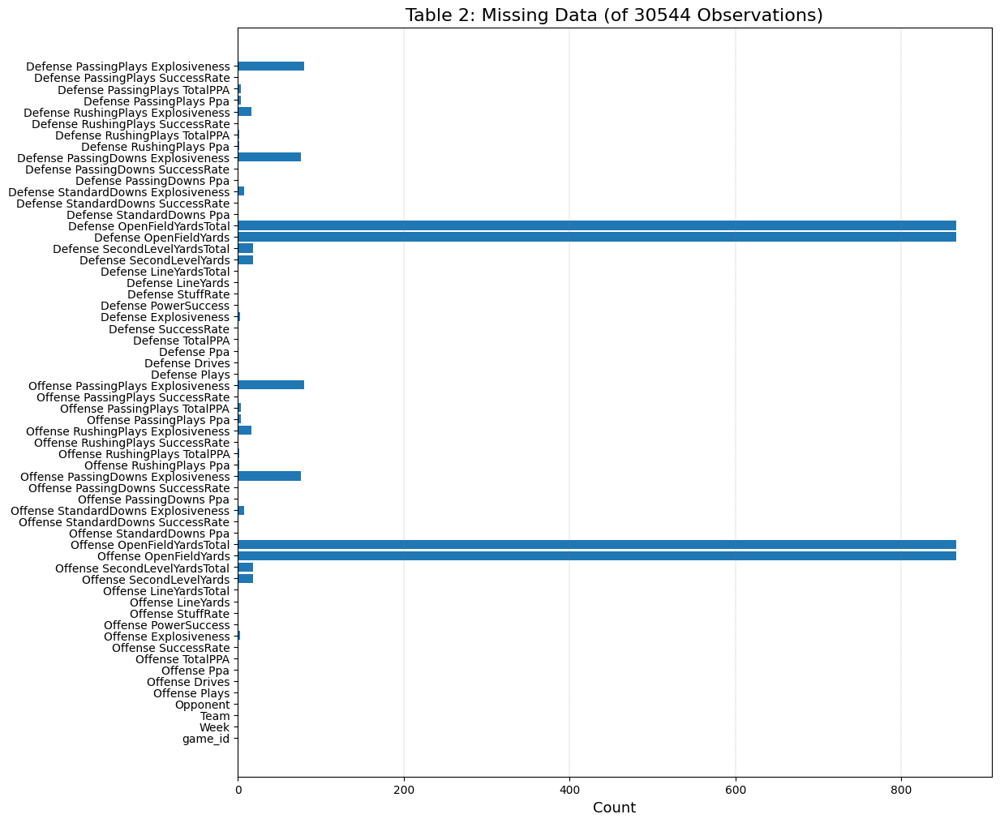

In [ ]:
plt.figure(figsize = (12, 12))
plt.barh(df_adv_metrics.isnull().sum().index, df_adv_metrics.isnull().sum())
plt.title('Table 2: Missing Data (of 30544 Observations)', fontsize = 16)
plt.xlabel('Count', fontsize = 13)
plt.grid(axis = 'x', color = 'gray', linestyle = '--', linewidth = 0.25);

<center>Figure 3.1.1: Missing Data - Table 2</center>

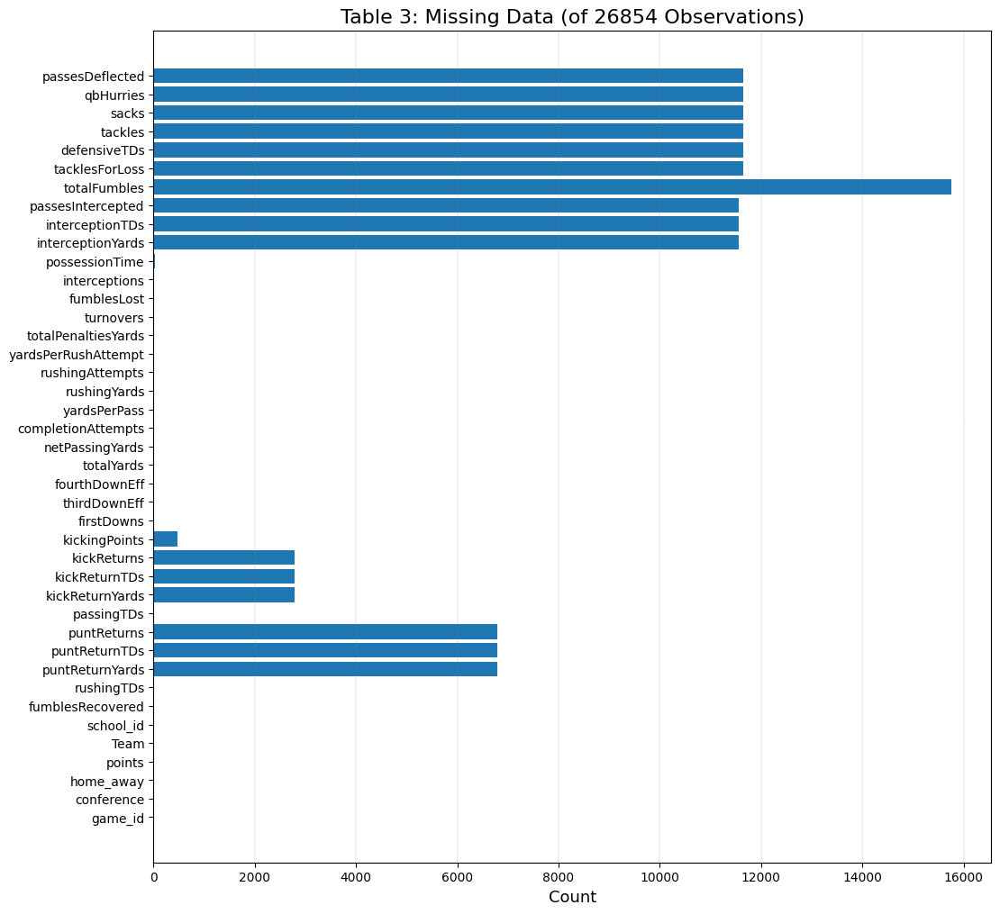

In [ ]:
plt.figure(figsize = (12, 12))
plt.barh(df_table3.isnull().sum().index, df_table3.isnull().sum())
plt.title('Table 3: Missing Data (of 26854 Observations)', fontsize = 16)
plt.xlabel('Count', fontsize = 13)
plt.grid(axis = 'x', color = 'gray', linestyle = '--', linewidth = 0.25);

<center>Figure 3.1.2: Missing Data - Table 3</center>

The following cell drops 12 features with a relatively large number of missing values (> 6000) and imputes missing values in the merged dataframe (*merged_df*) using the individual feature's mean value **for the individual team**.

In [ ]:
merged_df = merged_df.drop(['passesDeflected', 'qbHurries', 'sacks',
                            'tackles', 'defensiveTDs', 'tacklesForLoss',
                            'passesIntercepted', 'interceptionTDs',
                            'totalFumbles', 'interceptionYards', 'puntReturns',
                            'puntReturnTDs', 'puntReturnYards',
                           ], axis = 1)

mean_imputer = SimpleImputer(missing_values = np.nan, strategy = 'mean', copy = False)

numeric_features = [feature for feature in merged_df.columns if merged_df[feature].dtype != 'object']

for team in merged_df['Team'].unique():
    mask = merged_df['Team'] == team
    if merged_df.loc[mask, numeric_features].mean().isna().any():
        mask_means = merged_df[numeric_features].mean()
        merged_df.loc[mask, numeric_features] = merged_df.loc[mask, numeric_features].fillna(mask_means)
    else:
        merged_df.loc[mask, numeric_features] = mean_imputer.fit_transform(merged_df.loc[mask, numeric_features])

print('Merged_df dataframe shape:', merged_df.shape[0], 'rows x', merged_df.shape[1], 'columns')
print('The number of unique game IDs:', len(merged_df['game_id'].unique()))

Merged_df dataframe shape: 30544 rows x 91 columns
The number of unique game IDs: 15272


In [ ]:
merged_df.to_csv('merged_df_no_miss.csv', index = False)

## 3.2 Games by Season & Conference

Apart from the COVID-impacted 2020 season, the dataset contains over 800 games per year over the 16 seasons beginning in 2009.  The dataset is dominated by the SEC, ACC, Big Ten, Conference USA, Mountain West, Big 12, Sunbelt, Pac-12, and American Athletic conferences.  **These FBS conferences account for over 90% of the dataset**.

**Note**:  the dataset accurately reflects the state of program / conference alignment over time, and does NOT attempt to reflect the most current state of conference alignment.  As a result, some programs may appear in multiple conferences at different times (the University of Southern California, for example, appears as a member of the Big Ten, PAC-10, and PAC-12 conferences), and some conferences have changed names as a result of realignment (the PAC-10 has become the PAC-12, for example).

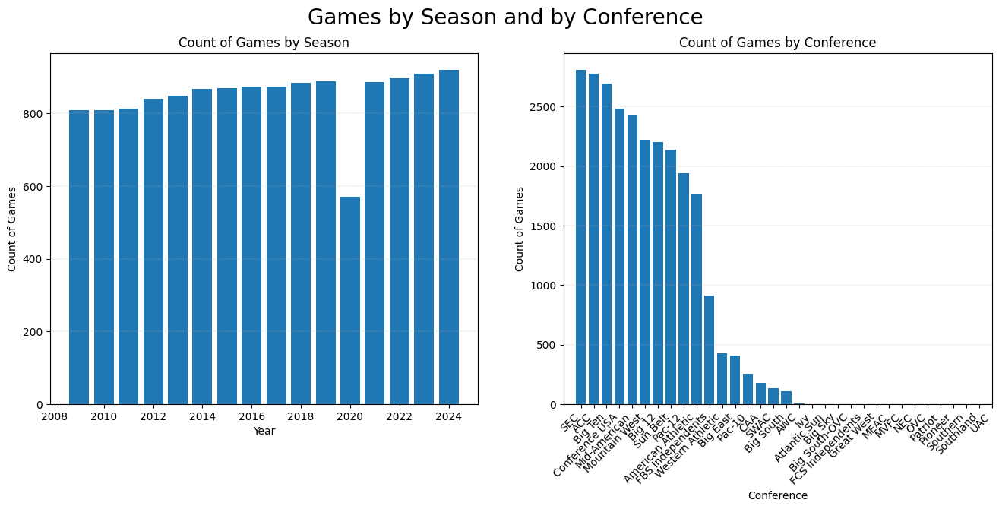

In [ ]:
fig, axes = plt.subplots(1, 2, figsize = (16, 6))
axes = axes.flatten()
plt.suptitle(('Games by Season and by Conference'), fontsize = 20)

axes[0].bar(df_results.groupby(['Season'])['game_id'].count().index, df_results.groupby(['Season'])['game_id'].count())
axes[0].set_title('Count of Games by Season')
axes[0].set_ylabel('Count of Games')
axes[0].set_xlabel('Year')
axes[0].grid(axis = 'y', linestyle = '--', linewidth = 0.25)

temp = df_results.groupby(['Away Conference'])['game_id'].count() + df_results.groupby(['Home Conference'])['game_id'].count()
temp = temp.sort_values(ascending = False)
axes[1].bar(temp.index, temp)
axes[1].set_title('Count of Games by Conference')
axes[1].set_ylabel('Count of Games')
axes[1].set_xlabel('Conference')
axes[1].set_xticks(temp.index, temp.index, rotation = 45, ha = 'right')
axes[1].grid(axis = 'y', linestyle = '--', linewidth = 0.25);

<center>Figure 3.2: Games by Season & Conferences</center>

## 3.3 Points Scored by Conference

The plots below illustrate the average per game points scored and points allowed by conference.  Both plots focus exclusively on FBS conferences.  Clearly the average points scored are relatively tightly grouped ranging from 31.7 points in the Big 12 conference to 26.4 in the Mid-American conference.

On the defensive side of the football, the Western Athletic conference allowed the most points per game on average at 30.0, while the Big East conference allowed the fewest on average at 22.1.

Notably, a small number of conferences showed significant average differences between average points scored and average points allowed.  These include the Big 12 (31.7 vs. 27.5), Pac 12 (30.9 vs. 27.9), and SEC (30.3 vs. 23.5).

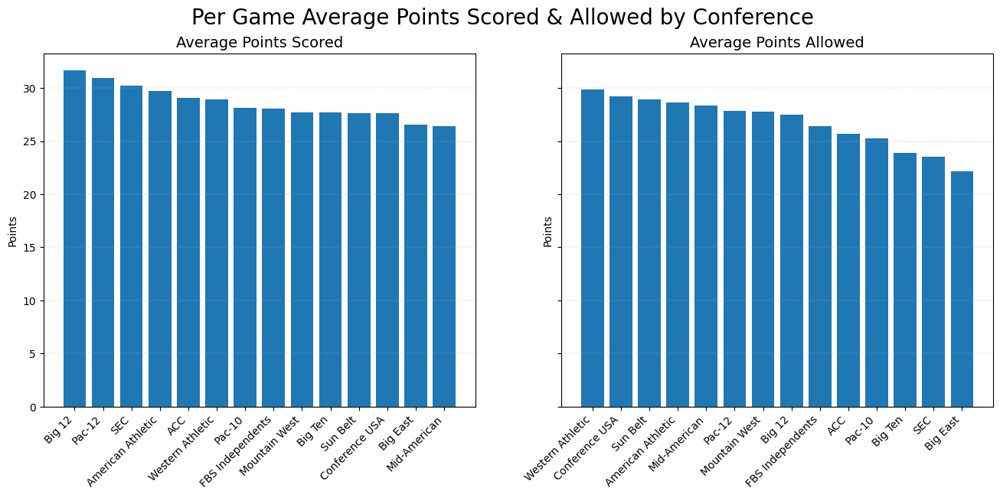

In [ ]:
fbs_conference_list = df_results[df_results['Home Division'] == 'fbs']['Home Conference'].unique()
avg_pts_scored_list, avg_pts_allowed_list = [], []

for conf in fbs_conference_list:
    avg_pts_scored = (df_results[df_results['Home Conference'] == conf]['Home Points'].sum() +
                  df_results[df_results['Away Conference'] == conf]['Away Points'].sum()) / (
                df_results[df_results['Home Conference'] == conf]['Home Points'].count() +
                df_results[df_results['Away Conference'] == conf]['Away Points'].count())
    avg_pts_scored_list.append(avg_pts_scored)

for conf in fbs_conference_list:
    avg_pts_allowed = (df_results[df_results['Home Conference'] == conf]['Away Points'].sum() +
                  df_results[df_results['Away Conference'] == conf]['Home Points'].sum()) / (
                df_results[df_results['Home Conference'] == conf]['Away Points'].count() +
                df_results[df_results['Away Conference'] == conf]['Home Points'].count())
    avg_pts_allowed_list.append(avg_pts_allowed)

temp_df = pd.DataFrame({'conference': fbs_conference_list,
                        'pts_scored': avg_pts_scored_list,
                        'pts_allowed': avg_pts_allowed_list})

fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = True)
axes = axes.flatten()
plt.suptitle(('Per Game Average Points Scored & Allowed by Conference'), fontsize = 20)
axes[0].bar(temp_df.sort_values('pts_scored', ascending = False)['conference'],
            temp_df.sort_values('pts_scored', ascending = False)['pts_scored'])
axes[1].bar(temp_df.sort_values('pts_allowed', ascending = False)['conference'],
            temp_df.sort_values('pts_allowed', ascending = False)['pts_allowed'])

for i, j in zip(range(2), ['Average Points Scored', 'Average Points Allowed']):
    axes[i].set_title(j, fontsize = 14)
    axes[i].grid(axis = 'y', linestyle = '--', linewidth = 0.25)
    axes[i].set_ylabel('Points')
    axes[i].set_xticks(fbs_conference_list, fbs_conference_list, rotation = 45, ha = 'right');

<center>Figure 3.3: Points by Conferences</center>

## 3.4 Distribution of Points Scored

Using the entirety of the dataset (both FBS and FCS subdivisions), the plots below illustrate the points scored by game-winning teams and game-losing teams.  The histograms on the left present frequency distributions of points scored by the two groups.  The **median score among game-winners in the dataset is 36.0 points**, while the corresponding **median score among game-losers is 17.0**.

The sub-plot on the right presents a cumulative probability distribution of winning the football games in the dataset as a function of points scored.  The plot indicates **scoring 18 or more points would win 50% of the games** in the dataset, while **scoring 34 or more points would win 90%** of the games in the dataset.

In [ ]:
df_results['winning_points'] = df_results.index.map(
    lambda x: df_results.loc[x, 'Home Points'] if
    df_results.loc[x, 'Home Points'] >
    df_results.loc[x, 'Away Points'] else
    df_results.loc[x, 'Away Points'])

df_results['losing_points'] = df_results.index.map(
    lambda x: df_results.loc[x, 'Home Points'] if
    df_results.loc[x, 'Home Points'] <
    df_results.loc[x, 'Away Points'] else
    df_results.loc[x, 'Away Points'])

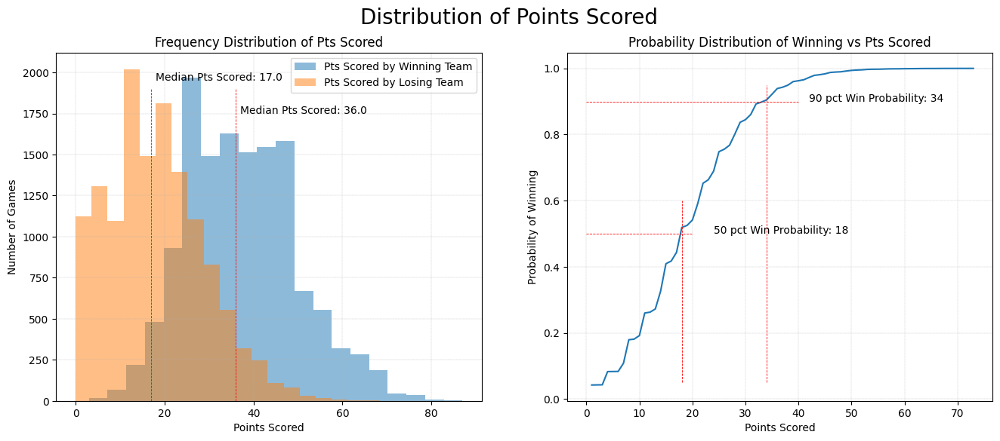

In [ ]:
fig, axes = plt.subplots(1, 2, figsize = (16, 6))
axes = axes.flatten()
plt.suptitle(('Distribution of Points Scored'), fontsize = 20)

axes[0].hist(df_results['winning_points'], label = 'Pts Scored by Winning Team', alpha = 0.5, bins = 20)
axes[0].hist(df_results['losing_points'], label = 'Pts Scored by Losing Team', alpha = 0.5, bins = 20)
axes[0].plot([df_results['winning_points'].median(), df_results['winning_points'].median()], [0, 1900],
             color = 'r', linestyle = '--', linewidth = 0.6)
axes[0].plot([df_results['losing_points'].median(), df_results['losing_points'].median()], [0, 1900],
             color = 'r', linestyle = '--', linewidth = 0.6)
axes[0].annotate('Median Pts Scored: %.1f' % (df_results['winning_points'].median()), xy = [37, 1750])
axes[0].annotate('Median Pts Scored: %.1f' % (df_results['losing_points'].median()), xy = [18, 1950])
axes[0].set_ylabel('Number of Games')
axes[0].set_xlabel('Points Scored')
axes[0].legend()
axes[0].grid(linestyle = '--', linewidth = 0.25)
axes[0].set_title('Frequency Distribution of Pts Scored')

axes[1].plot(df_results.groupby(['losing_points'])['game_id'].count().index + 1,
             df_results.groupby(['losing_points'])['game_id'].count().cumsum() / len(df_results))
axes[1].grid(linestyle = '--', linewidth = 0.25)
axes[1].set_title('Probability Distribution of Winning vs Pts Scored')
axes[1].set_ylabel('Probability of Winning')
axes[1].set_xlabel('Points Scored')

def points(series, threshold):
    for score, prob in zip(series.index, series):
        if prob > threshold: return score

fifty_percentile = points((df_results.groupby(['losing_points'])['game_id'].count().cumsum() / len(df_results)), 0.5)
ninety_percentile = points((df_results.groupby(['losing_points'])['game_id'].count().cumsum() / len(df_results)), 0.9)

axes[1].plot([0, 20], [0.5, 0.5], color = 'r', linestyle = '--', linewidth = 0.6)
axes[1].plot([fifty_percentile + 1, fifty_percentile + 1], [0.05, 0.6], color = 'r', linestyle = '--', linewidth = 0.6)
axes[1].plot([0, 40], [0.9, 0.9], color = 'r', linestyle = '--', linewidth = 0.6)
axes[1].plot([ninety_percentile + 1, ninety_percentile + 1], [0.05, 0.95], color = 'r', linestyle = '--', linewidth = 0.6)
axes[1].annotate('50 pct Win Probability: %.0f' % (fifty_percentile + 1), xy = [24, 0.5])
axes[1].annotate('90 pct Win Probability: %.0f' % (ninety_percentile + 1), xy = [42, 0.9]);

<center>Figure 3.4: Distribution of Points Scored</center>

## 3.5 Correlation Coefficients vs Points Scored

The bar charts below illustrate the strength of the linear relationship of individual features to points scored by measuring the correlation coefficient.  A perfect positive linear relationship is indicated by a coefficient of 1, and a perfect negative linear relationship is indicated by -1.  The target variable *points* appears at the top of both subplots and represents points scored in the games in the dataset.  The bar corresponding to *points* represents the correlation with itself, so naturally, its value is 1.0.

Positive coefficient values indicate feature values generally increase with increasing points scored, while negative values indicate increasing feature values correspond with decreasing points scored.

Strongly correlated offensive features include:
- Total yards, rushing yards, and yards per pass
- Offense PPA / Total PPA
- Rushing touchdowns
- Offense Success Rate
- First downs
- Kicking points
- Passing touchdowns
- Offense Rushing Plays PPA / Total PPA
- Offense Passing Plays PPA / Total PPA

It is no surprise *rushing touchdowns, passing touchdowns*, and *kicking points* would correlate strongly to points scored as all three translate quite directly to points scored.

*PPA* is *predicted points added* and represents the expected points added in a given play.  It is a value calculated by the *collegefootballdata.com* website and assigns point values to yard lines predicting points added based on down, distance and field position.  A negative value means that the opposing team would be expected to score the next points in the game.

*Passing Downs* are defined as 2nd downs with 7 or more yards to go or 3rd and 4th downs with 5 or more yards to go.

*Success Rate* is an efficiency metric that determines the success of a play. Successful plays meet one of the following criteria:
- the offense scored
- 1st downs which gain at least 50% of the yards to go
- 2nd downs which gain at least 70% of the yards to go
- 3rd and 4th downs which gain at least 100% of the yards to go

The defensive features most strongly correlated with points scored include:
- Defense success rate
- turnovers and interceptions
- Defense line yards
- Defense PPA

The appendix in Section 8 provides additional descriptive information of the predictor variables.

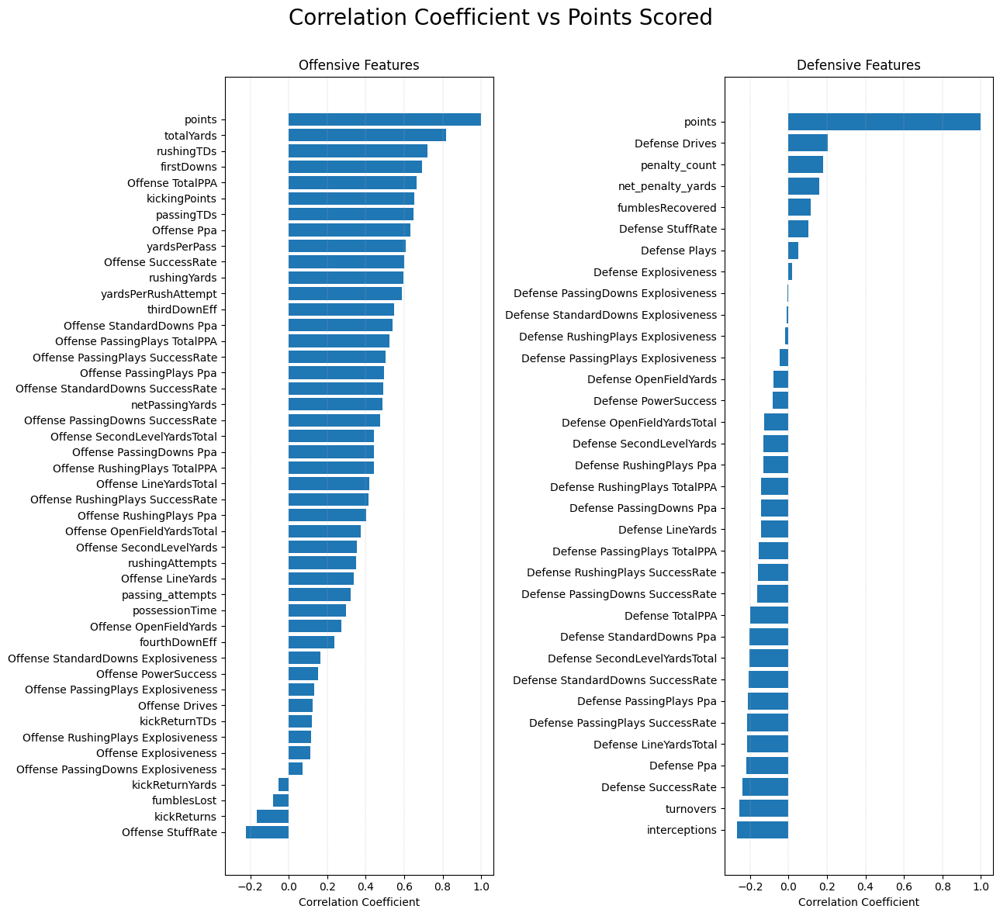

In [ ]:
offensive_features = ['Offense Drives', 'Offense Ppa', 'Offense TotalPPA',
                      'Offense SuccessRate', 'Offense Explosiveness',
                      'Offense PowerSuccess', 'Offense StuffRate',
                      'Offense LineYards', 'Offense LineYardsTotal',
                      'Offense SecondLevelYards', 'Offense SecondLevelYardsTotal',
                      'Offense OpenFieldYards', 'Offense OpenFieldYardsTotal',
                      'Offense StandardDowns Ppa', 'Offense StandardDowns SuccessRate',
                      'Offense StandardDowns Explosiveness', 'Offense PassingDowns Ppa',
                      'Offense PassingDowns SuccessRate', 'Offense PassingDowns Explosiveness',
                      'Offense RushingPlays Ppa', 'Offense RushingPlays TotalPPA',
                      'Offense RushingPlays SuccessRate', 'Offense RushingPlays Explosiveness',
                      'Offense PassingPlays Ppa', 'Offense PassingPlays TotalPPA',
                      'Offense PassingPlays SuccessRate', 'Offense PassingPlays Explosiveness',
                      'rushingTDs', 'passingTDs', 'kickReturnYards',
                      'kickReturnTDs', 'kickReturns', 'kickingPoints',
                      'firstDowns', 'thirdDownEff', 'fourthDownEff',
                      'totalYards', 'netPassingYards', 'passing_attempts',
                      'yardsPerPass', 'rushingYards', 'rushingAttempts',
                      'yardsPerRushAttempt', 'fumblesLost', 'possessionTime'
                     ]

all_offensive = ['points']
[all_offensive.append(i) for i in offensive_features]

defensive_features = ['Defense Plays', 'Defense Drives',
                      'Defense Ppa', 'Defense TotalPPA',
                      'Defense SuccessRate', 'Defense Explosiveness',
                      'Defense PowerSuccess', 'Defense StuffRate',
                      'Defense LineYards', 'Defense LineYardsTotal',
                      'Defense SecondLevelYards', 'Defense SecondLevelYardsTotal',
                      'Defense OpenFieldYards', 'Defense OpenFieldYardsTotal',
                      'Defense StandardDowns Ppa', 'Defense StandardDowns SuccessRate',
                      'Defense StandardDowns Explosiveness', 'Defense PassingDowns Ppa',
                      'Defense PassingDowns SuccessRate', 'Defense PassingDowns Explosiveness',
                      'Defense RushingPlays Ppa', 'Defense RushingPlays TotalPPA',
                      'Defense RushingPlays SuccessRate', 'Defense RushingPlays Explosiveness',
                      'Defense PassingPlays Ppa', 'Defense PassingPlays TotalPPA',
                      'Defense PassingPlays SuccessRate', 'Defense PassingPlays Explosiveness',
                      'fumblesRecovered', 'penalty_count', 'net_penalty_yards',
                      'turnovers', 'interceptions'
                     ]

all_defensive = ['points']
[all_defensive.append(i) for i in defensive_features]

fig, axes = plt.subplots(1, 2, figsize = (13, 12), sharex = True)
axes = axes.flatten()

plt.suptitle(('Correlation Coefficient vs Points Scored\n'), fontsize = 20)
axes[0].barh(merged_df[all_offensive].corr().iloc[:, 0].sort_values().index, merged_df[all_offensive].corr().iloc[:, 0].sort_values())
axes[0].set_xlabel('Correlation Coefficient')
axes[0].grid(axis = 'x', linestyle = '--', linewidth = 0.25)
axes[0].set_title('Offensive Features')

axes[1].barh(merged_df[all_defensive].corr().iloc[:, 0].sort_values().index, merged_df[all_defensive].corr().iloc[:, 0].sort_values())
axes[1].set_xlabel('Correlation Coefficient')
axes[1].grid(axis = 'x', linestyle = '--', linewidth = 0.25)
axes[1].set_title('Defensive Features')
plt.tight_layout();

<center>Figure 3.5: Correlation Coefficients - Offensive & Defensive Features</center>

## 3.6 2023 College Football Playoff Participants vs. Dataset

The following subplots explore the performance of the would-be 2023 CFP participants with the entirety of the dataset (all teams and all seasons) across a subset of offensive categories.

Each of the subplots illustrates the frequency distribution of a particular feature with the plot's left distribution representing the entire dataset (*CFP Participants = 0*), and the distribution on the right represents the actual 165 games played in the 2023 season by the 12 would-be CFP participants (*CFP Participants = 1*).  The horizontal dashed lines in the "violin plots" represent the first, second and third quartiles of the distribution.

Relative to dataset averages the 2023 would-be CFP participants:
- scored roughly 10 more points per game
- gained 66 more yards per game
- rushed and threw for 10 and 53 more yards per game respectively
- and possessed the football for 6 more minutes per game.

In [ ]:
cfp_teams = ['Michigan', 'Washington', 'Texas', 'Alabama',
             'Florida State', 'Georgia', 'Ohio State',
             'Oregon', 'Missouri', 'Penn State',
             'Ole Miss', 'Oklahoma']
cfp_2023_df = merged_df[(merged_df['Team'].isin (cfp_teams)) & (merged_df['Season'] == 2023)]

def cfp_2023(game):
    if game['Team'] in cfp_teams and game['Season'] == 2023:
        return 1
    else:
        return 0

merged_df['cfp_2023'] = merged_df.apply(cfp_2023, axis = 1)

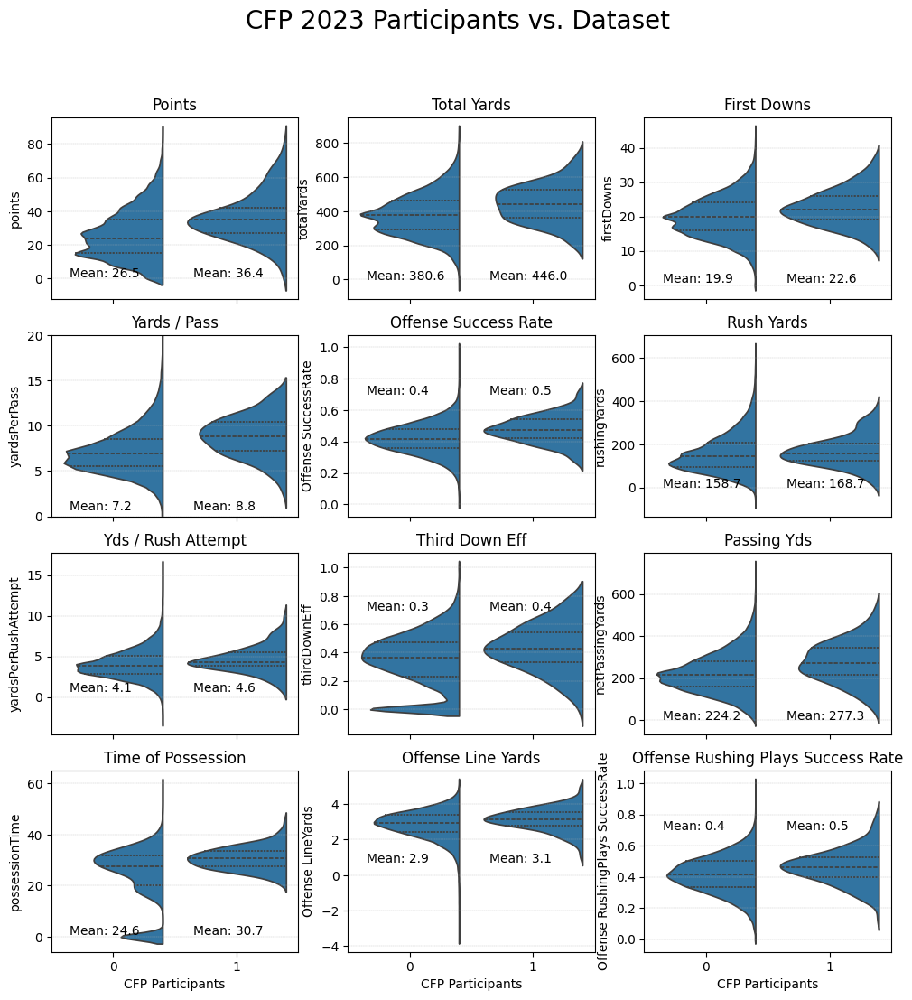

In [ ]:
fig, axes = plt.subplots(4, 3, figsize = (12, 12), sharex = True)
axes = axes.flatten()
features = ['points', 'totalYards', 'firstDowns',
            'yardsPerPass', 'Offense SuccessRate',
            'rushingYards', 'yardsPerRushAttempt',
            'thirdDownEff', 'netPassingYards',
            'possessionTime', 'Offense LineYards',
            'Offense RushingPlays SuccessRate']
labels = ['Points', 'Total Yards', 'First Downs',
          'Yards / Pass', 'Offense Success Rate',
          'Rush Yards', 'Yds / Rush Attempt',
          'Third Down Eff', 'Passing Yds',
          'Time of Possession', 'Offense Line Yards',
          'Offense Rushing Plays Success Rate']

plt.suptitle(('CFP 2023 Participants vs. Dataset'), fontsize = 20)
for i, j, k in zip(range(12), features, labels):
    sns.violinplot(merged_df, x = 'cfp_2023', y = j, split = True, inner = 'quart', ax = axes[i])
    axes[i].grid(axis = 'y', linestyle = '--', linewidth = 0.25)
    axes[i].set_title(k)
    axes[i].set_xlabel('CFP Participants')
    axes[i].annotate(f'Mean: {round(merged_df[j].mean(), 1)}', xy = [-0.35, 0.7]);
    axes[i].annotate(f'Mean: {round(cfp_2023_df[j].mean(), 1)}', xy = [0.65, 0.7]);

axes[3].set_ylim([0, 20]);

<center>Figure 3.6.1: CFP Participants vs Dataset</center>

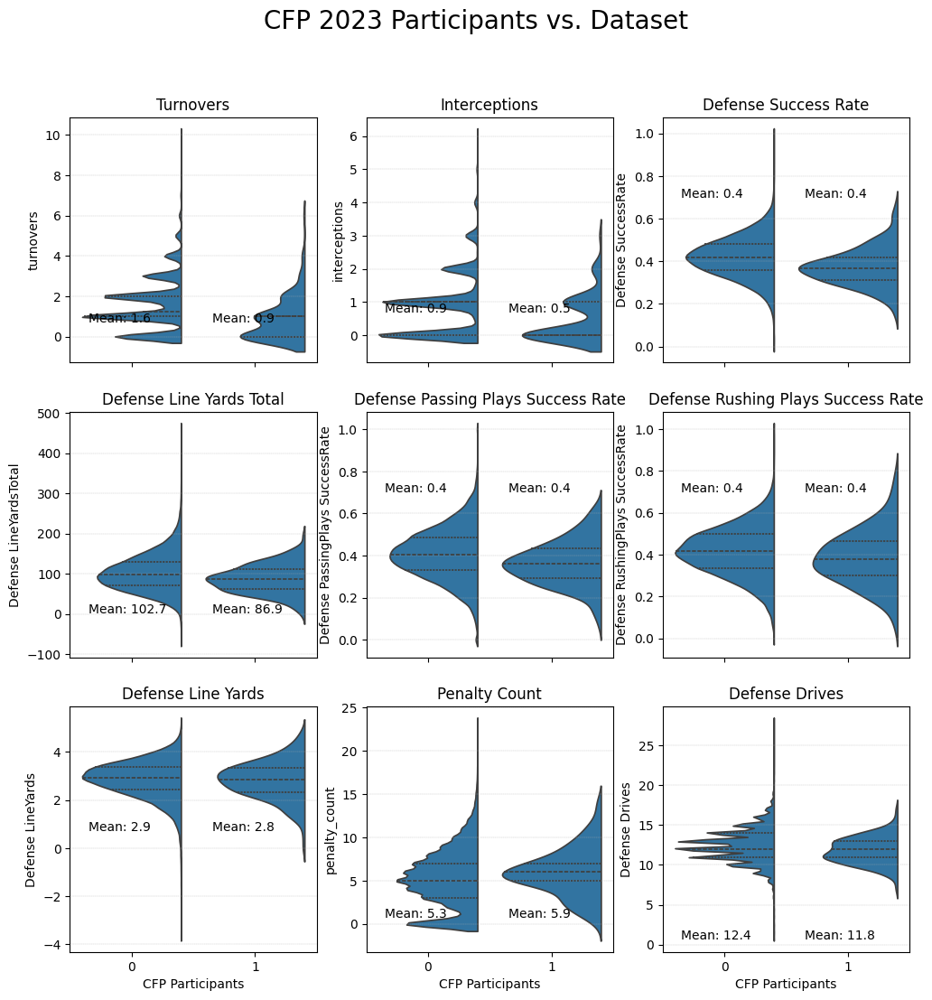

In [ ]:
fig, axes = plt.subplots(3, 3, figsize = (12, 12), sharex = True)
axes = axes.flatten()
features = ['turnovers', 'interceptions',
            'Defense SuccessRate', 'Defense LineYardsTotal',
            'Defense PassingPlays SuccessRate',
            'Defense RushingPlays SuccessRate',
            'Defense LineYards', 'penalty_count',
            'Defense Drives']
labels = ['Turnovers', 'Interceptions', 'Defense Success Rate',
          'Defense Line Yards Total',
          'Defense Passing Plays Success Rate',
          'Defense Rushing Plays Success Rate',
          'Defense Line Yards', 'Penalty Count',
          'Defense Drives']

plt.suptitle(('CFP 2023 Participants vs. Dataset'), fontsize = 20)
for i, j, k in zip(range(9), features, labels):
    sns.violinplot(merged_df, x = 'cfp_2023', y = j, split = True, inner = 'quart', ax = axes[i])
    axes[i].grid(axis = 'y', linestyle = '--', linewidth = 0.25)
    axes[i].set_title(k)
    axes[i].set_xlabel('CFP Participants')
    axes[i].annotate(f'Mean: {round(merged_df[j].mean(), 1)}', xy = [-0.35, 0.7])
    axes[i].annotate(f'Mean: {round(cfp_2023_df[j].mean(), 1)}', xy = [0.65, 0.7]);

<center>Figure 3.6.2: CFP Participants vs Dataset</center>

## 3.7 Strength of Schedule

Section 3.7 explores the strength of schedule across the twelve would-be CFP participants.  While not an ideal metric, the study uses opponents' season win percentage as its measure of schedule strength.  Fans of college football may argue some conferences are more competitive than others and offer as evidence the number of national championships per conference, and/or the number of professional football players coming from individual conferences.  These may be valid arguments but given the limited meaningful interconference game data, differentiating strength of schedule by conference was not deemed feasible.

Exploring strength of schedule begins with identifying the teams with the highest win percentage in the 2023 season (bar chart immediately below).

The 12 subplots below detail the win percentage (in 2023) of the opponents of the 12 would-be CFP participants.  Using this measure of strength of schedule, Texas played the toughest schedule followed closely by Alabama.  Their opponents' average win percentage in 2023 was 0.593 and 0.590 respectively.  It is worth noting **Oregon played the easiest schedule in the group: their oppoents' average win percentage was 0.488**.

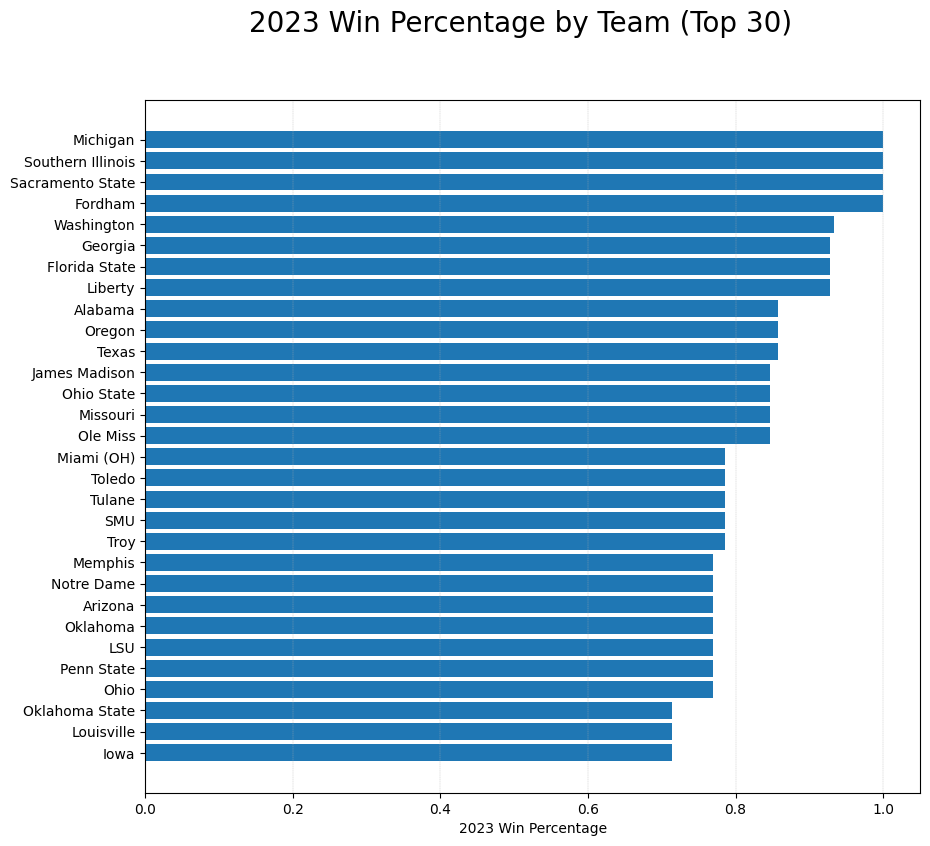

In [ ]:
win_pct_list = []
for team in merged_df['Team'].unique():
    temp_df = (
        df_results[((df_results['Home Team'] == team) | (
            df_results['Away Team'] == team)) & (df_results['Season'] == 2023)]
        [['Home Team', 'Away Team', 'Home Points', 'Away Points', 'Season']])
    win_counter = 0
    for i in range(len(temp_df)):
        if (temp_df.iloc[i, 0] == team) & (temp_df.iloc[i, 2] > temp_df.iloc[i, 3]):
            win_counter = win_counter + 1
        elif (temp_df.iloc[i, 1] == team) & (temp_df.iloc[i, 3] > temp_df.iloc[i, 2]):
            win_counter = win_counter + 1
    if len(temp_df) > 0:
        win_pct_list.append(win_counter / len(temp_df))
    else:
        win_pct_list.append(0)

win_pct_df = pd.DataFrame({'Team': list(merged_df['Team'].unique()), '23_win_pct': win_pct_list})
fig, axes = plt.subplots(1, 1, figsize = (10, 9))
plt.suptitle(('2023 Win Percentage by Team (Top 30)'), fontsize = 20)
axes.barh(win_pct_df.sort_values('23_win_pct', ascending = True)['Team'][303:],
          win_pct_df.sort_values('23_win_pct', ascending = True)['23_win_pct'][303:])
axes.grid(axis = 'x', linestyle = '--', linewidth = 0.25)
axes.set_xlabel('2023 Win Percentage');

<center>Figure 3.7.1: 2023 Win Percentage</center>

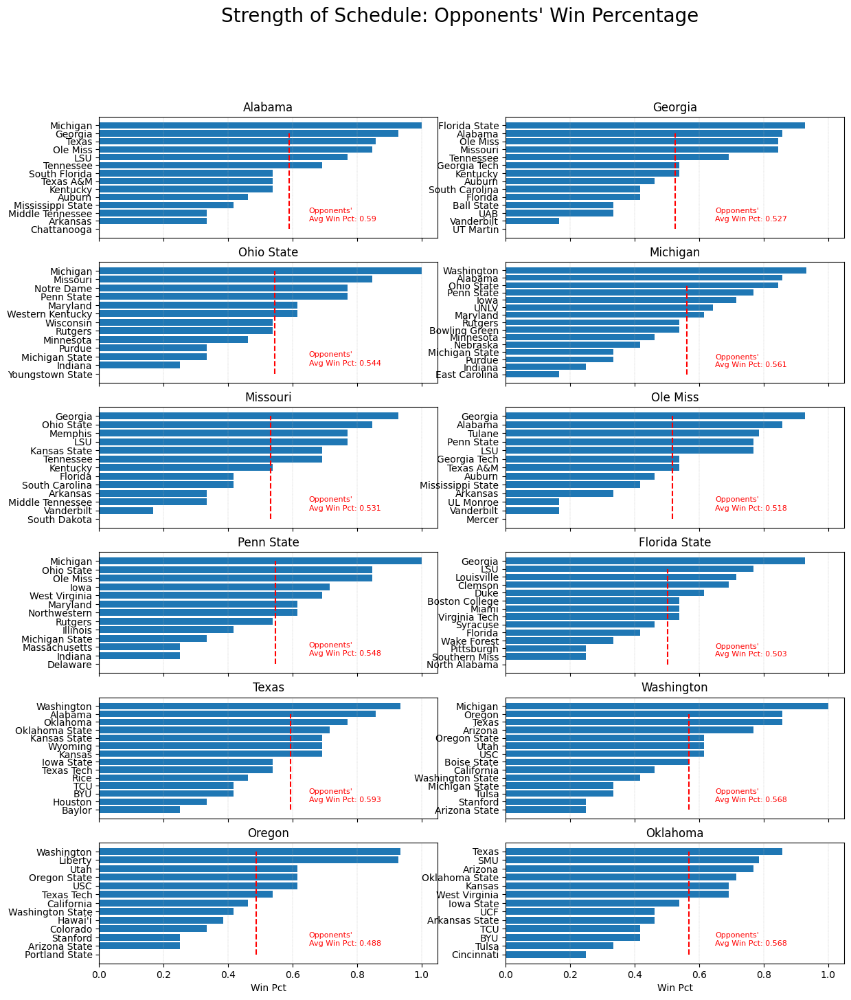

In [ ]:
fig, axes = plt.subplots(6, 2, figsize = (14, 16), sharex = True)
axes = axes.flatten()
plt.suptitle(("Strength of Schedule: Opponents' Win Percentage"), fontsize = 20)

for i, team in zip(range(12), cfp_2023_df['Team'].unique()):
    game_id_list = cfp_2023_df[cfp_2023_df['Team'] == team]['game_id'].to_list()
    opp_list = merged_df[(
        merged_df['game_id'].isin(game_id_list)) & (
            merged_df['Team'] == team)]['Opponent'].to_list()
    temp_df = win_pct_df[win_pct_df['Team'].isin(opp_list)]

    axes[i].barh(
        temp_df.sort_values('23_win_pct')['Team'],
        temp_df.sort_values('23_win_pct')['23_win_pct'])
    axes[i].plot(
        [temp_df['23_win_pct'].mean(), temp_df['23_win_pct'].mean()],
        [0, 12], color = 'r', linestyle = '--')

    axes[i].set_title(team, fontsize = 12)
    axes[i].grid(axis = 'x', linestyle = '--', linewidth = 0.25)

    win_pct = round(temp_df['23_win_pct'].mean(), 3)

    axes[i].annotate(f'Avg Win Pct: {win_pct}',
        xy = [0.65, 1], fontsize = 8, color = 'r')
    axes[i].annotate(
        "Opponents'", xy = [0.65, 2], fontsize = 8, color = 'r')
axes[10].set_xlabel('Win Pct')
axes[11].set_xlabel('Win Pct');

<center>Figure 3.7.2: CFP Participants - Opponents' 2023 Win Percentage</center>

## 3.8 Comparison of CFP Participants

The following subplots compare the performance of the CFP participants on an individual basis across a subset of offensive and defensive categories.  The vertical red dashed lines and corresponding annotations represent the mean values for the dataset across respective categories.

It is worth noting the highest point scorers among the 12 would-be CFP participants are **Oregon, Oklahoma**, and **Georgia**.

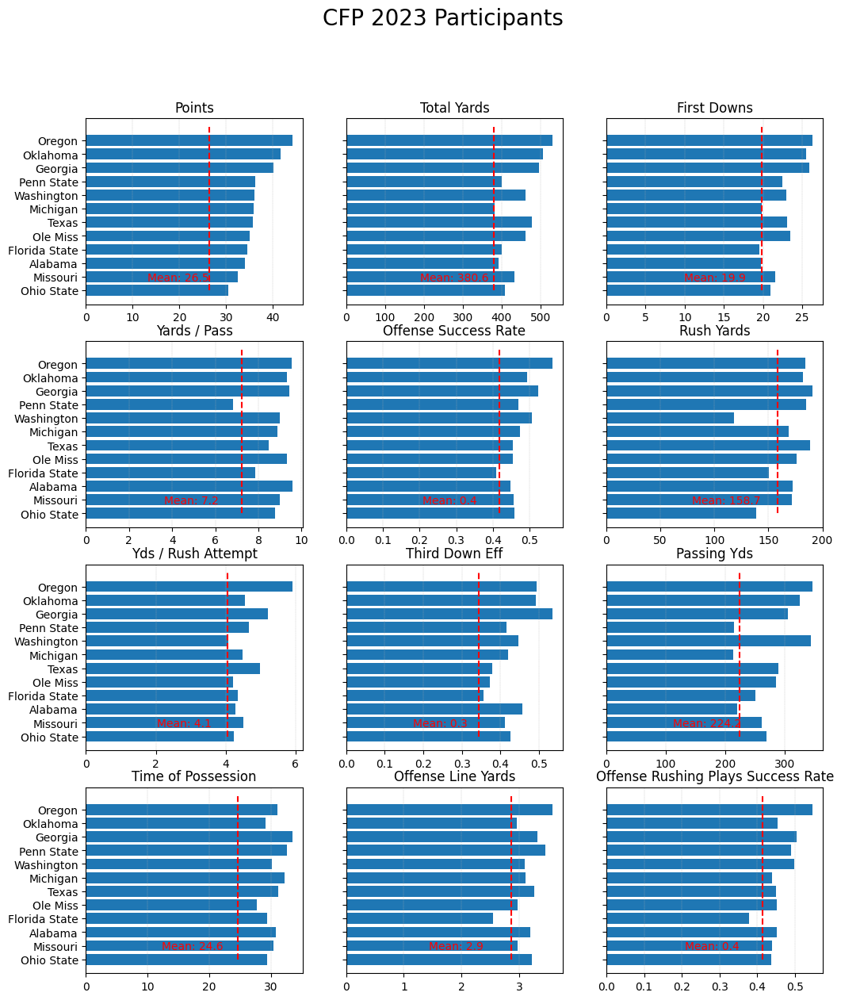

In [ ]:
fig, axes = plt.subplots(4, 3, figsize = (12, 14), sharey = True)
axes = axes.flatten()
features = ['points', 'totalYards', 'firstDowns',
            'yardsPerPass', 'Offense SuccessRate',
            'rushingYards', 'yardsPerRushAttempt',
            'thirdDownEff', 'netPassingYards',
            'possessionTime', 'Offense LineYards',
            'Offense RushingPlays SuccessRate']
labels = ['Points', 'Total Yards', 'First Downs',
          'Yards / Pass', 'Offense Success Rate',
          'Rush Yards', 'Yds / Rush Attempt',
          'Third Down Eff', 'Passing Yds',
          'Time of Possession', 'Offense Line Yards',
          'Offense Rushing Plays Success Rate']

temp_df = cfp_2023_df.groupby(['Team'])[features].mean().sort_values('points')

plt.suptitle(('CFP 2023 Participants'), fontsize = 20)
for i, j, k in zip(range(12), features, labels):
    axes[i].barh(temp_df.index, temp_df[j])
    axes[i].grid(axis = 'x', linestyle = '--', linewidth = 0.25)
    axes[i].set_title(k)
    axes[i].annotate(
        f'Mean: {round(merged_df[j].mean(), 1)}',
        xy = [merged_df[j].mean() * 0.5, 0.7],
        color = 'r')
    axes[i].plot(
        [merged_df[j].mean(), merged_df[j].mean()],
        [0, 12],
        color = 'r', linestyle = '--');

<center>Figure 3.8.1: CFP Participants - Key Features</center>

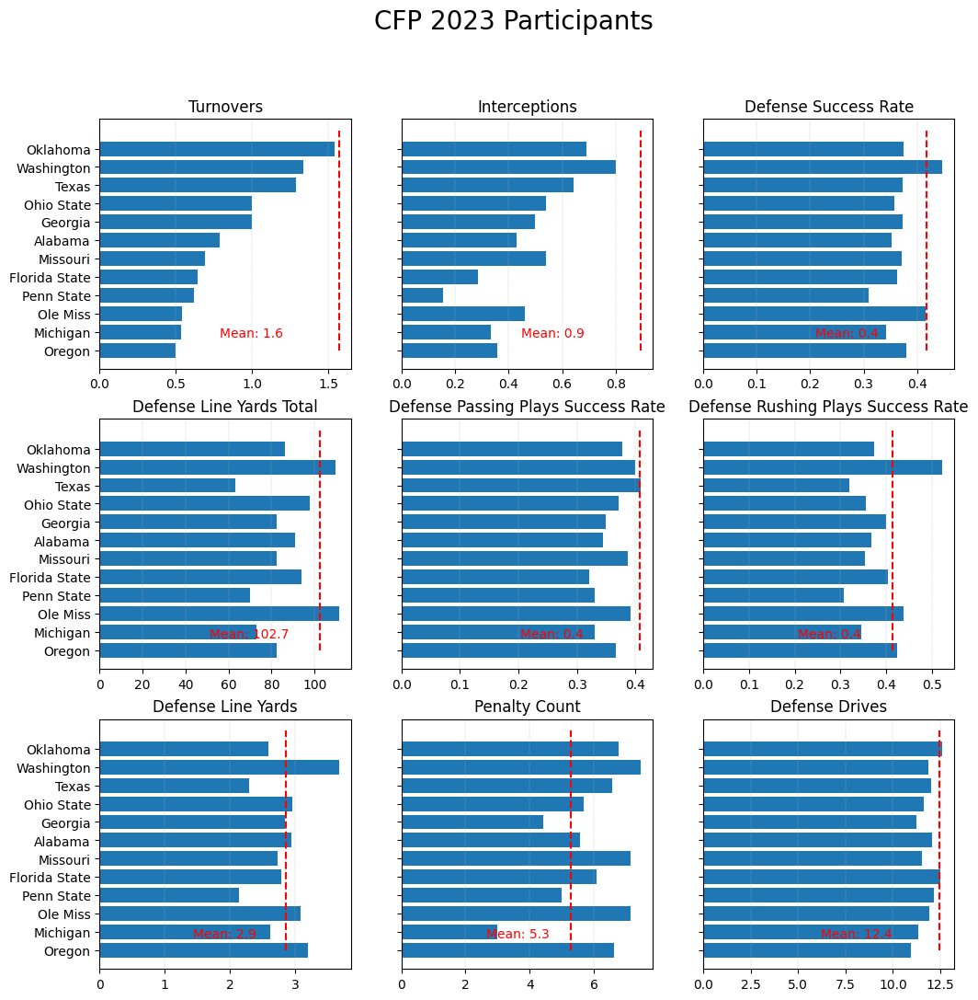

In [ ]:
fig, axes = plt.subplots(3, 3, figsize = (12, 12), sharey = True)
axes = axes.flatten()
features = ['turnovers', 'interceptions',
            'Defense SuccessRate', 'Defense LineYardsTotal',
            'Defense PassingPlays SuccessRate',
            'Defense RushingPlays SuccessRate',
            'Defense LineYards', 'penalty_count',
            'Defense Drives']
labels = ['Turnovers', 'Interceptions', 'Defense Success Rate',
          'Defense Line Yards Total',
          'Defense Passing Plays Success Rate',
          'Defense Rushing Plays Success Rate',
          'Defense Line Yards', 'Penalty Count',
          'Defense Drives']

temp_df = cfp_2023_df.groupby(['Team'])[features].mean().sort_values('turnovers')

plt.suptitle(('CFP 2023 Participants'), fontsize = 20)
for i, j, k in zip(range(12), features, labels):
    axes[i].barh(temp_df.index, temp_df[j])
    axes[i].grid(axis = 'x', linestyle = '--', linewidth = 0.25)
    axes[i].set_title(k)
    axes[i].annotate(
        f'Mean: {round(merged_df[j].mean(), 1)}',
        xy = [merged_df[j].mean() * 0.5, 0.7],
        color = 'r')
    axes[i].plot(
        [merged_df[j].mean(), merged_df[j].mean()],
        [0, 12],
        color = 'r', linestyle = '--');

<center>Figure 3.8.2: CFP Participants - Key Features</center>

## 3.9 2023 Playoff Participants: Strength of Schedule vs Feature

The analysis above begs the question of the relationship between strength of schedule and individual feature.  The subplots below illustrate the correlation between offensive and defensive features and the win percentage of each team's opponents.  The data underpinning the plot are limited to the field of CFP participants in the 2023 season.  The purpose of the analysis is to better understand the potential relationship between strength of schedule and on-field performance for the 2023 CFP participants.  In short, do CFP participants perform better or worse (statistically) against opponents with higher or lower win percentages?

While a modestly sized dataset of only 12 teams across a single season, the plots suggest a **negative** relationship between many offensive features and opponents' win percentage.  Such features include *Offense Standard Downs Explosiveness, Offense PPA*, and *points*.  This negative relationship indicates an increasing number of points scored is associated with decreasing opponents' win percentage.  This, of course, is consistent with intuition.

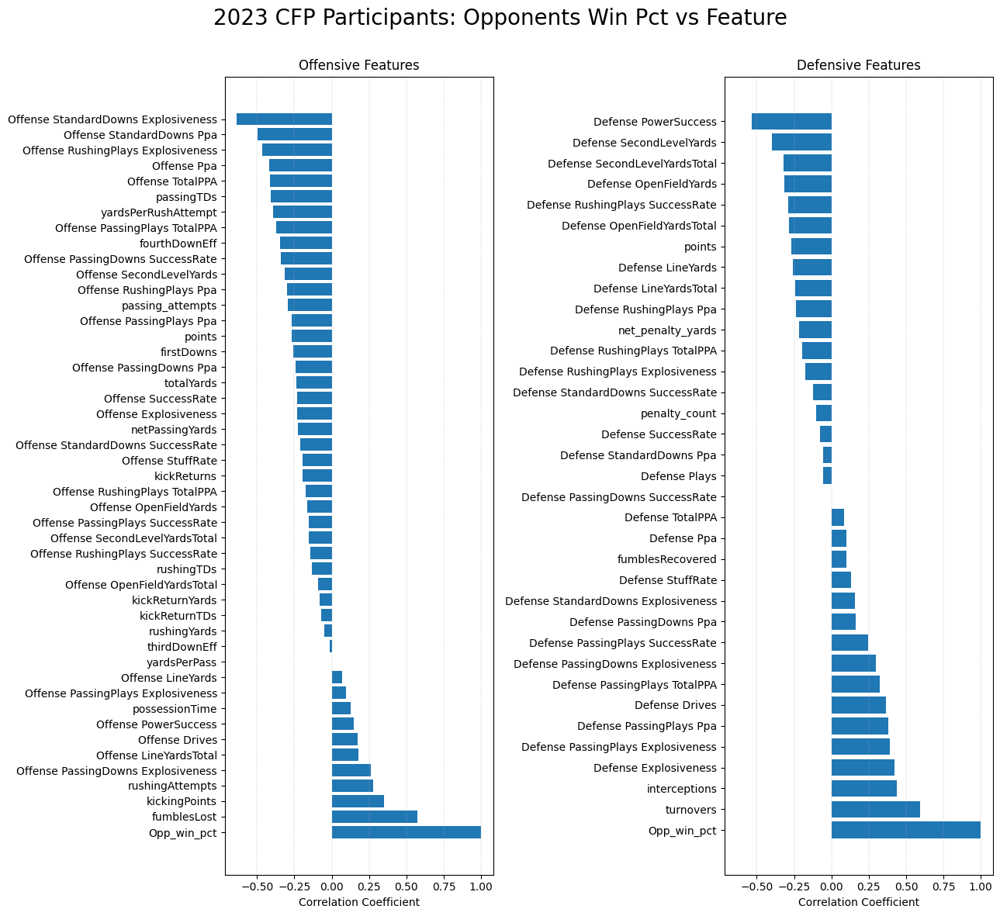

In [ ]:
opp_win_pct_list = []
for i, team in zip(range(12), cfp_2023_df['Team'].unique()):
    game_id_list = cfp_2023_df[cfp_2023_df['Team'] == team]['game_id'].to_list()
    opp_list = merged_df[(
        merged_df['game_id'].isin(game_id_list)) & (
            merged_df['Team'] == team)]['Opponent'].to_list()
    temp_df = win_pct_df[win_pct_df['Team'].isin(opp_list)]
    opp_win_pct_list.append(temp_df['23_win_pct'].mean())

opp_win_pct_dict = {'Team': cfp_2023_df['Team'].unique(), 'Opp_win_pct': opp_win_pct_list}
opp_win_pct_df = pd.DataFrame(opp_win_pct_dict)

temp_df1 = pd.merge(cfp_2023_df.groupby(['Team'])[all_offensive].mean(), opp_win_pct_df, on = 'Team')
temp_df2 = pd.merge(cfp_2023_df.groupby(['Team'])[all_defensive].mean(), opp_win_pct_df, on = 'Team')

fig, axes = plt.subplots(1, 2, figsize = (13, 12), sharex = True)
axes = axes.flatten()

plt.suptitle(('2023 CFP Participants: Opponents Win Pct vs Feature\n'), fontsize = 20)
axes[0].barh(
    temp_df1.iloc[:, 1:].corr().iloc[:, -1].sort_values(ascending = False).index,
    temp_df1.iloc[:, 1:].corr().iloc[:, -1].sort_values(ascending = False))
axes[0].set_xlabel('Correlation Coefficient')
axes[0].grid(axis = 'x', linestyle = '--', linewidth = 0.25)
axes[0].set_title('Offensive Features')

axes[1].barh(
    temp_df2.iloc[:, 1:].corr().iloc[:, -1].sort_values(ascending = False).index,
    temp_df2.iloc[:, 1:].corr().iloc[:, -1].sort_values(ascending = False))
axes[1].set_xlabel('Correlation Coefficient')
axes[1].grid(axis = 'x', linestyle = '--', linewidth = 0.25)
axes[1].set_title('Defensive Features')
plt.tight_layout();

<center>
Figure 3.9: CFP Participants - Opponents' Win Percentage vs Feature
</center>

<a id="Trees"></a>

# 4.0 Tree-Based Models

Two tree-based models are created and evaluated in Section 4.  Both models are trained on 80% of the data described above and evaluated against the unseen remaining 20%.  Performance is evaluated using *R-squared* and *mean squared error* (MSE).  R-squared - or coefficient of determination - describes the proportion of variance of the target variable (*points scored*) that can be explained by the model.  In simpler terms, an R-squared value of 1.0 indicates a model's predicted points scored match the actual points scored values exactly.  *Error* represents the difference between actual and predicted points scored.  Mean squared error - or MSE - represents the average of squared errors.

The best-performing **Random Forest** model (Section 4.1) achieves an **R-squared value of 0.815** against the test data and an MSE of 39.4.  Meanwhile, the **AdaBoost** model in Section 4.2 outperforms achieving R-squared and MSE values of **0.845** and **33.1** respectively.

Section 4.3 identifies the most important features in the AdaBoost model: those providing the most information to predicting points scored.  They include:
- Total yards
- Defense drives
- Offense plays
- Third down efficiency
- Offense PPA / Total PPA
- Turnovers


First, the following cell creates the strength of schedule feature *season_win_pct* described above.  This feature is incorporated in both tree-based models and the neural network model in Section 5.

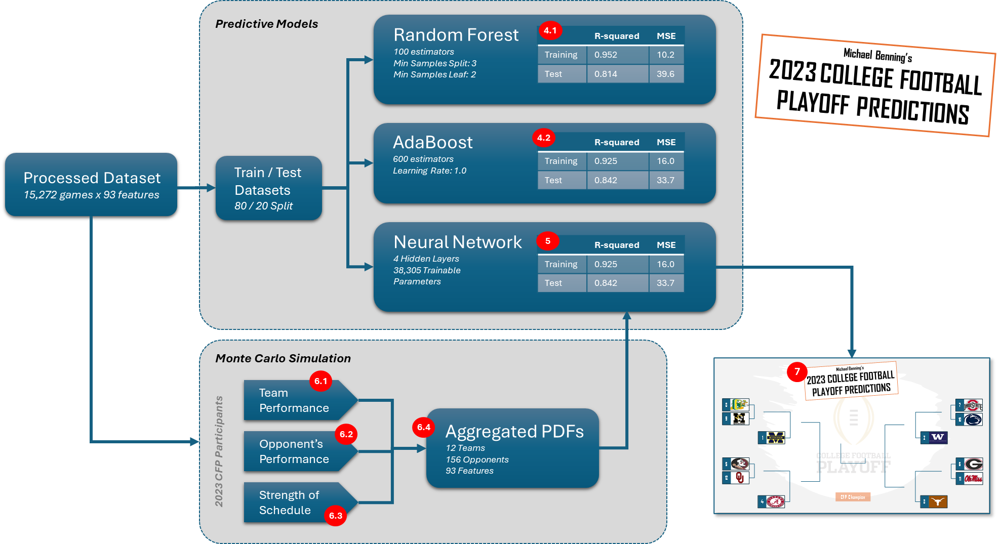

In [ ]:
win_pct_list, team_list, season_list = [], [], []
for season in range(2009, 2025):
    for team in merged_df['Team'].unique():
        temp_df = (
            df_results[((df_results['Home Team'] == team) | (
                df_results['Away Team'] == team)) & (
                df_results['Season'] == season)]
            [['Home Team', 'Away Team', 'Home Points', 'Away Points', 'Season']])
        win_counter = 0
        for i in range(len(temp_df)):
            if (temp_df.iloc[i, 0] == team) & (temp_df.iloc[i, 2] > temp_df.iloc[i, 3]):
                win_counter = win_counter + 1
            elif (temp_df.iloc[i, 1] == team) & (temp_df.iloc[i, 3] > temp_df.iloc[i, 2]):
                win_counter = win_counter + 1
        if len(temp_df) > 0:
            win_pct_list.append(win_counter / len(temp_df))
        else:
            win_pct_list.append(0)
        team_list.append(team)
        season_list.append(season)

win_pct_df = pd.DataFrame({'Team': team_list, 'Season': season_list, 'win_pct': win_pct_list})

merged_df['season_win_pct'] = np.nan
for i in range(len(merged_df)):
    opponent = merged_df.loc[i, 'Opponent']
    season = merged_df.loc[i, 'Season']
    merged_df.iloc[i, -1] = win_pct_df[(win_pct_df['Team'] == opponent) & (win_pct_df['Season'] == int(season))]['win_pct']


In [ ]:
print('Merged_df dataframe shape:', merged_df.shape[0], 'rows x', merged_df.shape[1], 'columns')
print('The number of unique game IDs:', len(merged_df['game_id'].unique()))

Merged_df dataframe shape: 30544 rows x 93 columns
The number of unique game IDs: 15272


## 4.1 Random Forest Model

**Decision Tree Regressors** are machine learning algorithms used to predict a continuous target variable - *points scored* in this case, based on a selection of input features.  These models create a tree-like structure of nodes (analogous to the branching of tree limbs) where each internal node represents a decision rule on a feature, each branch represents the outcome of that decision, and each leaf node provides a predicted value. This structure allows the model to capture non-linear relationships in the data.

A **Random Forest** model is created from a collection, or 'ensemble' of decision trees - each trained on a random subset of the feature data.  In addition to generating individual trees using a subset of the training data, random forests train their ensemble of trees on a random subset of the available features as well.  Random Forests' predictions represent the average of the predictions produced by the individual decision trees created by the model.  This aggregation of predictions tends to reduce over-fitting making them more generalizable to unseen data.

The code cells below train and evaluate a Random Forest model to predict points scored.  All features are used to train the model with the following exceptions:
- rushing and passing touchdowns and kicking points as these are in fact, points scored
- The other omitted features include redundant features describing penalties and passing completions.

Categorical variables *conference* and *home_away* are one-hot encoded.

In [ ]:
# Select features:
selected_features = ['Offense Plays', 'Offense Drives',
                     'Offense Ppa', 'Offense TotalPPA',
                     'Offense SuccessRate', 'Offense Explosiveness',
                     'Offense PowerSuccess', 'Offense StuffRate',
                     'Offense LineYards', 'Offense LineYardsTotal',
                     'Offense SecondLevelYards', 'Offense SecondLevelYardsTotal',
                     'Offense OpenFieldYards', 'Offense OpenFieldYardsTotal',
                     'Offense StandardDowns Ppa', 'Offense StandardDowns SuccessRate',
                     'Offense StandardDowns Explosiveness', 'Offense PassingDowns Ppa',
                     'Offense PassingDowns SuccessRate', 'Offense PassingDowns Explosiveness',
                     'Offense RushingPlays Ppa', 'Offense RushingPlays TotalPPA',
                     'Offense RushingPlays SuccessRate', 'Offense RushingPlays Explosiveness',
                     'Offense PassingPlays Ppa', 'Offense PassingPlays TotalPPA',
                     'Offense PassingPlays SuccessRate', 'Offense PassingPlays Explosiveness',
                     'Defense Plays', 'Defense Drives',
                     'Defense Ppa', 'Defense TotalPPA',
                     'Defense SuccessRate', 'Defense Explosiveness',
                     'Defense PowerSuccess', 'Defense StuffRate',
                     'Defense LineYards', 'Defense LineYardsTotal',
                     'Defense SecondLevelYards', 'Defense SecondLevelYardsTotal',
                     'Defense OpenFieldYards', 'Defense OpenFieldYardsTotal',
                     'Defense StandardDowns Ppa', 'Defense StandardDowns SuccessRate',
                     'Defense StandardDowns Explosiveness', 'Defense PassingDowns Ppa',
                     'Defense PassingDowns SuccessRate', 'Defense PassingDowns Explosiveness',
                     'Defense RushingPlays Ppa', 'Defense RushingPlays TotalPPA',
                     'Defense RushingPlays SuccessRate', 'Defense RushingPlays Explosiveness',
                     'Defense PassingPlays Ppa', 'Defense PassingPlays TotalPPA',
                     'Defense PassingPlays SuccessRate', 'Defense PassingPlays Explosiveness',
                     'fumblesRecovered',
                     # 'rushingTDs', 'passingTDs', 'kickingPoints'
                     'kickReturnYards', 'firstDowns',
                     'kickReturnTDs', 'kickReturns',
                     'thirdDownEff', 'fourthDownEff',
                     'totalYards', 'netPassingYards',
                     # 'completionAttempts',
                     'yardsPerPass',
                     'rushingYards', 'rushingAttempts',
                     'yardsPerRushAttempt',
                     # 'totalPenaltiesYards',
                     'turnovers', 'fumblesLost',
                     'interceptions', 'possessionTime',
                     # 'Season', 'penalty_count', 'net_penalty_yards',
                     'passing_attempts', 'passing_completions',
                     'conference', 'home_away',
                     'season_win_pct'
]
# Apply One-Hot Encoding to 'conference':
ohe_encoder = OneHotEncoder(sparse_output = False)
one_hot_encoded = ohe_encoder.fit_transform(merged_df[['conference', 'home_away']])

one_hot_df = pd.DataFrame(one_hot_encoded, columns = ohe_encoder.get_feature_names_out(['conference', 'home_away']))
df_encoded = pd.concat([merged_df[selected_features], one_hot_df], axis = 1)
df_encoded = df_encoded.drop(['conference', 'home_away'], axis = 1)

X, y = df_encoded, merged_df['points']

# Train / test split:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

# Instantiate model:
rf_regressor = RandomForestRegressor(
    n_estimators = 100,
    criterion = 'squared_error',
    max_depth = None,
    min_samples_split = 3,
    min_samples_leaf = 4,
    min_weight_fraction_leaf = 0.0,
    max_features = 1.0,
    max_leaf_nodes = None,
    random_state = 42,
    oob_score = True)
rf_regressor.fit(X_train, y_train)

# Make predictions on the train & test sets:
y_pred_train = rf_regressor.predict(X_train)
y_pred_test = rf_regressor.predict(X_test)

### 4.1.1 Parameter Grid Search

Given the significant computational expense associated with grid search, and the strong performance of the neural network model in Section 5, the grid search performed in the code cell below is limited.

The following cell performs a grid search on two parameters:
1. *min_samples_split* - the minimum number of samples required to split an internal node, and
2. *min_samples_leaf* - the minimum number of samples required to be at a leaf node.

The search confirms a more detailed, expansive tree performs best on the validation data.

In [ ]:
# Establish parameter grid:
grid_search = GridSearchCV(
    estimator = rf_regressor,
    param_grid = {'n_estimators': [100], 'min_samples_split': [3, 5, 7], 'min_samples_leaf': [2, 4, 6, 8]},
    scoring = 'neg_mean_squared_error',
    cv = 3,
    return_train_score = False)

# Train:
grid_search.fit(X_train, y_train)

# Outputs:
print('Best MSE:', round(-grid_search.best_score_, 2), '\n')
print('Best Parameters:')
for key, value in grid_search.best_params_.items():
    print(f'{key}: {value}')

Best MSE: 40.54 

Best Parameters:
min_samples_leaf: 4
min_samples_split: 3
n_estimators: 100


### 4.1.2 Evaluation

The best performing Random Forest model achieves an **R-squared value of 0.815** against the test data.  This performance is consistent with the out-of-bag and cross-validation scores.  The model does exhibit a significant degree of over-fitting with an R-squared value of 0.952 against the training data.

In [ ]:
# Cross-validation:
scores = cross_val_score(rf_regressor, X_train, y_train, cv = 5)

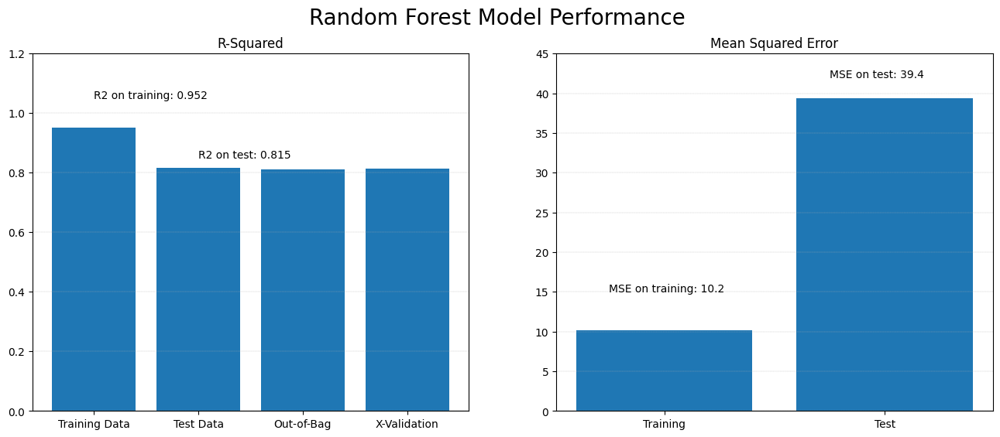

In [ ]:
fig, axes = plt.subplots(1, 2, figsize = (16, 6))
axes = axes.flatten()
plt.suptitle(('Random Forest Model Performance'), fontsize = 20)

test_mse = mean_squared_error(y_test, y_pred_test)
train_mse = mean_squared_error(y_train, y_pred_train)
r2_test = r2_score(y_test, y_pred_test)
r2_train = r2_score(y_train, y_pred_train)

axes[0].bar(['Training Data', 'Test Data', 'Out-of-Bag', 'X-Validation'], [r2_train, r2_test, rf_regressor.oob_score_, scores.mean()])
axes[1].bar(['Training', 'Test'], [train_mse, test_mse])
axes[0].set_title('R-Squared')
axes[1].set_title('Mean Squared Error')
axes[0].grid(axis = 'y', linestyle = '--', linewidth = 0.25)
axes[1].grid(axis = 'y', linestyle = '--', linewidth = 0.25)
axes[0].set_ylim([0, 1.2])
axes[1].set_ylim([0, 45])
axes[0].annotate('R2 on test: %0.3f' % r2_test, xy = [1, 0.85])
axes[0].annotate('R2 on training: %0.3f' % r2_train, xy = [0, 1.05])
axes[1].annotate('MSE on test: %0.1f' % test_mse, xy = [0.75, 42])
axes[1].annotate('MSE on training: %0.1f' % train_mse, xy = [-0.25, 15]);

<center>Figure 4.1: Random Forest Model Performance</center>

## 4.2 AdaBoost

**AdaBoost** - or *adaptive boosting* is also an ensemble method that combines multiple 'weak' models (or weak learners) to create a strong predictor.  In this case, the weak models are small decision trees (i.e., trees with a limited number of nodes).  AdaBoost focuses on poor performing learners in the ensemble (those with relatively large error) by iteratively adjusting the weights applied to them, thus incrementally improving their performance.  This iterative *learning* improves the aggregated performance of the model.


In [ ]:
# Instantiate the model:
base_estimator = DecisionTreeRegressor(max_depth = 9)
adaboost_regressor = AdaBoostRegressor(
    estimator = base_estimator,
    n_estimators = 600,
    learning_rate = 1.0,
    loss = 'square',
    random_state = 42
)

# Train:
adaboost_regressor.fit(X_train, y_train)

# Predictions:
y_pred_test_boost = adaboost_regressor.predict(X_test)
y_pred_train_boost = adaboost_regressor.predict(X_train)

### 4.2.1 Parameter Grid Search

The AdaBoost model is similarly computationally expensive, and the grid search executed below is somewhat less expansive than ideal.

The following grid search focuses on two parameters:
1. *learning_rate* - the weight applied to each regressor at each boosting iteration. Higher learning rates increase the contribution of each regressor, and
2. *estimator__max_depth* - specifies the maximum depth or number of levels allowed in the tree structure.

The search confirms a more detailed, expansive tree performs best on the validation data.

In [ ]:
# Establish parameter grid:
grid_search = GridSearchCV(
    estimator = adaboost_regressor,
    param_grid = {'n_estimators': [300],
                  'learning_rate': [0.1, 1.0, 10],
                  'loss': ['square'],
                  'estimator__max_depth': [7, 9, 11]},
    scoring = 'neg_mean_squared_error',
    cv = 3,
    return_train_score = False)

# Train:
grid_search.fit(X_train, y_train)

# Outputs:
print('Best MSE:', round(grid_search.best_score_, 2), '\n')
print('Best Parameters:')
for key, value in grid_search.best_params_.items():
    print(f'{key}: {value}')

Best MSE: -34.88 

Best Parameters:
estimator__max_depth: 9
learning_rate: 1.0
loss: square
n_estimators: 300


### 4.2.2 Evaluation

The AdaBoost model outperforms the Random Forest model above achieving an **R-squared value of 0.842** against the test data.  In addition, the model exhibits are reduced degree of over-fitting.  The MSE against the test data is 33.7.

The randomly selected test data includes a number of 2023 regular season games played by the would-be CFP participants.  As an illustration of model performance, the actual and predicted points scored in these games in the combination bar/scatter plot below.

In [ ]:
# Cross-validation:
boost_scores = cross_val_score(adaboost_regressor, X_train, y_train, cv = 5)

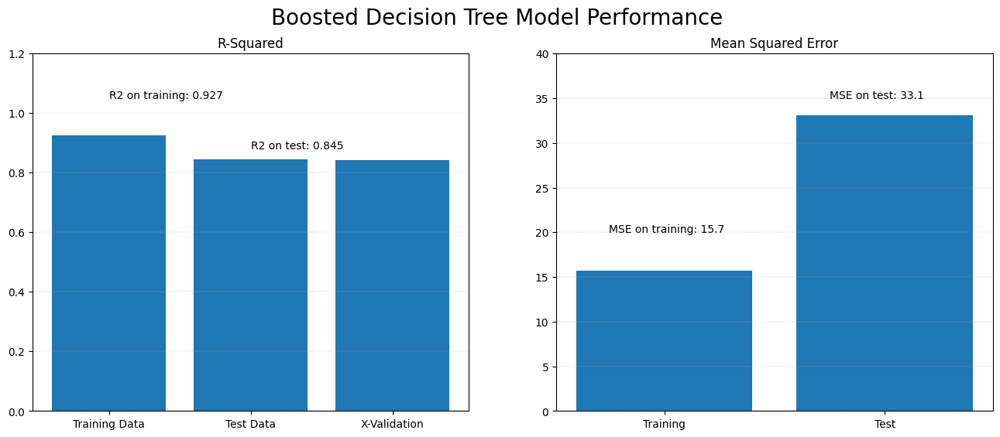

In [ ]:
fig, axes = plt.subplots(1, 2, figsize = (16, 6))
axes = axes.flatten()
plt.suptitle(('Boosted Decision Tree Model Performance'), fontsize = 20)

test_mse = mean_squared_error(y_test, y_pred_test_boost)
train_mse = mean_squared_error(y_train, y_pred_train_boost)
r2_test = r2_score(y_test, y_pred_test_boost)
r2_train = r2_score(y_train, y_pred_train_boost)

axes[0].bar(['Training Data', 'Test Data', 'X-Validation'], [r2_train, r2_test, boost_scores.mean()])
axes[1].bar(['Training', 'Test'], [train_mse, test_mse])
axes[0].set_title('R-Squared')
axes[1].set_title('Mean Squared Error')
axes[0].grid(axis = 'y', linestyle = '--', linewidth = 0.25)
axes[1].grid(axis = 'y', linestyle = '--', linewidth = 0.25)
axes[0].set_ylim([0, 1.2])
axes[1].set_ylim([0, 40])
axes[0].annotate('R2 on test: %0.3f' % r2_test, xy = [1, 0.88])
axes[0].annotate('R2 on training: %0.3f' % r2_train, xy = [0, 1.05])
axes[1].annotate('MSE on test: %0.1f' % test_mse, xy = [0.75, 35])
axes[1].annotate('MSE on training: %0.1f' % train_mse, xy = [-0.25, 20]);

<center>Figure 4.2.1: AdaBoost Model Performance</center>

The plot below illustrates **actual and predicted points scored** by the AdaBoost model for a number of 2023 games in the test dataset.

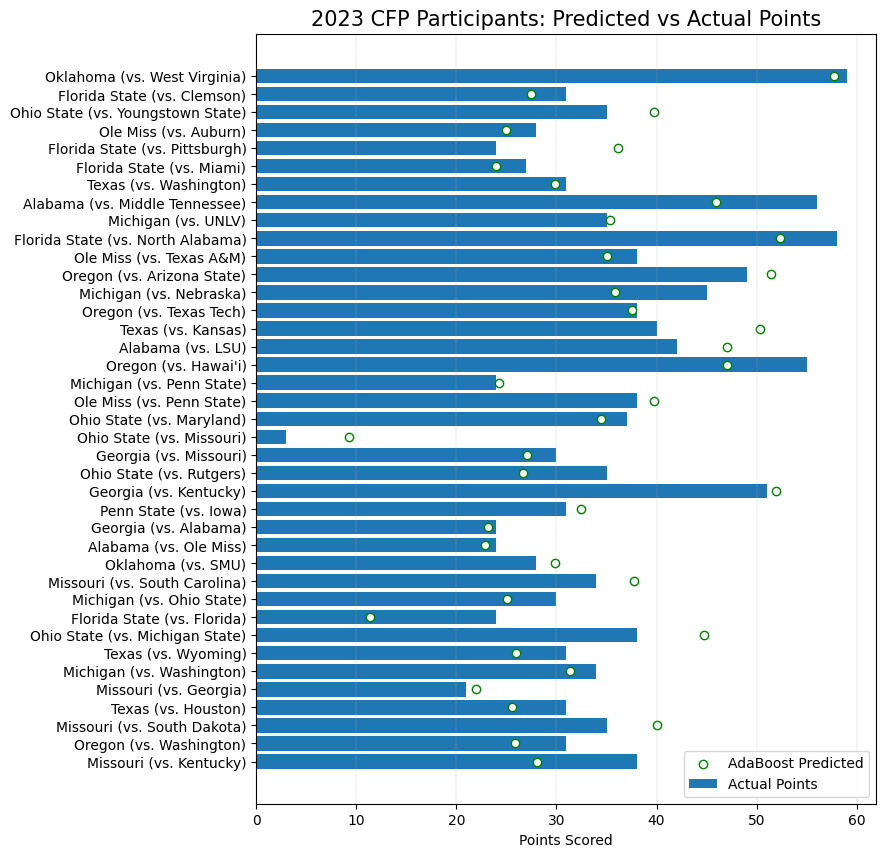

In [ ]:
temp_df = pd.DataFrame(y_test)
temp_df['y_pred'] = y_pred_test_boost
temp_df = temp_df.join(
    cfp_2023_df[['Team', 'Opponent']],
    how = 'inner')
temp_df['text'] = temp_df['Team'] + ' (vs. ' + temp_df['Opponent'] + ')'

fig, axes = plt.subplots(1, 1, figsize = (8, 10))
axes.barh(temp_df['text'], temp_df['points'], label = 'Actual Points')
axes.scatter(
    temp_df['y_pred'],
    temp_df['text'],
    marker = 'o',
    color = 'green',
    facecolors = 'white',
    label = 'AdaBoost Predicted'
)
axes.set_title('2023 CFP Participants: Predicted vs Actual Points', fontsize = 15)
axes.set_xlabel('Points Scored')
axes.grid(axis = 'x', linestyle = '--', linewidth = 0.25)
axes.legend();

<center>Figure 4.2.2: AdaBoost Predicted vs Actual Points</center>

## 4.3 Feature Importance

The bar charts below illustrate feature importance for the boosted tree model.  The subplot on the left uses *Mean Decrease in Impurity* (MDI) as the basis for determining feature importance.  Tree-based algorithms create nodes (or "splits") that result in child nodes that are more "pure" (have smaller sum of squared errors) than the parent node.  MDI represents the average impurity decrease caused by a particular feature across all trees in the ensemble.  Higher MDI values correspond to more important features - that is, features that offer greater predictive value.

The subplot on the right illustrates feature importance using *Permutation Importance* (PI).  PI calculates feature importance by "shuffling" an individual feature's values and calculating the resulting degradation in model performance (e.g., mean squared error).  More important features will cause greater performance degradation when their data is shuffled.

Both calculations identify the following important parameters:
- Total yards
- Defense drives
- Offense plays
- Third down efficiency
- Offense PPA / Total PPA
- Turnovers

Note the subplots' x-axis is abbreviated for purposes of improved illustration.

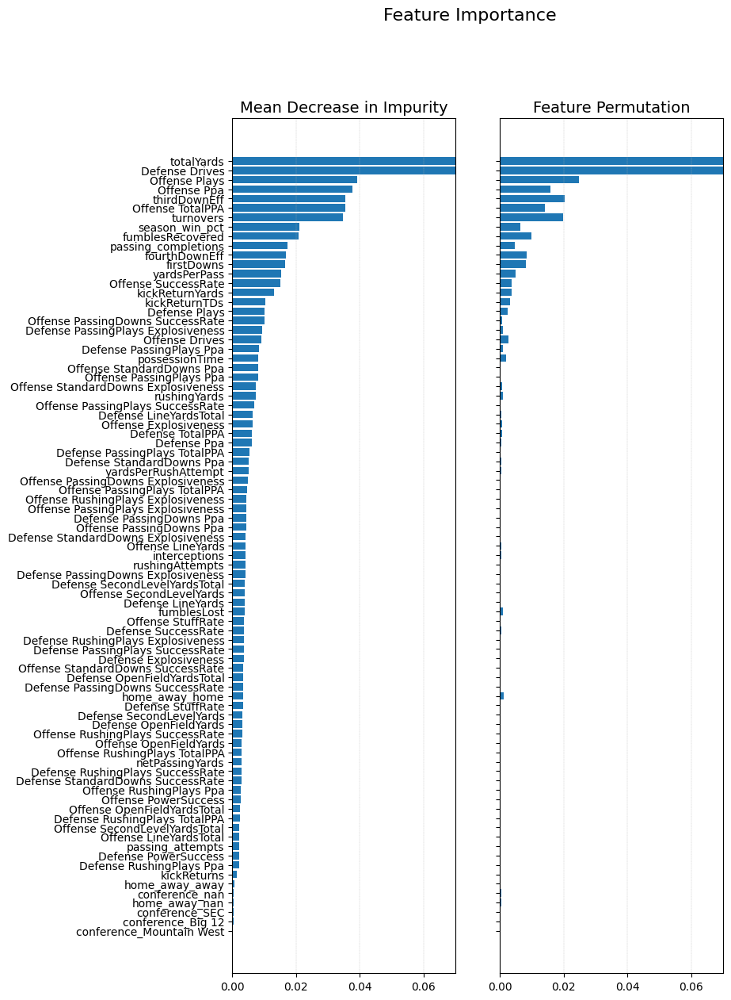

In [ ]:
# Mean Decrease in Impurity importance:
feature_importance_df = pd.DataFrame(
    adaboost_regressor.feature_importances_,
    columns = ['MDI'],
    index = X.columns
)

# Permutation importance:
feature_importance_df['PI'] = permutation_importance(
    adaboost_regressor,
    X_test,
    y_test,
    n_repeats = 3,
    random_state = 42,
    n_jobs = 2
).importances_mean

fig, axes = plt.subplots(1, 2, figsize = (8, 14), sharey = True)
plt.suptitle(('Feature Importance'), fontsize = 16)
axes[0].barh(
    feature_importance_df.sort_values('MDI').index[30:],
    feature_importance_df.sort_values('MDI')['MDI'][30:])
axes[0].set_title('Mean Decrease in Impurity', fontsize = 14)
axes[0].grid(axis = 'x', linestyle = '--', linewidth = 0.25)
axes[1].barh(
    feature_importance_df.sort_values('MDI').index[30:],
    feature_importance_df.sort_values('MDI')['PI'][30:])
axes[1].set_title('Feature Permutation', fontsize = 14)
axes[1].grid(axis = 'x', linestyle = '--', linewidth = 0.25)
axes[0].set_xlim([0, 0.07])
axes[1].set_xlim([0, 0.07]);

<center>Figure 4.3: AdaBoost Feature Importance</center>

<a id="NN"></a>

# 5.0 Neural Network Model

Neural network-based algorithms are inspired by scientists' understanding of how the human brain functions. The fundamental building blocks of these models are "nodes" - sometimes called neurons - each consisting of a linear (or affine) transformation and a non-linear activation function.  The output of individual nodes is a series of coefficients or "weights".  The network "learns" from the training data by progressively adjusting these weights to improve an objective or loss function.  Example objective functions include the predictive accuracy of the model (to be maximized) or the model's prediction error (to be minimized).  Neural network models are trained in a series of repeated rounds called "epochs".  Generally, model weights are updated with each successive epoch until improvement in the objective function stops.

## 5.1 Model

Neural networks come in many architectures; the model below is a fully connected neural network below with 6 hidden layers and 38,305 trainable parameters.

In [ ]:
# Apply One-Hot Encoding to 'conference':
ohe_encoder = OneHotEncoder(sparse_output = False)
one_hot_encoded = ohe_encoder.fit_transform(merged_df[['conference', 'home_away']])

one_hot_df = pd.DataFrame(one_hot_encoded, columns = ohe_encoder.get_feature_names_out(['conference', 'home_away']))
df_encoded = pd.concat([merged_df[selected_features], one_hot_df], axis = 1)
df_encoded = df_encoded.drop(['conference', 'home_away'], axis = 1)

# Select features:
X, y = merged_df[selected_features[0:-3] + ['season_win_pct']], merged_df['points']

# Train / test split:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

# Scale data:
scaler = StandardScaler()
scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Input:
input_layer = keras.Input(shape = (X_train.shape[1], ))

# Dense Layers:
x = layers.Dense(units = 128, activation = 'relu')(input_layer)
x = layers.Dense(units = 128, activation = 'relu')(x)
x = layers.Dense(units = 64, activation = 'relu')(x)
x = layers.Dense(units = 32, activation = 'relu')(x)
x = layers.Dense(units = 32, activation = 'relu')(x)
x = layers.Dense(units = 16, activation = 'relu')(x)

# Output:
output_layer = layers.Dense(units = 1, activation = 'linear')(x)
nn_regressor = keras.Model(inputs = input_layer, outputs = output_layer)

# Compile:
nn_regressor.compile(
    optimizer = 'adam',
    loss = 'mean_squared_error',
    metrics = ['R2Score']
)
# Train:
es = tf.keras.callbacks.EarlyStopping(
    monitor = 'val_loss',
    patience = 4,
    restore_best_weights = True
)
epochs = 25
nn_regressor.fit(
    X_train_scaled, y_train,
    epochs = epochs,
    batch_size = 32,
    validation_split = 0.2,
    callbacks = [es]
)

Epoch 1/25
611/611 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - R2Score: 0.1425 - loss: 186.7825 - val_R2Score: 0.8304 - val_loss: 35.8664
Epoch 2/25
611/611 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - R2Score: 0.8516 - loss: 32.0297 - val_R2Score: 0.8207 - val_loss: 37.9171
Epoch 3/25
611/611 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - R2Score: 0.8659 - loss: 28.4606 - val_R2Score: 0.8548 - val_loss: 30.6929
Epoch 4/25
611/611 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - R2Score: 0.8733 - loss: 26.7431 - val_R2Score: 0.8665 - val_loss: 28.2260
Epoch 5/25
611/611 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - R2Score: 0.8827 - loss: 26.1282 - val_R2Score: 0.8566 - val_loss: 30.3135
Epoch 6/25
611/611 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - R2Score: 0.8844 - loss: 24.7883 - val_R2Score: 0.8695 - val_loss: 27.5983
Epoch 7/25
611/611 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - R2Score: 0.8905 - loss: 23.7501 - val_R2Score: 0.8681 - val_loss: 27.8793
Epoch 8/25
611/611 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - R2Score: 0.8911 - loss: 23.3123 - val_R2Score: 0.

In [ ]:
nn_regressor.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 76)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │         9,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 1)              │            17 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 114,917 (448.90 KB)

 Trainable params: 38,305 (149.63 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 76,612 (299.27 KB)

## 5.2 Evaluation

As Figure 5.2.1 below illustrates, the neural network model outperforms both tree-based model achieving an **R-squared value of 0.879** on the unseen test data.  Similar to Figure 4.2.2, Figure 5.2.2 illustrates the predicted versus actual points scored for a subset of games played by the CFP contenders.

191/191 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


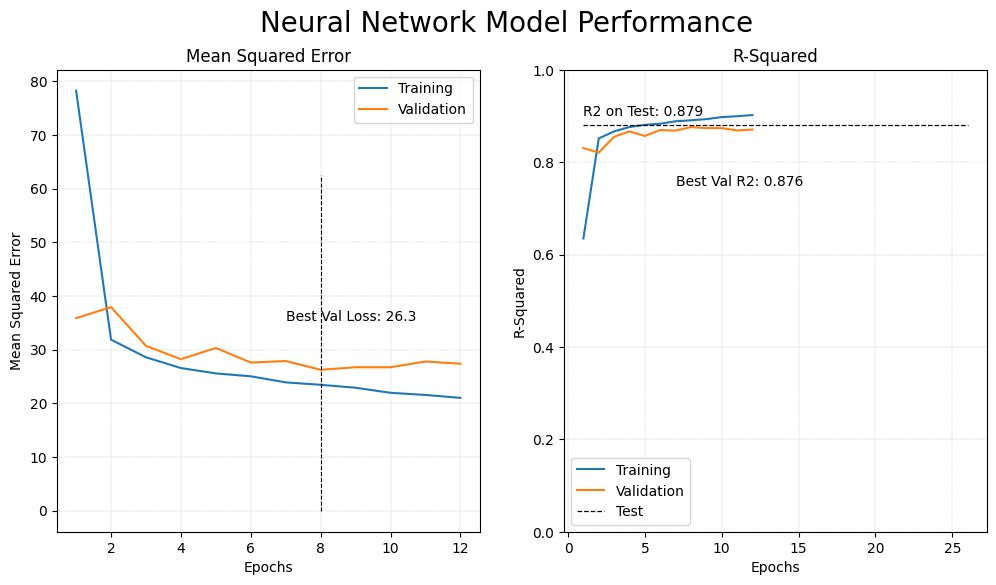

In [ ]:
fig, axes = plt.subplots(1, 2, figsize = (12, 6))
axes = axes.flatten()
plt.suptitle(('Neural Network Model Performance'), fontsize = 20)

axes[0].plot(range(1, len(nn_regressor.history.history['loss']) + 1), nn_regressor.history.history['loss'], label = 'Training')
axes[0].plot(range(1, len(nn_regressor.history.history['loss']) + 1), nn_regressor.history.history['val_loss'], label = 'Validation')
axes[1].plot(range(1, len(nn_regressor.history.history['loss']) + 1), nn_regressor.history.history['R2Score'], label = 'Training')
axes[1].plot(range(1, len(nn_regressor.history.history['loss']) + 1), nn_regressor.history.history['val_R2Score'], label = 'Validation')

y_pred_test = nn_regressor.predict(X_test_scaled)
r2_test = r2_score(y_test, y_pred_test)
axes[1].plot([1, epochs + 1], [r2_test, r2_test], label = 'Test', linestyle = '--', linewidth = 0.9, color = 'black')

for i, j in zip(range(2), ['Mean Squared Error', 'R-Squared']):
    axes[i].grid(linestyle = '--', linewidth = 0.25)
    axes[i].set_xlabel('Epochs')
    axes[i].legend()
    axes[i].set_ylabel(j)
    axes[i].set_title(j)
axes[0].plot([np.argmin(nn_regressor.history.history['val_loss']) + 1,
              np.argmin(nn_regressor.history.history['val_loss']) + 1],
             [0, np.max(nn_regressor.history.history['loss']) * 0.8],
             linestyle = '--', linewidth = 0.8, color = 'black')

min_val_loss = np.min(nn_regressor.history.history['val_loss'])
max_val_r2 = np.max(nn_regressor.history.history['val_R2Score'])

axes[0].annotate(f'Best Val Loss: {round(min_val_loss, 1)}',
                 xy = [(int(len(nn_regressor.history.history['loss']) * 0.65)), np.min(nn_regressor.history.history['val_loss']) * 1.35])
axes[1].annotate(f'Best Val R2: {round(max_val_r2, 3)}',
                 xy = [(int(len(nn_regressor.history.history['loss']) * 0.65)), 0.75])
axes[1].annotate(f'R2 on Test: {round(r2_test, 3)}',
                 xy = [(int(len(nn_regressor.history.history['loss']) * 0.15)), 0.9])
axes[1].set_ylim([0, 1]);

<center>Figure 5.2.1: Neural Network Model Performance</center>

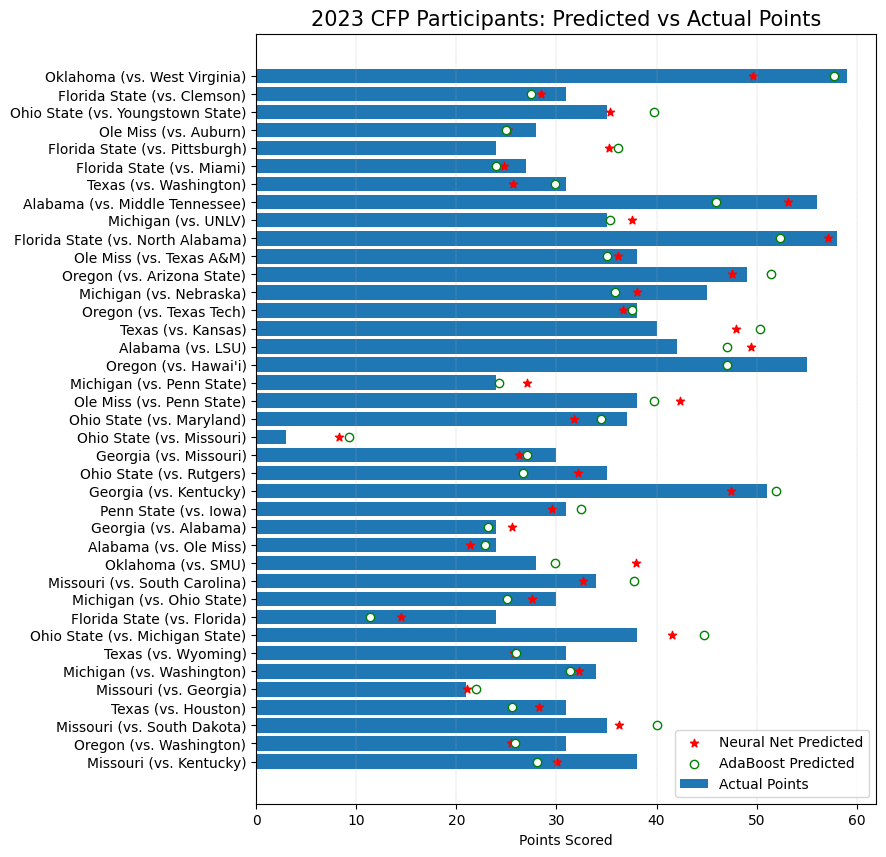

In [ ]:
temp_df = pd.DataFrame(y_test)
temp_df['y_pred_boost'] = y_pred_test_boost
temp_df['y_pred_nn'] = y_pred_test

temp_df = temp_df.join(
    cfp_2023_df[['Team', 'Opponent']],
    how = 'inner'
)
temp_df['text'] = temp_df['Team'] + ' (vs. ' + temp_df['Opponent'] + ')'

fig, axes = plt.subplots(1, 1, figsize = (8, 10))
axes.barh(temp_df['text'], temp_df['points'], label = 'Actual Points')
axes.scatter(
    temp_df['y_pred_nn'],
    temp_df['text'], marker = '*',
    color = 'r',
    label = 'Neural Net Predicted'
)
axes.scatter(
    temp_df['y_pred_boost'],
    temp_df['text'],
    marker = 'o',
    facecolors = 'white',
    color = 'green',
    label = 'AdaBoost Predicted'
)
axes.set_title('2023 CFP Participants: Predicted vs Actual Points', fontsize = 15)
axes.set_xlabel('Points Scored')
axes.grid(axis = 'x', linestyle = '--', linewidth = 0.25)
axes.legend();

<center>Figure 5.2.2: Neural Network Predicted vs Actual Points</center>

<a id="Methodology"></a>

# 6.0 Methodology: Feature Data Creation

Sections 4 and 5 above create and evaluate models to predict points scored based on a selection of features.  The data used to train these models are captured from historical football games.  To project the winners of matchups in a *hypothetical college football playoff*, these data must be created as input to the predictive model(s) constructed above.

Section 6 sequentially details the methodology for creating the required hypothetical feature data.  The approach treats **each feature as a random variable** and defines for each a probability density function (PDF).  PDFs mathematically identify which values of a random variable are more likely to occur.  While the number of total yards gained by Oklahoma in a hypothetical game cannot be known with certainty, likely values can be identified based on Oklahoma's performance in 2023 regular season play.

In Section 6.1, PDFs are created for six features for 2023's #1-ranked Michigan Wolvervines for illustration.  Of course, the on-field performance of any football team is influenced by their opponent.  In Section 6.2, the impact on feature PDFs is illustrated assuming Michigan's opponent is the #4-ranked Alabama Crimson Tide (this matchup was featured in the 2023 Rose Bowl game).

But this is not the whole story either.  The probability density functions created in Sections 6.1 and 6.2 encompass actual 2023 game data.  But not all football conferences and not all football season schedules are created equal.  Section 6.3 details how strength of schedule and the level of competition is incorporated when building the PDF input to the predictive models.

Once created, feature PDFs are repeatedly and randomly sampled in a **Monte Carlo simulation** in Section 6.4 and fed into the neural network model created in Section 5 to predict win probabilities for individual game matchups.

Section 6.5 explores the sensitivity to two key model parameters - the standard deviations assumed in establishing the probability density functions, and the incremental weights to be applied with strength of schedule.

## 6.1 Creating PDFs Part 1:  Subject Team

The cell below illustrates generating probability distributions for 6 key features for 2023's Michigan Wolverines:

- Total Yards
- Offense Total PPA
- Defense Drives
- Offense PPA
- Passing Completions
- 3rd Down Efficiency

The **objective is to identify the most likely feature values for the 2023 CFP hypothetical matchups**.  In other words, in a hypothetical Michigan vs. Alabama matchup, what are the most likely values of total yards for each team?  Total yards, of course, is one key feature used by the tree-based and neural network models in Sections 4 and 5 to predict total points scored.

For each feature required by the model, each 2023 game for the teams in an individual matchup is considered in determining the probability distributions.  Each game is treated as an individual normally distributed random variable with mean centered at the actual performance level and standard deviation applied (more on that in Section 6.5).  The individual normal distributions are then summed and normalized to create a single probability density function for each feature required by the predictive models.

An example may be helpful.  The six sub-plots below illustrate probability distributions for six key model features.  In the subplot in the upper-left, the feature *total yards* is plotted.  Each game of Michigan's 2023 season is included and the total yards gained by Michigan in each game is annotated via the vertical dashed red lines and their opponent.  Against Iowa, for example, Michigan gained only ~215 total yards.  For the Iowa matchup, an individual Gaussian distribution is created centered at 215 yards with standard deviation 10 yards.  This process of creating individual distributions per game is repeated for the remainder of games in the season.  The individual distributions are then summed and normalized - represented as the blue line.  The result is a probability distribution (summing to 1) describing the expected value of total yards gained by Michigan in the 2023 season.  Clearly, the plot suggests the most likely values of total yards is between 400-450 yards.  This outcome, of course, is expected as Michigan gained between 400 and 450 yards against several teams including East Carolina, Rutgers, and Indiana.

But of course, this is not the whole story.  Defenses are tasked with minimizing total yards gained and, ultimately, total points scored, and the most effective defenses in college football are more likely to participate in the playoff.  And, of course, the analysis detailed in the cell below does not differentiate by opponent - rather, it treats all opponents equally when building PDFs.

Section 6.2 incorporates the performance of the defense in determining probability distribution functions.

Expressed mathematically, the first step in building PDFs is simply creating one normal distribution for each 2023 game played:

$$
f(x){ _{team}} = \sum_{i=1}^{n} \mathcal{N}(x | \mu_i, \sigma_i^2)
$$

The second step is to normalize the sum to be a probability density function summing to 1:

$$
\frac{1}{ \int_{-\infty}^{+\infty} f(x){ _{team}} dx} f(x){ _{team}} = 1
$$

Where:
* $f(x){ _{team}}$ is the aggregate of individual game probability distributions for the subject team
* $n$ is the number of Gaussian distributions; one for each game the subject team played in 2023
* $\mathcal{N}(x | mu_i, \sigma_i^2)$ represents the probability distribution function of the $i^{th}$ Gaussian distribution
* $\mu_i$ is the mean
* $\sigma_i^2$ is the variance
* $x$ is the feature

This process is repeated for each feature required by the predictive model.

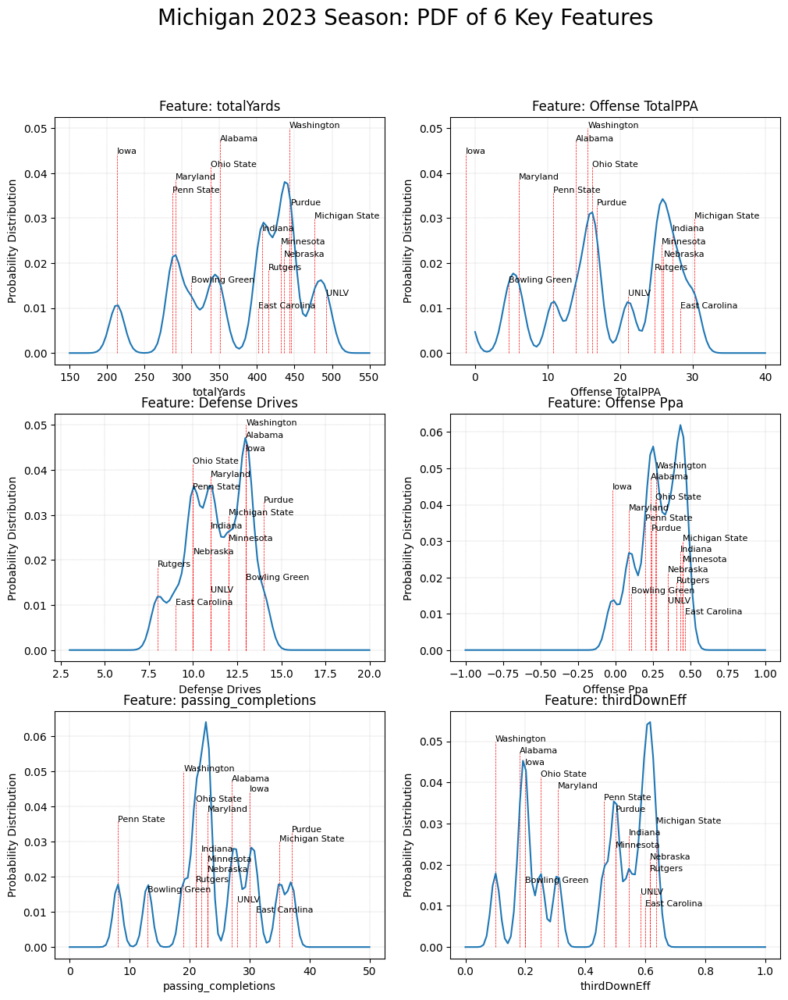

In [ ]:
key_features = ['Opponent', 'totalYards',
    'Offense TotalPPA', 'Defense Drives',
    'Offense Ppa',
    'passing_completions', 'thirdDownEff']

temp_df = cfp_2023_df[cfp_2023_df['Team'] == 'Michigan'][key_features]

fig, axes = plt.subplots(3, 2, figsize = (12, 14))
axes = axes.flatten()
plt.suptitle(('Michigan 2023 Season: PDF of 6 Key Features'), fontsize = 20)

def plot_helper(low, high, feature, sd):
    cum_pdf, x = 0, np.linspace(low, high, 100)
    for n in temp_df.loc[:, feature]:
        pdf = norm.pdf(x, n, sd)
        cum_pdf = cum_pdf + pdf
    return x, cum_pdf

key_dims = [(150, 550, 10), # Low, high, standard deviation
            (0, 40, 1),
            (3, 20, 0.4),
            (-1, 1, 0.04),
            (0, 50, 0.75),
            (0, 1, 0.015)]

for m, feature, p in zip(range(6), key_features[1:], range(6)):
    for i, j in zip(range(temp_df.shape[0]), np.linspace(0.01, 0.05, temp_df.shape[0])):
        axes[m].annotate(temp_df.iloc[i, 0], xy = [temp_df.iloc[i, p+1], j], fontsize = 8)
        axes[m].plot([temp_df.iloc[i, p+1], temp_df.iloc[i, p+1]], [0, j], linestyle = '--', linewidth = 0.5, color = 'r')
    x, cum_pdf = plot_helper(key_dims[m][0], key_dims[m][1], feature, key_dims[m][2])
    axes[m].plot(x, (cum_pdf / cum_pdf.sum()))

for k, m in zip(range(6), key_features[1:]):
    axes[k].grid(linestyle = '--', linewidth = 0.25)
    axes[k].set_title(f'Feature: {m}')
    axes[k].set_ylabel('Probability Distribution')
    axes[k].set_xlabel(m);

<center>Figure 6.1: 6 Example Probability Density Functions - Michigan</center>

## 6.2 Creating PDFs Part 2:  Opponent

The analysis below extends the probability distributions above to incorporate the performance of the defense in a hypothetical Michigan vs. Alabama matchup.  The subplots below illustrate the same six features, and the probability distribution represented by the blue line is the same distribution created above.  The **red dashed line represents the performance of Alabama's opponents** in the 2023 season.  Again, the objective is to account for the effectiveness of the defense in a given matchup recognizing that the performance of an offense (including points scored) will be impacted by the defense.

In the subplot in the upper-left below, the familiar total yards is plotted.  The plot indicates the most likely number of total yards gained by Alabama's opponents is centered around ~250 yards with another relatively high-probability range around 300-350 yards.  Clearly, the data indicates Michigan often captures many more total yards per game than Alabama's opponents (in the 2023 season).

Similar to the above, **the two distributions are summed and normalized**.  The resulting probability distribution sums to 1.0.

The result is a mathematical description of the likelihood of individual values for each feature required by the predictive model.  But the result treats each game and each opponent equally.  Section 6.3 differentiates performance based on strength of schedule.  (Ideally) the college football playoff includes the 12 best teams.  Performance against top opponents should be given incremental weight.

As above, one normal distribution is created for each feature for each of Alabama's opponents in 2023:

$$
f(x){ _{opponent}} = \sum_{i=1}^{n} \mathcal{N}(x | \mu_i, \sigma_i^2)
$$

The aggregated normal distributions for the Michigan and for Alabama's opponents are then summed and normalized:

$$
\frac{1}{{ \int_{-\infty}^{+\infty} f(x){ _{opponent}} dx} + { \int_{-\infty}^{+\infty} f(x){ _{team}} dx}} f(x){ _{opponent}} + f(x){ _{team}} = 1
$$

Where:
* $f(x){ _{opponent}}$ is the aggregate of individual probability distributions for the subject team's opponent
* $f(x){ _{team}}$ is the aggregate of individual probability distributions for the subject team
* $n$ is the number of Gaussian distributions; one for each game the subject team played in 2023
* $\mathcal{N}(x | mu_i, \sigma_i^2)$ represents the probability distribution function of the $i^{th}$ Gaussian distribution
* $\mu_i$ is the mean
* $\sigma_i^2$ is the variance
* $x$ is the feature


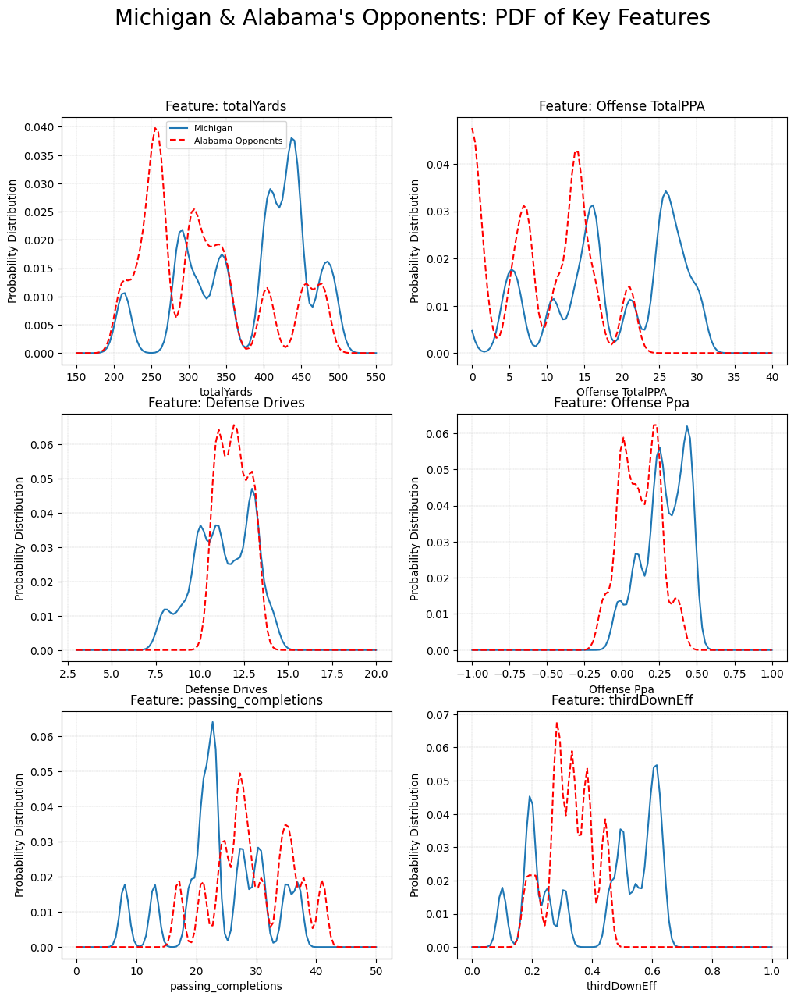

In [ ]:
key_features = ['Opponent', 'totalYards',
    'Offense TotalPPA', 'Defense Drives',
    'Offense Ppa',
    'passing_completions', 'thirdDownEff']

temp_df = cfp_2023_df[cfp_2023_df['Team'] == 'Michigan'][key_features]
opposition_ids = cfp_2023_df[cfp_2023_df['Team'] == 'Alabama']['game_id'].to_list()
temp_df2 = merged_df[(merged_df['game_id'].isin(opposition_ids)) & (merged_df['Team'] != 'Alabama')][key_features]

fig, axes = plt.subplots(3, 2, figsize = (12, 14))
axes = axes.flatten()
plt.suptitle(("Michigan & Alabama's Opponents: PDF of Key Features"), fontsize = 20)

def plot_helper(low, high, df, feature, sd):
    cum_pdf, x = 0, np.linspace(low, high, 100)
    for n in df.loc[:, feature]:
        pdf = norm.pdf(x, n, sd)
        cum_pdf = cum_pdf + pdf
    return x, cum_pdf

key_dims = [(150, 550, 10), # Low, high, standard deviation
            (0, 40, 1),
            (3, 20, 0.4),
            (-1, 1, 0.04),
            (0, 50, 0.75),
            (0, 1, 0.015)]

for m, feature, p in zip(range(6), key_features[1:], range(6)):
    x, cum_pdf = plot_helper(key_dims[m][0], key_dims[m][1], temp_df, feature, key_dims[m][2])
    axes[m].plot(x, (cum_pdf / cum_pdf.sum()), label = 'Michigan')

    x, cum_pdf = plot_helper(key_dims[m][0], key_dims[m][1], temp_df2, feature, key_dims[m][2])
    axes[m].plot(x, (cum_pdf / cum_pdf.sum()), color = 'r', linestyle = '--', label = 'Alabama Opponents')

for k, m in zip(range(6), key_features[1:]):
    axes[k].grid(linestyle = '--', linewidth = 0.25)
    axes[k].set_title(f'Feature: {m}')
    axes[k].set_ylabel('Probability Distribution')
    axes[k].set_xlabel(m)

axes[0].legend(fontsize = 8);

<center>Figure 6.2: 6 Example Probability Density Functions - Alabama's Opponents</center>

## 6.3 Creating PDFs Part 3:  Strength of Schedule

In Sections 6.1 and 6.2, the performances of the two teams are incorporated considering 2023 season game data.  Section 6.3 seeks to differentiate the level of competition in the 2023 dataset by incrementally weighting teams' performance against more successful opponents.  In short, a team's performance against opponents with a high winning percentage is weighted more heavily than teams with a poor winning percentage.

In light of college football's conference structure, limited interconference play, and the number of teams in the FBS, fully and equitably accounting for strength of schedule in a data-driven way is ***Mission Impossible***.  The approach described below has its merits, and admittedly, its flaws.  The approach does not account for any competitive bias across conferences, for example.


The approach simply applies a weighting factor to each game's normal distribution called "OWP": opponent's win percentage.  An exponent (k) is applied to OWP and the sensitivity of the output to k is explored in Section 6.5.

$$
f(x){ _{team}} = \sum_{i=1}^{n} \mathcal{N}(x | \mu_i, \sigma_i^2) (OWP_i)^k
$$

$$
f(x){ _{opponent}} = \sum_{i=1}^{n} \mathcal{N}(x | \mu_i, \sigma_i^2) (OWP_i)^k
$$


$$
\frac{1}{{ \int_{-\infty}^{+\infty} f(x){ _{opponent}} dx} + { \int_{-\infty}^{+\infty} f(x){ _{team}} dx}} f(x){ _{opponent}} + f(x){ _{team}} = 1
$$

Where:
* $OWP_i$ is the opponents' win percentage
* $k$ is a weighting exponent
* $f(x){ _{opponent}}$ is the aggregate of individual probability distributions for the subject team's opponent
* $f(x){ _{team}}$ is the aggregate of individual probability distributions for the subject team
* $n$ is the number of Gaussian distributions; one for each game the subject team played in 2023
* $\mathcal{N}(x | mu_i, \sigma_i^2)$ represents the probability distribution function of the $i^{th}$ Gaussian distribution
* $\mu_i$ is the mean
* $\sigma_i^2$ is the variance
* $x$ is the feature

### 6.3.1 Apply Strength of Schedule: Calculate PDF

The two plots below illustrate the impact of strength of schedule on the six probability distributions - first for Michigan, and again for Alabama.

In the case of Michigan (immediately below), the solid blue line represents the distribution generated above - with no adjustment for strength of schedule applied.  The dashed blue line represents the impact of strength of schedule.  Incorporating strength of schedule **elevates the probability of gaining 200-350** *total yards* (corresponding to opponents **Ohio State, Penn State**, and **Iowa**), and moderates the probability of gaining more than 400 *total yards*.

Note the value *k* - the weighting exponent is 2.

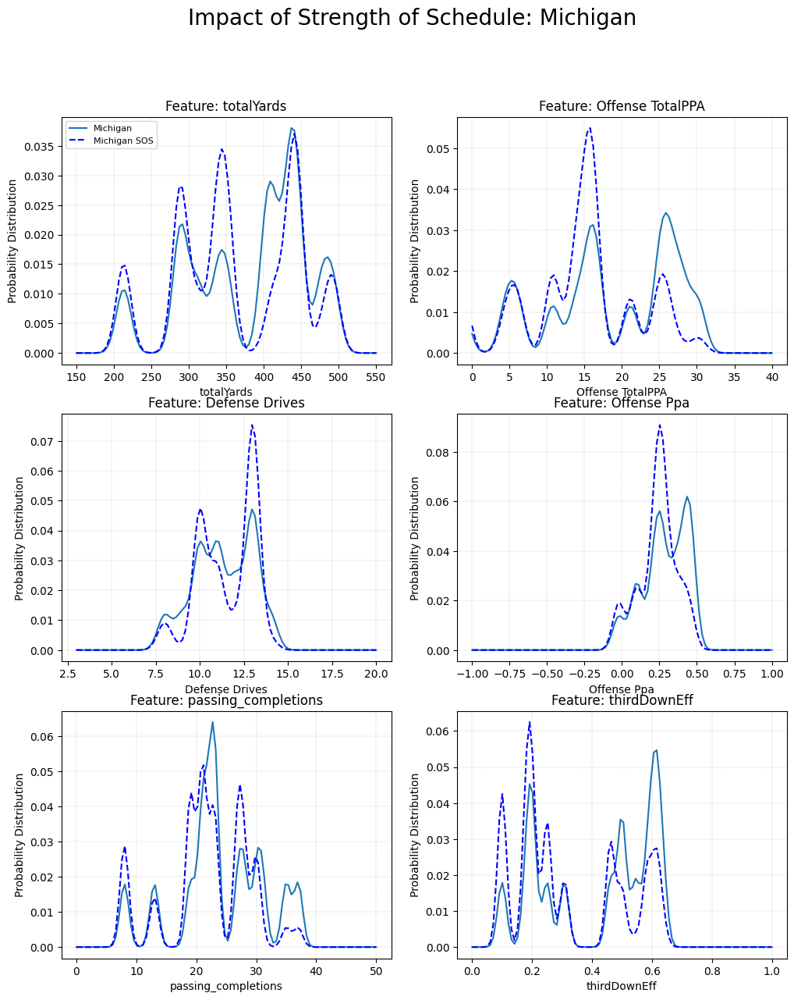

In [ ]:
key_features = ['Opponent', 'totalYards',
    'Offense TotalPPA', 'Defense Drives',
    'Offense Ppa',
    'passing_completions', 'thirdDownEff']

temp_df = cfp_2023_df[cfp_2023_df['Team'] == 'Michigan'][key_features]
opposition_ids = cfp_2023_df[cfp_2023_df['Team'] == 'Alabama']['game_id'].to_list()
temp_df2 = merged_df[(merged_df['game_id'].isin(opposition_ids)) & (merged_df['Team'] != 'Alabama')][key_features]

exponent = 2
win_pct_list = [win_pct_df[
                (win_pct_df['Team'] == team) & (
                    win_pct_df['Season'] == 2023)]['win_pct'].values[0]
                for team in cfp_2023_df[cfp_2023_df['Team'] == 'Michigan']['Opponent']]
win_pct_list = [i**exponent for i in win_pct_list]

fig, axes = plt.subplots(3, 2, figsize = (12, 14))
axes = axes.flatten()
plt.suptitle(('Impact of Strength of Schedule: Michigan'), fontsize = 20)

def plot_helper(low, high, df, feature, sd, pct_list):
    cum_pdf, x = 0, np.linspace(low, high, 100)
    for n, k in zip(df.loc[:, feature], pct_list):
        pdf = norm.pdf(x, n, sd)
        cum_pdf = cum_pdf + pdf * k
    return x, cum_pdf

key_dims = [(150, 550, 10), # Low, high, standard deviation
            (0, 40, 1),
            (3, 20, 0.4),
            (-1, 1, 0.04),
            (0, 50, 0.75),
            (0, 1, 0.015)]

for m, feature, p in zip(range(6), key_features[1:], range(6)):
    # Michigan:
    x, cum_pdf = plot_helper(key_dims[m][0], key_dims[m][1], temp_df, feature, key_dims[m][2], np.ones(temp_df.shape[0]))
    axes[m].plot(x, (cum_pdf / cum_pdf.sum()), label = 'Michigan')

    # Strength of schedule:
    x, cum_pdf = plot_helper(key_dims[m][0], key_dims[m][1], temp_df, feature, key_dims[m][2], win_pct_list)
    axes[m].plot(x, (cum_pdf / cum_pdf.sum()), color = 'blue', linestyle = '--', label = 'Michigan SOS')

for k, m in zip(range(6), key_features[1:]):
    axes[k].grid(linestyle = '--', linewidth = 0.25)
    axes[k].set_title(f'Feature: {m}')
    axes[k].set_ylabel('Probability Distribution')
    axes[k].set_xlabel(m)

axes[0].legend(fontsize = 8);

<center>Figure 6.3.1: 6 Example Probability Density Functions - Strength of Schedule</center>

Similarly, the approach is applied to Alabama.  As above, the dashed line represents the impact of incrementally weighting opponents with high and low win percentages.

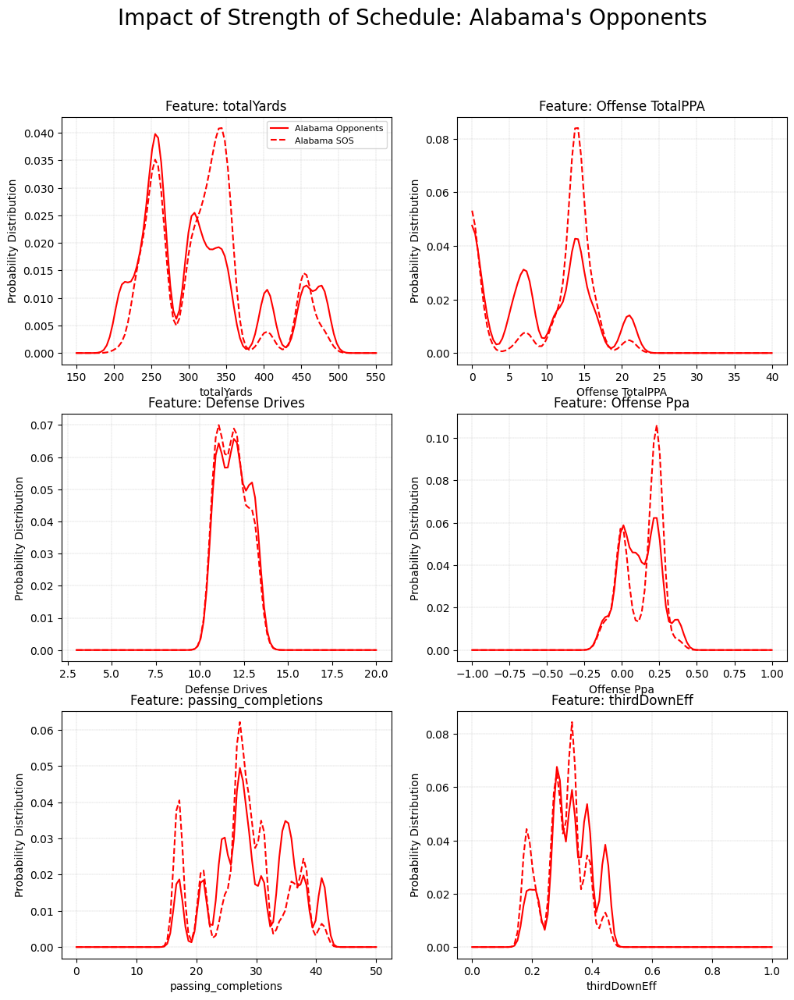

In [ ]:
key_features = ['Opponent', 'totalYards',
    'Offense TotalPPA', 'Defense Drives',
    'Offense Ppa',
    'passing_completions', 'thirdDownEff']

temp_df = cfp_2023_df[cfp_2023_df['Team'] == 'Michigan'][key_features]
opposition_ids = cfp_2023_df[cfp_2023_df['Team'] == 'Alabama']['game_id'].to_list()
temp_df2 = merged_df[(merged_df['game_id'].isin(opposition_ids)) & (merged_df['Team'] != 'Alabama')][key_features]

exponent = 2
win_pct_list = [win_pct_df[
                (win_pct_df['Team'] == team) & (
                    win_pct_df['Season'] == 2023)]['win_pct'].values[0]
                for team in cfp_2023_df[cfp_2023_df['Team'] == 'Michigan']['Opponent']]

win_pct_list = [i**exponent for i in win_pct_list]

fig, axes = plt.subplots(3, 2, figsize = (12, 14))
axes = axes.flatten()
plt.suptitle(("Impact of Strength of Schedule: Alabama's Opponents"), fontsize = 20)

def plot_helper(low, high, df, feature, sd, pct_list):
    cum_pdf, x = 0, np.linspace(low, high, 100)
    for n, k in zip(df.loc[:, feature], pct_list):
        pdf = norm.pdf(x, n, sd)
        cum_pdf = cum_pdf + pdf * k
    return x, cum_pdf

key_dims = [(150, 550, 10), # Low, high, standard deviation
            (0, 40, 1),
            (3, 20, 0.4),
            (-1, 1, 0.04),
            (0, 50, 0.75),
            (0, 1, 0.015)]

for m, feature, p in zip(range(6), key_features[1:], range(6)):
    # Alabama's opponents:
    x, cum_pdf = plot_helper(key_dims[m][0], key_dims[m][1], temp_df2, feature, key_dims[m][2], np.ones(temp_df2.shape[0]))
    axes[m].plot(x, (cum_pdf / cum_pdf.sum()), color = 'r', label = 'Alabama Opponents')

    # Strength of schedule:
    x, cum_pdf = plot_helper(key_dims[m][0], key_dims[m][1], temp_df2, feature, key_dims[m][2], win_pct_list)
    axes[m].plot(x, (cum_pdf / cum_pdf.sum()), color = 'red', linestyle = '--', label = 'Alabama SOS')

for k, m in zip(range(6), key_features[1:]):
    axes[k].grid(linestyle = '--', linewidth = 0.25)
    axes[k].set_title(f'Feature: {m}')
    axes[k].set_ylabel('Probability Distribution')
    axes[k].set_xlabel(m)

axes[0].legend(fontsize = 8);

<center>Figure 6.3.2: 6 Example Probability Density Functions - Strength of Schedule</center>

### 6.3.2 Using PDFs to Generate Model Inputs

In the following cell, Sections 6.1 through 6.3 are combined in a function - *team_prediction_builder*.  Function inputs are:
- subject team
- subject team's opponent
- simulation size (i.e., nummber samples to be drawn from the PDFs)
- weighting exponent *k*
- *sd_divisor* to define the standard deviation assumed in creating normal distributions.

The output of the function is a dataframe whose columns represent the features required as input to the predictive model and whose rows represent the number of samples to be drawn (each sample represents a simulated game).

This function is used to project the winners of the CFP matchups in Section 7.

In [ ]:
def team_prediction_builder(team, opponent, n_samples, sos_exponent, sd_scaler):
    # Create temporary df for offensive team:
    temp_df = cfp_2023_df[cfp_2023_df['Team'] == team][selected_features[0:-3]]

    # Create temporary df for defensive team:
    opposition_ids = cfp_2023_df[cfp_2023_df['Team'] == opponent]['game_id'].to_list()
    temp_df2 = merged_df[(merged_df['game_id'].isin(opposition_ids)) & (merged_df['Team'] != opponent)][selected_features]

    # Create list of opponent's 2023 win percentage:
    win_pct_list = [win_pct_df[
                (win_pct_df['Team'] == team) & (
                    win_pct_df['Season'] == 2023)]['win_pct'].values[0]
                for team in cfp_2023_df[cfp_2023_df['Team'] == team]['Opponent']]

    # interpolate win percentages exponentially:
    win_pct_list = [i**sos_exponent for i in win_pct_list]

    # Calculate PDFs for each feature:
    team_model_inputs = {}
    for feature in selected_features[0:-3]:
        low = merged_df[feature].min()
        high = merged_df[feature].max()
        sd = (merged_df[feature].max() - merged_df[feature].min()) * sd_scaler
        cum_pdf, x = 0, np.linspace(low, high, 100)
        for m, n, k in zip(temp_df.loc[:, feature], temp_df2.loc[:, feature], win_pct_list):
            pdf = norm.pdf(x, m, sd) * k
            pdf2 = norm.pdf(x, n, sd) * k
            cum_pdf = cum_pdf + pdf + pdf2
        samples = np.random.choice(len(cum_pdf), n_samples, p = (cum_pdf / cum_pdf.sum()))
        team_model_inputs[feature] = x[samples]
    team_model_inputs['season_win_pct'] = win_pct_df[(win_pct_df['Team'] == opponent) & (win_pct_df['Season'] == 2023)]['win_pct'].values[0]

    return pd.DataFrame(team_model_inputs)

## 6.4 Monte Carlo Simulation: Predict Win Probability

**Monte Carlo simulation**$^{5}$ or methods are a broad class of computational algorithms that rely on repeated random sampling to obtain numerical results. The underlying concept is to use randomness to solve problems that might be deterministic in principle. The name comes from the Monte Carlo Casino in Monaco, where the primary developer of the method, mathematician Stanislaw Ulam, was inspired by his uncle's gambling habits.  Monte Carlo methods have been recognized as one of the most important and influential ideas of the 20th century, and they have enabled many scientific and technological breakthroughs.

Consistent with the subject study, Monte Carlo methods tend to follow a particular pattern:
1. Define the domain of possible inputs (e.g., a probability density function).
2. Generate inputs randomly from the probability distribution over the domain.
3. Perform a deterministic computation of the outputs (a neural network model in the case of the subject study).
4. Aggregate the results (in this case, the predicted winner of college football games).

The following cell applies the function above pulling **500 random values** for each of the 93 features required by the predictive models.  The 500 sets of feature values are fed into the neural network model produced in Section 5 and the total points scored by each team are predicted.  The plots below illustrate the frequency distributions of the points scored by each team in the 500 hypothetical Michigan / Alabama matchups.

Of course, the Michigan and Alabama matchup was featured in the 2023 Rose Bowl game.  The final score was **Michigan 27, Alabama 20**.  In the simulation, **Michigan outscores Alabama in 60.4% of the 500 simulated games**.

$^{5}$https://en.wikipedia.org/wiki/Monte_Carlo_method


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 
16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


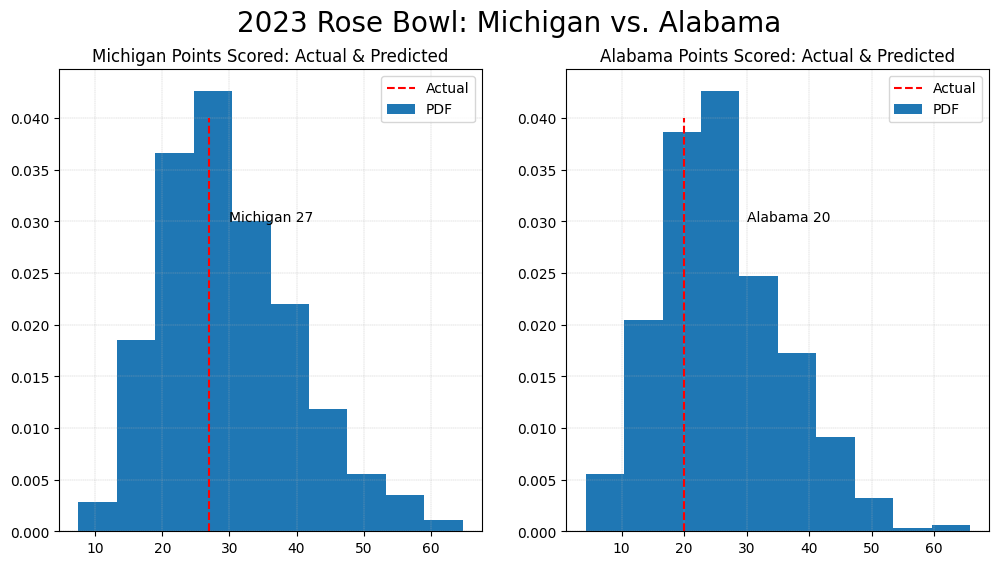

In [ ]:
Michigan_rd1 = team_prediction_builder('Michigan', 'Alabama', 500, 0, 0.05)
Michigan_rd1_scaled = scaler.transform(Michigan_rd1)
Michigan_rd1_points = nn_regressor.predict(Michigan_rd1_scaled)

Alabama_rd1 = team_prediction_builder('Alabama', 'Michigan', 500, 0, 0.05)
Alabama_rd1_scaled = scaler.transform(Alabama_rd1)
Alabama_rd1_points = nn_regressor.predict(Alabama_rd1_scaled)

fig, axes = plt.subplots(1, 2, figsize = (12, 6))
axes = axes.flatten()
plt.suptitle(('2023 Rose Bowl: Michigan vs. Alabama'), fontsize = 20)
axes[0].set_title('Michigan Points Scored: Actual & Predicted')
axes[1].set_title('Alabama Points Scored: Actual & Predicted')

axes[0].plot([cfp_2023_df[(cfp_2023_df['Team'] == 'Michigan') & (cfp_2023_df['Opponent'] == 'Alabama')]['points'],
            cfp_2023_df[(cfp_2023_df['Team'] == 'Michigan') & (cfp_2023_df['Opponent'] == 'Alabama')]['points']], [0, 0.04],
            label = 'Actual', color = 'r', linestyle = '--')
axes[1].plot([cfp_2023_df[(cfp_2023_df['Team'] == 'Alabama') & (cfp_2023_df['Opponent'] == 'Michigan')]['points'],
              cfp_2023_df[(cfp_2023_df['Team'] == 'Alabama') & (cfp_2023_df['Opponent'] == 'Michigan')]['points']], [0, 0.04],
             label = 'Actual', color = 'r', linestyle = '--')
axes[0].annotate(f"Michigan {int(cfp_2023_df[(cfp_2023_df['Team'] == 'Michigan') & (cfp_2023_df['Opponent'] == 'Alabama')]['points'].iloc[0])}", xy = [30, 0.03])
axes[1].annotate(f"Alabama {int(cfp_2023_df[(cfp_2023_df['Team'] == 'Alabama') & (cfp_2023_df['Opponent'] == 'Michigan')]['points'].iloc[0])}", xy = [30, 0.03])

for i, j, k in zip(range(2), [Michigan_rd1_points, Alabama_rd1_points], ['Michigan', 'Alabama']):
    axes[i].hist(j, density = True, label = 'PDF')
    axes[i].legend()
    axes[i].grid(linestyle = '--', linewidth = 0.25);

<center>Figure 6.4.1: Distribution of Predicted Points Scored - Michigan vs. Alabama</center>

In [ ]:
Michigan_win_prob = Alabama_rd1_points < Michigan_rd1_points
print('Michigan win probability:', round(Michigan_win_prob.sum() / len(Michigan_win_prob), 4))

Michigan win probability: 0.618


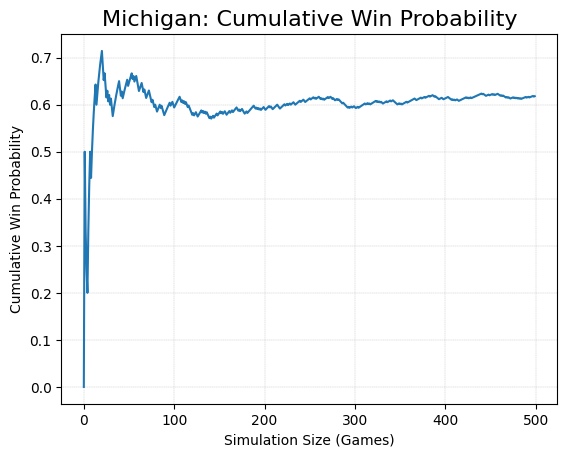

In [ ]:
plt.plot([Michigan_win_prob[0:i].sum() / len(Michigan_win_prob[0:i]) for i in range(1, len(Michigan_win_prob) + 1)])
plt.xlabel('Simulation Size (Games)')
plt.ylabel('Cumulative Win Probability')
plt.title('Michigan: Cumulative Win Probability', fontsize = 16)
plt.grid(linestyle = '--', linewidth = 0.25);

<center>Figure 6.4.2: Michigan Win Probability over 500 Simulations</center>

## 6.5 Sensitivity Analysis

As highlighted in the preceeding text, the approach assumes values for two key modeling parameters:
1. the weight applied for strength of schedule (driven by the exponent *k*), and
2. the standard deviation of individual Gaussian distributions (Section 6.1).

Section 6.5 explores the sensitivity of model outputs to these parameters.

### 6.5.1 Strength of Schedule Weight

As described in Section 6.3 above, the weight applied to a team's performance in a particular game is driven by the 2023 winning percentage of their opponent in that game.  Games against opponents with higher winning percentages are more heavily weighted.  How much more weight is driven by the exponent *k* in the following equation:

$$
Weight factor{ _{SOS(i)}} = OWP{ _{i}}^k
$$

Where:
* $Weight factor{ _{SOS(i)}}$ is the strength of schedule weight factor for game $i$
* $OWP{ _{i}}$ the 2023 win percentage of the team's opponent in game $i$
* $k$ is the strength of schedule exponent

Figure 6.5.1 immediately below illustrates the relationship between the win percentage of a team's opponent and the weight factor applied to a team's probability density function for four values of the strength of schedule exponent *k*.  For k = 0, a strength of schedule weight of 1.0 is applied to all opponents.  Conversely, at k = 5, minimal weight is given to games against opponents with a 2023 win percentage under 0.4.

The impact on points scored is evaluated for three values of *k*: 0, 1, and 5.  These values are explored for each of the CFP participants and two outputs are presented below.  In Figures 6.5.2, a hypothetical Oregon vs. Texas matchup (the weakest strength of schedule vs. the strongest) illustrates the muted impact of varying the exponent *k*.  While the distribution of predicted points scored varies somewhat, the variation in median and interquartile range across *k* values is negligible.

Two of the teams exhibiting the most variation in predicted points scored at different values of *k* are Penn State and Ohio State (Figure 6.5.3).  With both teams, penalizing weaker schedules more with increased *k* values has a material impact on predicted points scored.  In the case of Penn State, bumping *k* from 0 to 1 reduces the median predicted points scored by approximately 3-4 points and increasing *k* to 5 costs Penn State an additional 3-4 points.  The impact on Ohio State's predicted points scored distribution is similar.

Based on this sensitivity analysis, a ***k* value of 1** is used in creating CFP predictions in Section 7.  Using a value of 0 treats all opponents equally, and a *k* value of 5 limits the data provided the neural network model to create predictions.  It is also important to keep in mind this is not the only place strength of schedule is incorporated in the model.  Recall an additional feature is created in Section 4 incorporating the season win percentage of the opponent.

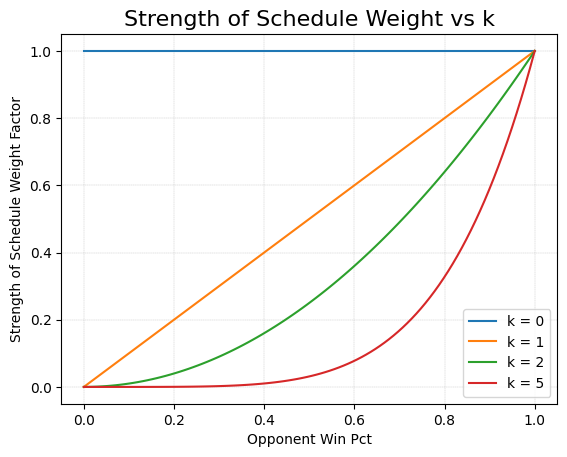

In [ ]:
x = np.linspace(0, 1, 100)
k_list = [0, 1, 2, 5]
[plt.plot(x, x**k, label = f'k = {k}') for k in k_list]
plt.title('Strength of Schedule Weight vs k', fontsize = 16)
plt.xlabel('Opponent Win Pct')
plt.ylabel('Strength of Schedule Weight Factor')
plt.grid(linestyle = '--', linewidth = 0.25)
plt.legend();

<center>Figure 6.5.1: SOS Weight Factor vs. k</center>

32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


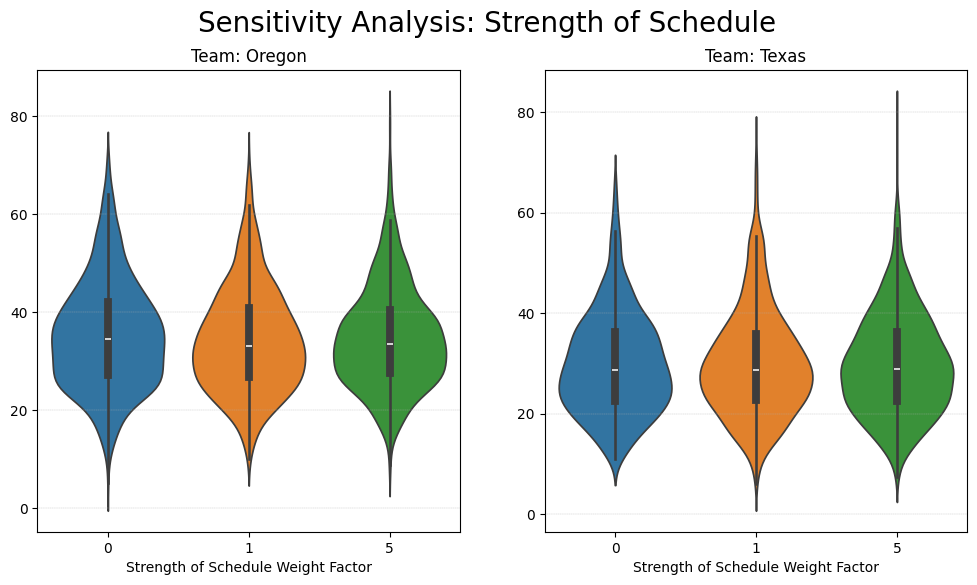

In [ ]:
team_1_points_list, team_2_points_list = [], []
team_1_points_dict, team_2_points_dict = {}, {}
expo_list = [0, 1, 5]
for i, team_1, team_2, expo in zip(range(3), ['Oregon'] * 3, ['Texas'] * 3, expo_list):
    team_1_sens = team_prediction_builder(team_1, team_2, 1000, expo, 0.05)
    team_1_points = nn_regressor.predict(scaler.transform(team_1_sens))
    team_1_points_list.append(team_1_points)
    team_1_points_dict[expo] = team_1_points.reshape(-1)

    team_2_sens = team_prediction_builder(team_2, team_1, 1000, expo, 0.05)
    team_2_points = nn_regressor.predict(scaler.transform(team_2_sens))
    team_2_points_list.append(team_2_points)
    team_2_points_dict[expo] = team_2_points.reshape(-1)

temp_df1 = pd.DataFrame(team_1_points_dict)
temp_df2 = pd.DataFrame(team_2_points_dict)

fig, axes = plt.subplots(1, 2, figsize = (12, 6))
axes = axes.flatten()
plt.suptitle(('Sensitivity Analysis: Strength of Schedule'), fontsize = 20)

for i, j, k in zip(range(2), [team_1, team_2], [temp_df1, temp_df2]):
    axes[i].set_title(f'Team: {j}')
    sns.violinplot(data = k, ax = axes[i])
    axes[i].set_xlabel('Strength of Schedule Weight Factor')
    axes[i].grid(axis = 'y', linestyle = '--', linewidth = 0.25);

<center>Figure 6.5.2: SOS Sensitivity - Oregon vs. Texas</center>

32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


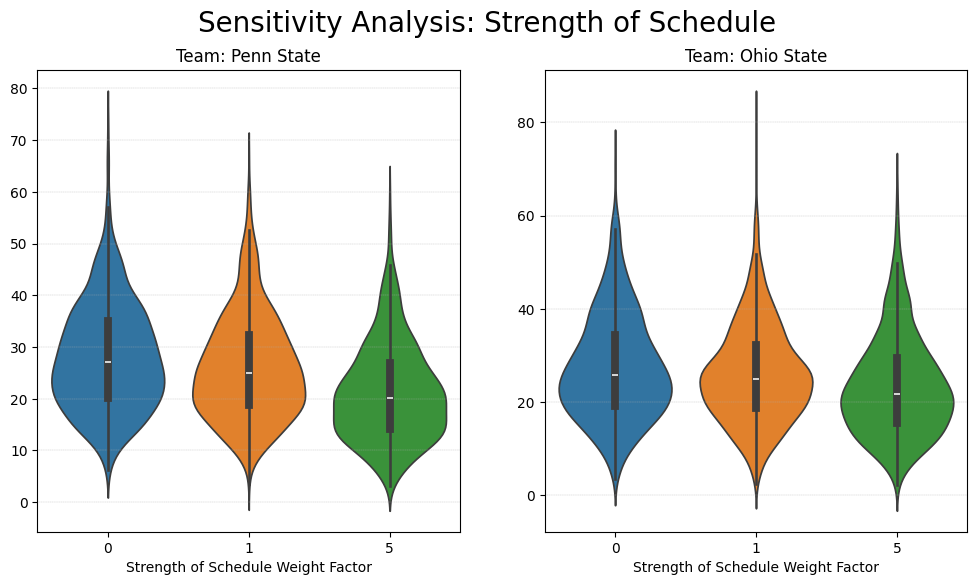

In [ ]:
team_1_points_list, team_2_points_list = [], []
team_1_points_dict, team_2_points_dict = {}, {}
expo_list = [0, 1, 5]
for i, team_1, team_2, expo in zip(range(3), ['Penn State'] * 3, ['Ohio State'] * 3, expo_list):
    team_1_sens = team_prediction_builder(team_1, team_2, 1000, expo, 0.05)
    team_1_points = nn_regressor.predict(scaler.transform(team_1_sens))
    team_1_points_list.append(team_1_points)
    team_1_points_dict[expo] = team_1_points.reshape(-1)

    team_2_sens = team_prediction_builder(team_2, team_1, 1000, expo, 0.05)
    team_2_points = nn_regressor.predict(scaler.transform(team_2_sens))
    team_2_points_list.append(team_2_points)
    team_2_points_dict[expo] = team_2_points.reshape(-1)

temp_df1 = pd.DataFrame(team_1_points_dict)
temp_df2 = pd.DataFrame(team_2_points_dict)

fig, axes = plt.subplots(1, 2, figsize = (12, 6))
axes = axes.flatten()
plt.suptitle(('Sensitivity Analysis: Strength of Schedule'), fontsize = 20)

for i, j, k in zip(range(2), [team_1, team_2], [temp_df1, temp_df2]):
    axes[i].set_title(f'Team: {j}')
    sns.violinplot(data = k, ax = axes[i])
    axes[i].set_xlabel('Strength of Schedule Weight Factor')
    axes[i].grid(axis = 'y', linestyle = '--', linewidth = 0.25);

<center>Figure 6.5.3: SOS Sensitivity - Alabama vs. Oklahoma</center>

### 6.5.2 PDF Standard Deviation

As described in Section 6.1 above, the probability density functions created for each team are an aggregate of individual Gaussian distributions - one for each game played.  Creating the individual distributions requires an assumption of standard deviation.

The following equation is used to calculate the standard deviation assumed in creating probability distributions:

$$
SD{ _{i}} = (feature{ _{max(m)}} - feature{ _{min(m)}}) * scaler{ _{SD}}
$$

Where:
* $SD{ _{i}}$ is the standard deviation used to create PDFs for each game $i$
* $feature{ _{max(m)}}$ is the maximum value in the dataset of feature $m$
* $feature{ _{min(m)}}$ is the minimum value in the dataset of feature $m$
* $scaler{ _{SD}}$ is the assumed scaling factor applied

Figures 6.5.4 and 6.5.5 below illustrate the impact on the distribution of predicted points scored with varying values of the standard deviation scaler $SD{ _{i}}$.  Increasing the value of the scaler has the effect of flattening or spreading the distributions of features provided to the predictive model.  The resulting impact on predicted points scored is both a wider range of expected points scored and an increased median value of points scored.  In Figure 6.5.4, for example, the interquartile range of predicted points scored for Oregon at a scaler value of 0.02 is approximately 25-41, while at a scaler value of 0.2 that interquartile range is 38-65.  This behavior is consistent with other matchups explored.

For the predictions generated in Section 7, a **scaler value of 0.05** is used.  Clearly, elevated scaler values such as 0.2 produce predictions that are inconsistent with the historical data in terms of points scored.

32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


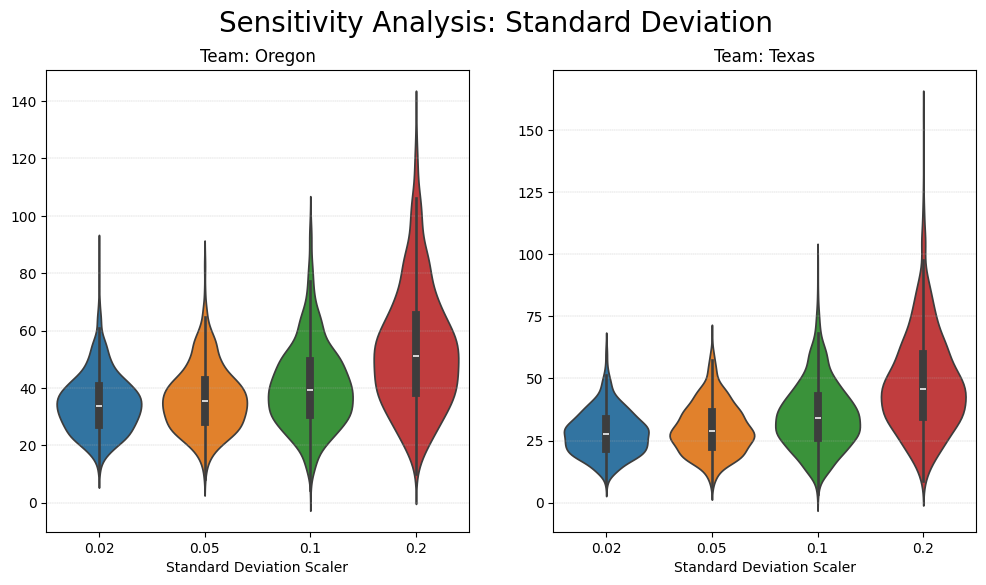

In [ ]:
team_1_points_list, team_2_points_list = [], []
team_1_points_dict, team_2_points_dict = {}, {}
sd_scaler_list = [0.02, 0.05, 0.1, 0.2]

for i, team_1, team_2, sd_scaler in zip(range(4), ['Oregon'] * 4, ['Texas'] * 4, sd_scaler_list):
    team_1_sens = team_prediction_builder(team_1, team_2, 1000, 0, sd_scaler)
    team_1_points = nn_regressor.predict(scaler.transform(team_1_sens))
    team_1_points_list.append(team_1_points)
    team_1_points_dict[sd_scaler] = team_1_points.reshape(-1)

    team_2_sens = team_prediction_builder(team_2, team_1, 1000, 0, sd_scaler)
    team_2_points = nn_regressor.predict(scaler.transform(team_2_sens))
    team_2_points_list.append(team_2_points)
    team_2_points_dict[sd_scaler] = team_2_points.reshape(-1)

temp_df1 = pd.DataFrame(team_1_points_dict)
temp_df2 = pd.DataFrame(team_2_points_dict)

fig, axes = plt.subplots(1, 2, figsize = (12, 6))
axes = axes.flatten()
plt.suptitle(('Sensitivity Analysis: Standard Deviation'), fontsize = 20)

for i, j, k in zip(range(2), [team_1, team_2], [temp_df1, temp_df2]):
    axes[i].set_title(f'Team: {j}')
    sns.violinplot(data = k, ax = axes[i])
    axes[i].set_xlabel('Standard Deviation Scaler')
    axes[i].grid(axis = 'y', linestyle = '--', linewidth = 0.25);

<center>Figure 6.5.4: Standard Deviation Sensitivity - Oregon vs. Texas</center>

32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


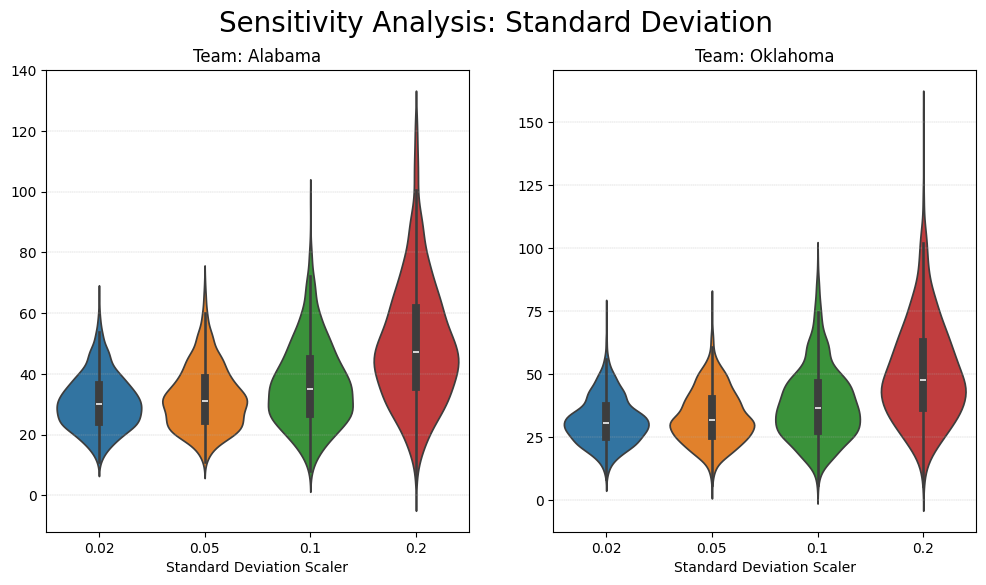

In [ ]:
team_1_points_list, team_2_points_list = [], []
team_1_points_dict, team_2_points_dict = {}, {}
sd_scaler_list = [0.02, 0.05, 0.1, 0.2]

for i, team_1, team_2, sd_scaler in zip(range(4), ['Alabama'] * 4, ['Oklahoma'] * 4, sd_scaler_list):
    team_1_sens = team_prediction_builder(team_1, team_2, 1000, 0, sd_scaler)
    team_1_points = nn_regressor.predict(scaler.transform(team_1_sens))
    team_1_points_list.append(team_1_points)
    team_1_points_dict[sd_scaler] = team_1_points.reshape(-1)

    team_2_sens = team_prediction_builder(team_2, team_1, 1000, 0, sd_scaler)
    team_2_points = nn_regressor.predict(scaler.transform(team_2_sens))
    team_2_points_list.append(team_2_points)
    team_2_points_dict[sd_scaler] = team_2_points.reshape(-1)

temp_df1 = pd.DataFrame(team_1_points_dict)
temp_df2 = pd.DataFrame(team_2_points_dict)

fig, axes = plt.subplots(1, 2, figsize = (12, 6))
axes = axes.flatten()
plt.suptitle(('Sensitivity Analysis: Standard Deviation'), fontsize = 20)

for i, j, k in zip(range(2), [team_1, team_2], [temp_df1, temp_df2]):
    axes[i].set_title(f'Team: {j}')
    sns.violinplot(data = k, ax = axes[i])
    axes[i].set_xlabel('Standard Deviation Scaler')
    axes[i].grid(axis = 'y', linestyle = '--', linewidth = 0.25);

<center>Figure 6.5.5: Standard Deviation Sensitivity - Alabama vs. Oklahoma</center>

<a id="CFP"></a>

# 7.0 2023 College Football Playoff Predictions

Section 7 brings Sections 5 and 6 together to calculate win probabilities for the each of the individual matchups in the CFP.  Sections 7.1 through 7.4 cover the four first round games, while Sections 7.5 through 7.8 detail the second round.  The CFP Championship game is detailed in Section 7.11.

It is worth noting the win probabilities for a number of matchups were incredibly narrow.  These include:
- #5 Florida State vs. #12 Oklahoma
- #7 Ohio State vs. #10 Penn State
- #2 Washington vs. #7 Ohio State

Ultimately, as detailed in Section 7.11, the model predicts #6 Georgia Bulldogs to win the national championship.


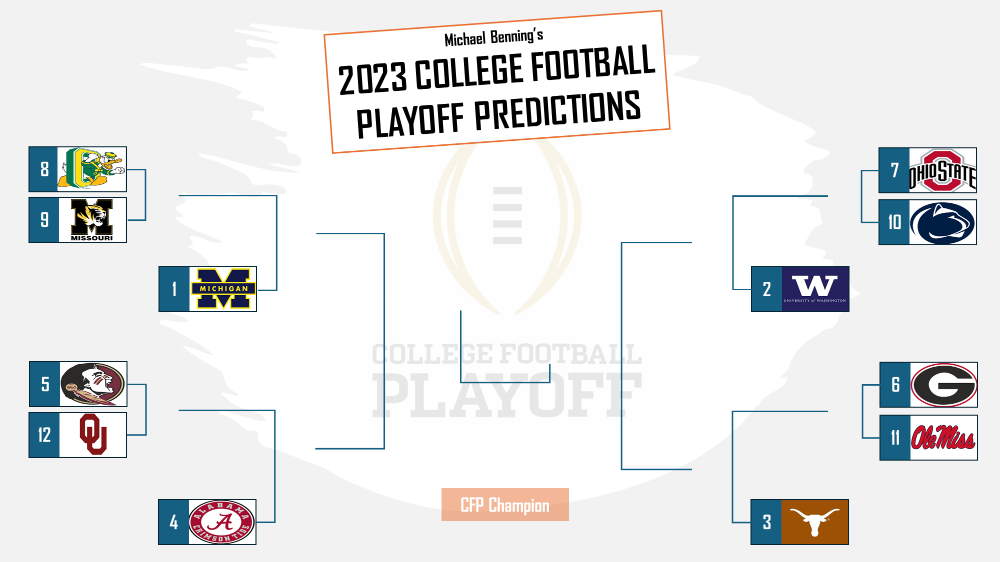

In [ ]:
def plot_helper2(title_text, team_1_points, team_2_points, team_1_name, team_2_name, team_1_win_prob, team_2_win_prob):
    fig, axes = plt.subplots(1, 2, figsize = (12, 6))
    axes = axes.flatten()
    plt.suptitle((title_text), fontsize = 20)
    axes[0].set_title('Probability Distribution: Predicted Points Scored')
    axes[0].set_xlabel('Points Scored')
    axes[0].set_ylabel('Frequency Distribution')
    axes[1].set_title('Win Probability')
    axes[1].set_xlabel('Number of Samples (Games)')
    axes[1].set_ylabel('Cumulative Win Probability')

    for i, j, k, m in zip(range(2), [team_1_points, team_2_points], [team_1_name, team_2_name], [team_1_win_prob, team_2_win_prob]):
        axes[0].hist(j, density = True, alpha = 0.5, label = k)
        axes[0].legend()
        axes[1].plot([m[0:i].sum() / len(m[0:i]) for i in range(1, len(m) + 1)], label = k)
        axes[1].legend()
        axes[i].grid(linestyle = '--', linewidth = 0.25)
        axes[1].annotate(f'{k} win probability: {round(m.sum() / len(m), 4)}', xy = [200, (m.sum() / len(m)) + 0.075]);

## 7.1 Round 1: #8 Oregon vs. #9 Missouri

Round 1 features:
- #8 Oregeon vs. #9 Missouri
- #5 Florida State vs. #12 Oklahoma
- #7 Ohio State vs. #10 Penn State
- #6 Georgia vs. #11 Ole Miss

32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


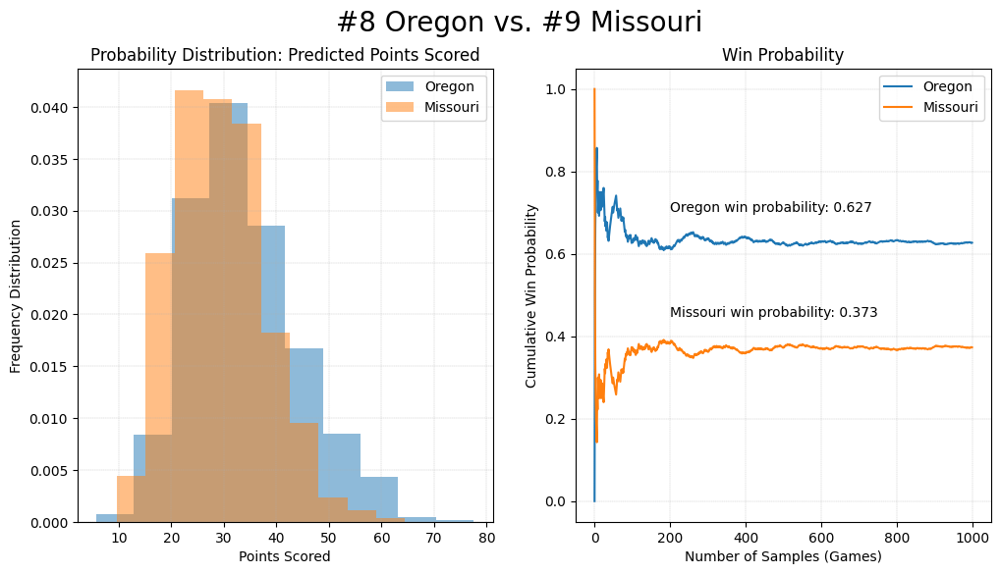

In [ ]:
Oregon_rd1 = team_prediction_builder('Oregon', 'Missouri', 1000, 1, 0.05)
Oregon_rd1_points = nn_regressor.predict(scaler.transform(Oregon_rd1))

Missouri_rd1 = team_prediction_builder('Missouri', 'Oregon', 1000, 1, 0.05)
Missouri_rd1_points = nn_regressor.predict(scaler.transform(Missouri_rd1))

Oregon_win_prob = Missouri_rd1_points < Oregon_rd1_points
plot_helper2(
    '#8 Oregon vs. #9 Missouri',
    Oregon_rd1_points, Missouri_rd1_points,
    'Oregon', 'Missouri',
    Oregon_win_prob, (1 - Oregon_win_prob)
)

<center>Figure 7.1: Round 1 - Oregon vs. Missouri</center>

## 7.2 Round 1: #5 Florida State vs. #12 Oklahoma

32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


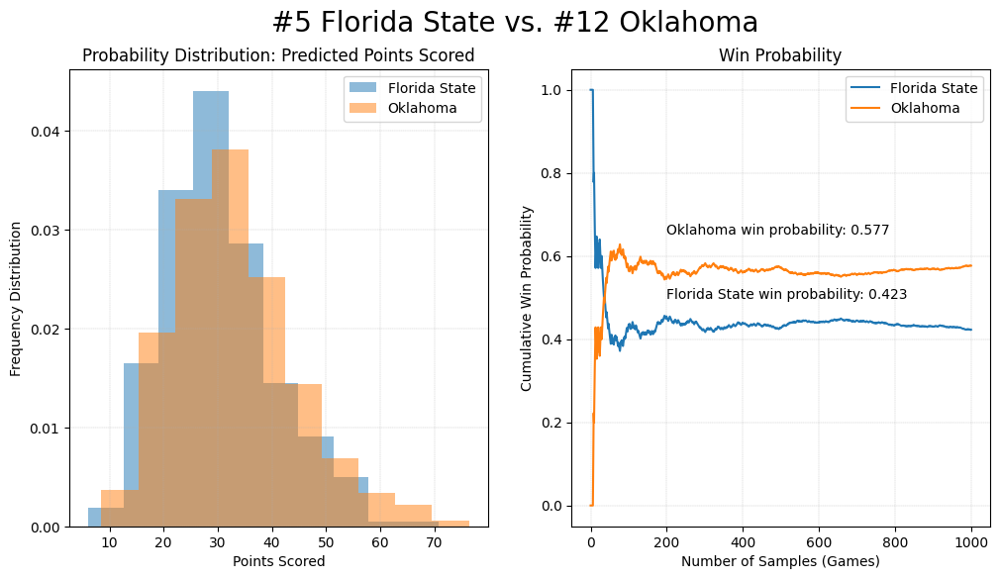

In [ ]:
Fl_state_rd1 = team_prediction_builder('Florida State', 'Oklahoma', 1000, 1, 0.05)
Fl_state_rd1_points = nn_regressor.predict(scaler.transform(Fl_state_rd1))

Oklahoma_rd1 = team_prediction_builder('Oklahoma', 'Florida State', 1000, 1, 0.05)
Oklahoma_rd1_points = nn_regressor.predict(scaler.transform(Oklahoma_rd1))

Fl_state_win_prob = Oklahoma_rd1_points < Fl_state_rd1_points
plot_helper2(
    '#5 Florida State vs. #12 Oklahoma',
    Fl_state_rd1_points, Oklahoma_rd1_points,
    'Florida State', 'Oklahoma',
    Fl_state_win_prob, (1 - Fl_state_win_prob)
)

<center>Figure 7.2: Round 1 - Florida State vs. Oklahoma</center>

## 7.3 Round 1: #7 Ohio State vs. #10 Penn State

32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


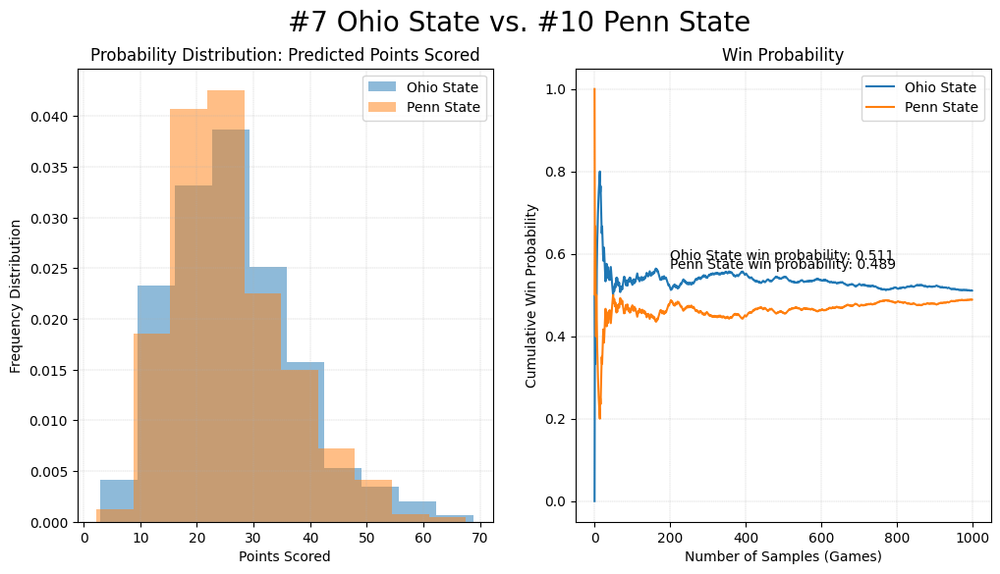

In [ ]:
Ohio_state_rd1 = team_prediction_builder('Ohio State', 'Penn State', 1000, 1, 0.05)
Ohio_state_rd1_points = nn_regressor.predict(scaler.transform(Ohio_state_rd1))

Penn_state_rd1 = team_prediction_builder('Penn State', 'Ohio State', 1000, 1, 0.05)
Penn_state_rd1_points = nn_regressor.predict(scaler.transform(Penn_state_rd1))

Ohio_state_win_prob = Penn_state_rd1_points < Ohio_state_rd1_points
plot_helper2(
    '#7 Ohio State vs. #10 Penn State',
    Ohio_state_rd1_points, Penn_state_rd1_points,
    'Ohio State', 'Penn State',
    Ohio_state_win_prob, (1 - Ohio_state_win_prob)
)

<center>Figure 7.3: Round 1 - Ohio State vs. Penn State</center>

## 7.4 Round 1: #6 Georgia vs. #11 Ole Miss

32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


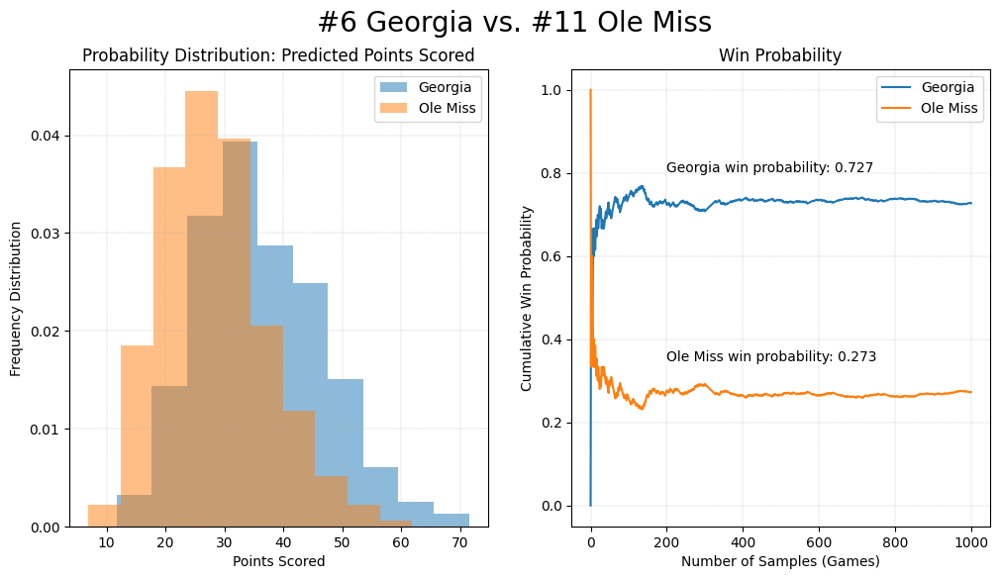

In [ ]:
Georgia_rd1 = team_prediction_builder('Georgia', 'Ole Miss', 1000, 1, 0.05)
Georgia_rd1_points = nn_regressor.predict(scaler.transform(Georgia_rd1))

Ole_miss_rd1 = team_prediction_builder('Ole Miss', 'Georgia', 1000, 1, 0.05)
Ole_miss_rd1_points = nn_regressor.predict(scaler.transform(Ole_miss_rd1))

Georgia_win_prob = Ole_miss_rd1_points < Georgia_rd1_points
plot_helper2(
    '#6 Georgia vs. #11 Ole Miss',
    Georgia_rd1_points, Ole_miss_rd1_points,
    'Georgia', 'Ole Miss',
    Georgia_win_prob, (1 - Georgia_win_prob)
)

<center>Figure 7.4: Round 1 - Georgia vs. Ole Miss</center>

## 7.5 Round 2: #1 Michigan vs. #8 Oregon

Round 2 features the following matchups:
- #1 Michigan vs. #8 Oregon
- #4 Alabama vs. #12 Oklahoma
- #2 Washington vs. #7 Ohio State
- #3 Texas vs. #6 Georgia


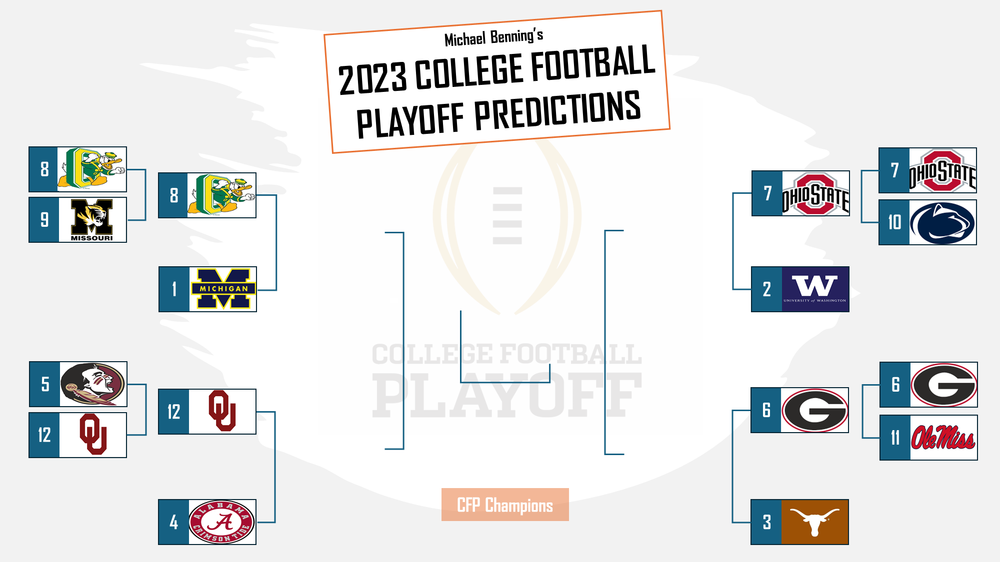

32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


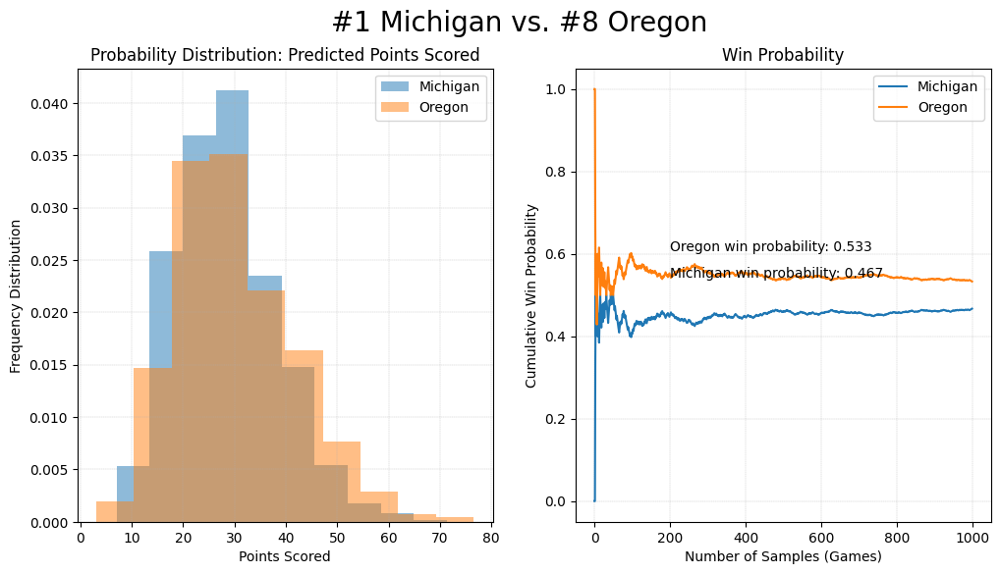

In [ ]:
Michigan_rd2 = team_prediction_builder('Michigan', 'Oregon', 1000, 1, 0.05)
Michigan_rd2_points = nn_regressor.predict(scaler.transform(Michigan_rd2))

Oregon_rd2 = team_prediction_builder('Oregon', 'Michigan', 1000, 1, 0.05)
Oregon_rd2_points = nn_regressor.predict(scaler.transform(Oregon_rd2))

Michigan_win_prob = Oregon_rd2_points < Michigan_rd2_points
plot_helper2(
    '#1 Michigan vs. #8 Oregon',
    Michigan_rd2_points, Oregon_rd2_points,
    'Michigan', 'Oregon',
    Michigan_win_prob, (1 - Michigan_win_prob)
)

<center>Figure 7.5: Round 2 - Michigan vs. Oregon</center>

## 7.6 Round 2: #4 Alabama vs. #12 Oklahoma

32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


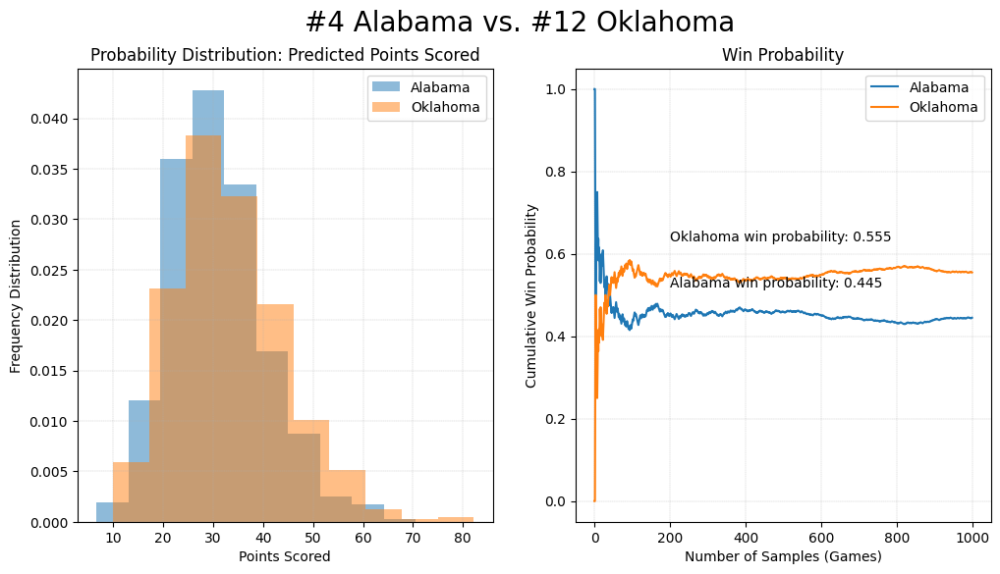

In [ ]:
Alabama_rd2 = team_prediction_builder('Alabama', 'Oklahoma', 1000, 1, 0.05)
Alabama_rd2_points = nn_regressor.predict(scaler.transform(Alabama_rd2))

Oklahoma_rd2 = team_prediction_builder('Oklahoma', 'Alabama', 1000, 1, 0.05)
Oklahoma_rd2_points = nn_regressor.predict(scaler.transform(Oklahoma_rd2))

Alabama_win_prob = Oklahoma_rd2_points < Alabama_rd2_points
plot_helper2(
    '#4 Alabama vs. #12 Oklahoma',
    Alabama_rd2_points, Oklahoma_rd2_points,
    'Alabama', 'Oklahoma',
    Alabama_win_prob, (1 - Alabama_win_prob)
)

<center>Figure 7.6: Round 2 - Alabama vs. Oklahoma</center>

## 7.7 Round 2: #2 Washington vs. #7 Ohio State

32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


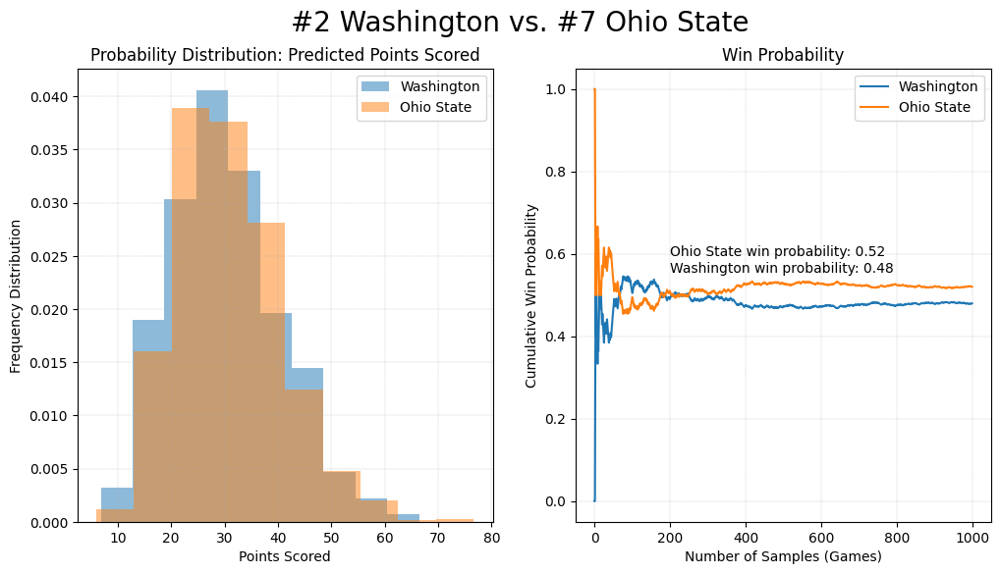

In [ ]:
Washington_rd2 = team_prediction_builder('Washington', 'Ohio State', 1000, 1, 0.05)
Washington_rd2_points = nn_regressor.predict(scaler.transform(Washington_rd2))

Ohio_State_rd2 = team_prediction_builder('Ohio State', 'Washington', 1000, 1, 0.05)
Ohio_State_rd2_points = nn_regressor.predict(scaler.transform(Ohio_State_rd2))

Washington_win_prob = Ohio_State_rd2_points < Washington_rd2_points
plot_helper2(
    '#2 Washington vs. #7 Ohio State',
    Washington_rd2_points, Ohio_State_rd2_points,
    'Washington', 'Ohio State',
    Washington_win_prob, (1 - Washington_win_prob)
)

<center>Figure 7.7: Round 2 - Washington vs. Ohio State</center>

## 7.8 Round 2: #3 Texas vs. #6 Georgia

32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


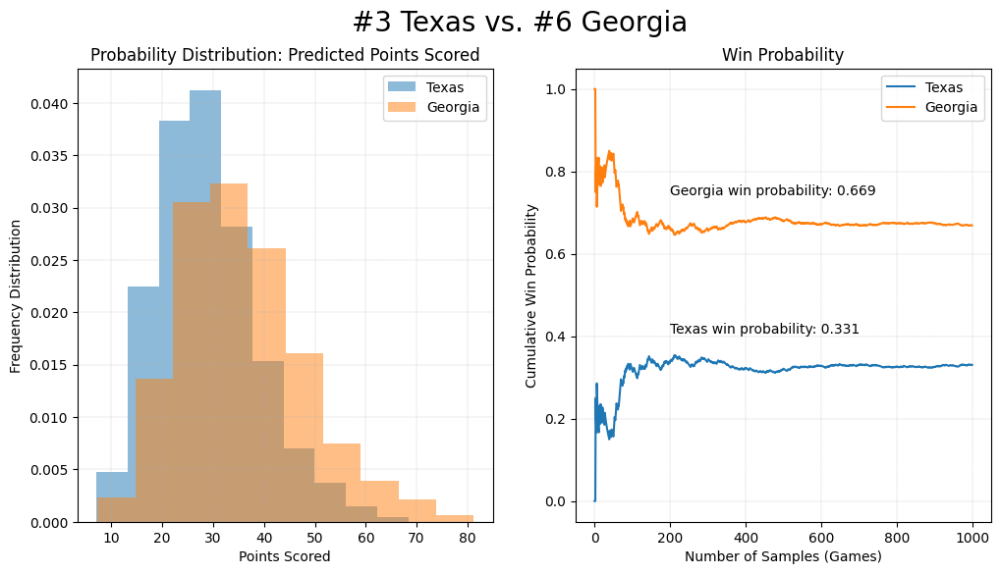

In [ ]:
Texas_rd2 = team_prediction_builder('Texas', 'Georgia', 1000, 1, 0.05)
Texas_rd2_points = nn_regressor.predict(scaler.transform(Texas_rd2))

Georgia_rd2 = team_prediction_builder('Georgia', 'Texas', 1000, 1, 0.05)
Georgia_rd2_points = nn_regressor.predict(scaler.transform(Georgia_rd2))

Texas_win_prob = Georgia_rd2_points < Texas_rd2_points
plot_helper2(
    '#3 Texas vs. #6 Georgia',
    Texas_rd2_points, Georgia_rd2_points,
    'Texas', 'Georgia',
    Texas_win_prob, (1 - Texas_win_prob)
)

<center>Figure 7.8: Round 2 - Texas vs. Georgia</center>

## 7.9 Round 3: #8 Oregon vs. #12 Oklahoma

Round 3 features the following matchups:
- #8 Oregon vs. #12 Oklahoma
- #6 Georgia vs. #7 Ohio State


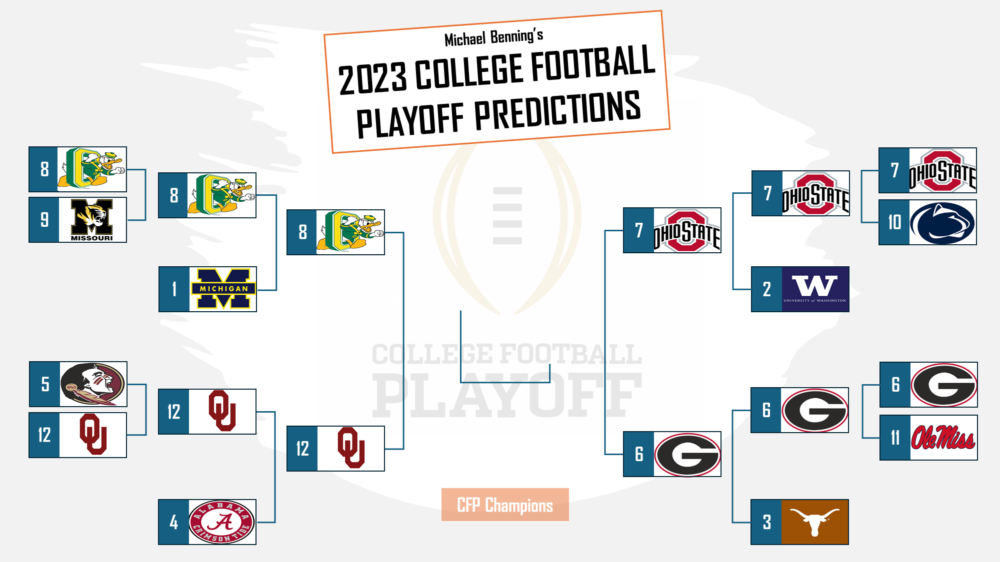

32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


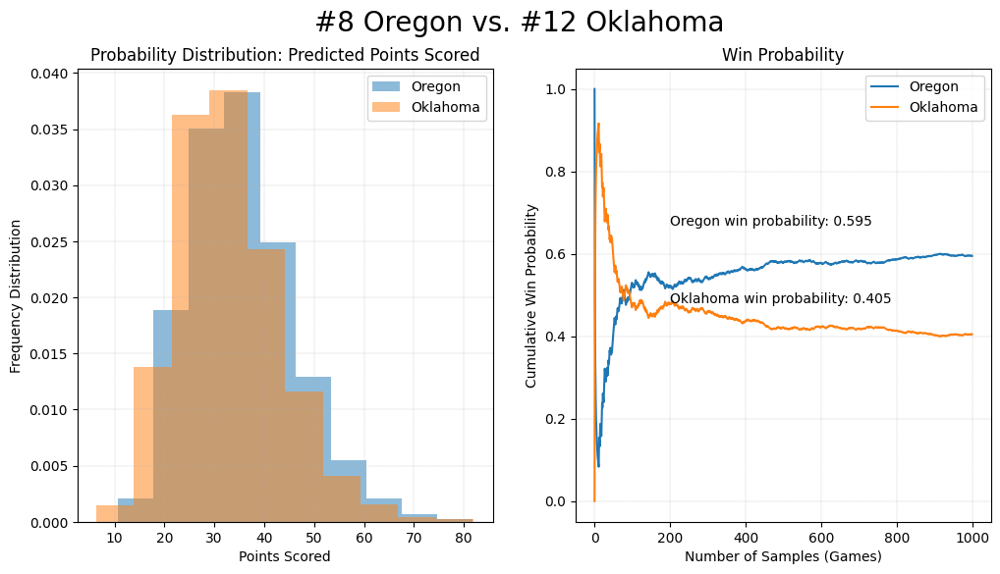

In [ ]:
Oregon_rd3 = team_prediction_builder('Oregon', 'Oklahoma', 1000, 1, 0.05)
Oregon_rd3_points = nn_regressor.predict(scaler.transform(Oregon_rd3))

Oklahoma_rd3 = team_prediction_builder('Oklahoma', 'Oregon', 1000, 1, 0.05)
Oklahoma_rd3_points = nn_regressor.predict(scaler.transform(Oklahoma_rd3))

Oregon_win_prob = Oklahoma_rd3_points < Oregon_rd3_points
plot_helper2(
    '#8 Oregon vs. #12 Oklahoma',
    Oregon_rd3_points, Oklahoma_rd3_points,
    'Oregon', 'Oklahoma',
    Oregon_win_prob, (1 - Oregon_win_prob)
)

<center>Figure 7.9: Round 2 - Oregon vs. Oklahoma</center>

## 7.10 Round 3: #6 Georgia vs. #7 Ohio State

32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


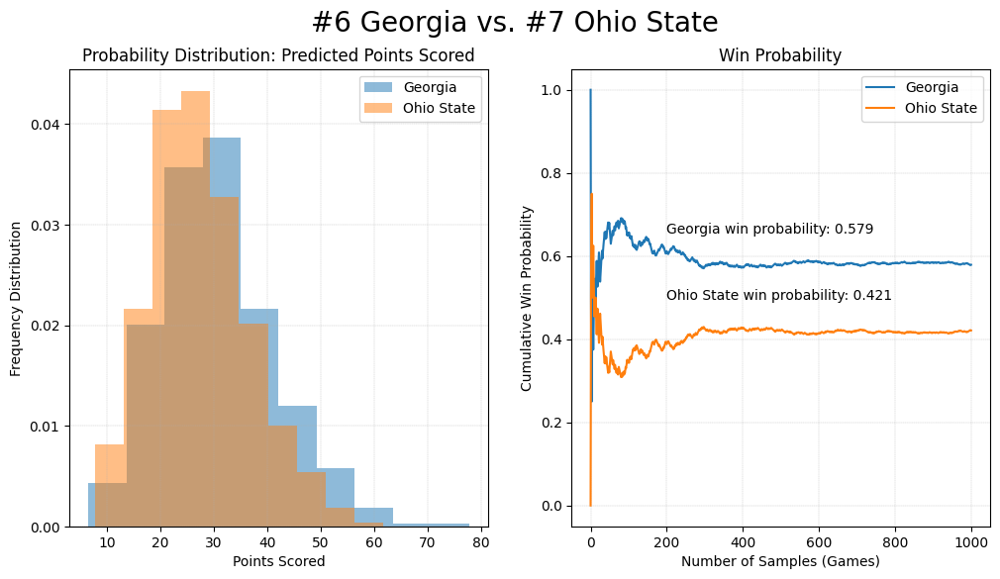

In [ ]:
Georgia_rd3 = team_prediction_builder('Georgia', 'Ohio State', 1000, 1, 0.05)
Georgia_rd3_points = nn_regressor.predict(scaler.transform(Georgia_rd3))

Ohio_State_rd3 = team_prediction_builder('Ohio State', 'Georgia', 1000, 1, 0.05)
Ohio_State_rd3_points = nn_regressor.predict(scaler.transform(Ohio_State_rd3))

Georgia_win_prob = Ohio_State_rd3_points < Georgia_rd3_points
plot_helper2(
    '#6 Georgia vs. #7 Ohio State',
    Georgia_rd3_points, Ohio_State_rd3_points,
    'Georgia', 'Ohio State',
    Georgia_win_prob, (1 - Georgia_win_prob)
)

<center>Figure 7.10: Round 2 - Georgia vs. Ohio State</center>

## 7.11 Championship Game: #8 Oregon vs. #6 Georgia

32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


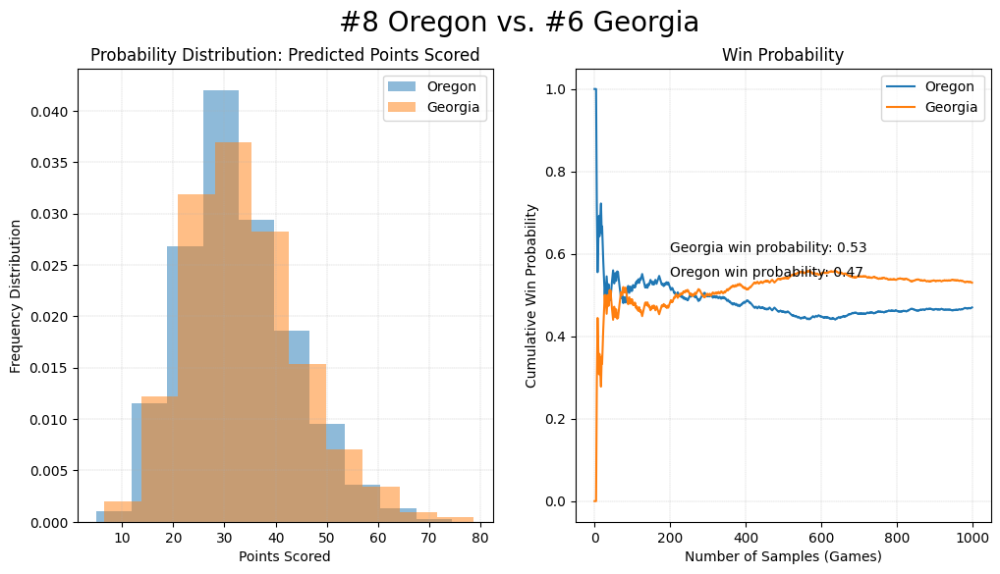

In [ ]:
Oregon_rd4 = team_prediction_builder('Oregon', 'Georgia', 1000, 1, 0.05)
Oregon_rd4_points = nn_regressor.predict(scaler.transform(Oregon_rd4))

Georgia_rd4 = team_prediction_builder('Georgia', 'Oregon', 1000, 1, 0.05)
Georgia_rd4_points = nn_regressor.predict(scaler.transform(Georgia_rd4))

Oregon_win_prob = Georgia_rd4_points < Oregon_rd4_points
plot_helper2(
    '#8 Oregon vs. #6 Georgia',
    Oregon_rd4_points, Georgia_rd4_points,
    'Oregon', 'Georgia',
    Oregon_win_prob, (1 - Oregon_win_prob)
)

<center>Figure 7.11: Round 2 - Oregon vs. Georgia</center>

<a id="Appendix"></a>

# 8.0 Appendix: Data Dictionary

The following is taken from ***collegefootballdata.com***'s glossary.

**Key Terms:**

- **Expected Points** (EP) assumes that not all yard lines are created equal. In other words, each yardline is assigned a point value and measures the number of points that would be expected to be scored based on down, distance, and field position. A negative value means that the opposing team would be expected to score the next points in the game.  **Predicted Points** (PP) are the same thing as Expected Points. There are various different models used to calculate EP. Predicted Points is this site's own custom EP model.

- **Expected Points Added** (EPA) uses Expected Points to measure the outcome of a play. It takes the EP value from the beginning of a play (e.g. 2nd and 5 at the 50) and subtracts it from the EP value resulting from the play (e.g. rush for 10 yards results in 1st and 10 from the 40).  **Predicted Points Added** (PPA) is the same thing as EPA. There are various different models for calculating EPA and EPA. PPA uses this site's custom EPA model.

- **Explosiveness** measures the average EPA on plays which were marked as successful. It uses this site's EPA implementation (known as PPA).

- **Line Yards** attempts to measure the number of running yards which are attributed to the offensive line. Yards are weighted as follows:
   - losses - 120%
   - 0-4 yards from LOS - 100%
   - 5-10 yards from LOS - 50%
   - 11+ yards from LOW - 0+

- **Open Field Yards** measures average yards per carry that comes from over 10 yards past the LOS.

- **Passing Downs** are defined as 2nd downs with 7 or more yards to go or 3rd and 4th downs with 5 or more yards to go.

- **Post game win probability** looks at advanced metrics like success rates, PPA, and scoring opportunities and assesses the probability of each team winning should the game be played again with equivalent stats. In other words, if you take all of the plays in a game and shuffle them into a random order, how often would each team be expected to win?

- **Power Success** measures the percentage of running plays on 3rd or 4th down from 2 yards or less in which an offense either converted into a 1st down or scored a TD. 1st and 2nd down and goal plays within the 2 yard line are also included.

- **Scoring Opportunities** consist of all offensive drives in which the ball has been advanced past the defense's 40 yard line.

- **Second Level Yards** measures the average yards per carry that are between 5 and 10 yards from the LOS.

- **Simple Rating System** (SRS) is a team rating mechanism which takes into account scoring margin and SOS. A team's SRS rating is how much they would be expected to win (or lose) by to a perfectly average team. You can calculate the expected score margin between two teams by calculating the difference in their SRS ratings, after accounting for home field advantage.

- **Standard Downs** are anything that is not considered to be a passing down.

- **Success Rate** is an efficiency metric that determines the success of a play. Successful plays meet one of the following criteria:
   - the offense scored
   - 1st downs which gain at least 50% of the yards to go
   - 2nd downs which gain at least 70% of the yards to go
   - 3rd and 4th downs which gain at least 100% of the yards to go


- **Stuff Rate** is the percentage of running plays stopped at or behind the line of scrimmage.

- **Usage** is the percentage of plays on which a player was involved. Recordable events include passes, incompletions, rushes, receptions, and targets.
